<a href="https://colab.research.google.com/github/AndSiq97/COVID-19-and-Vaccination-Analysis/blob/main/COVID_and_Vaccination_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import os
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

In [2]:
# Uncomment this cell, run it, then comment out cell and restart runtime to run entire notebook
# !pip install --upgrade matplotlib

Load Data

In [3]:
covid_data_url = 'https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv'
owid_covid_data = pd.read_csv(covid_data_url)

Data Analysis and Inference and Visualizations

In [4]:
# Shape of owid_covid_data
owid_covid_data.shape

(150167, 67)

In [5]:
# Columns of owid_covid_data
owid_covid_data.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [6]:
# Specify some columns not needed (to drop from dataframe)
drop_columns = ['new_cases_smoothed', 'new_deaths_smoothed', 'total_cases_per_million', 'new_cases_per_million', 'new_cases_smoothed_per_million',
                'total_deaths_per_million', 'new_deaths_per_million', 'new_deaths_smoothed_per_million', 'icu_patients_per_million',
                'hosp_patients_per_million', 'weekly_icu_admissions_per_million', 'weekly_hosp_admissions_per_million', 'total_tests_per_thousand',
                'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'new_vaccinations_smoothed',
                'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred','people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
                'new_vaccinations_smoothed_per_million','new_people_vaccinated_smoothed', 'new_people_vaccinated_smoothed_per_hundred']

len(drop_columns)

24

In [7]:
# Drop these columns as stated above
owid_covid_data.drop(drop_columns, axis = 1, inplace = True)

In [8]:
# Check number of columns now after dropping columns
len(owid_covid_data.columns)

43

In [9]:
# Check first 5 rows of dataframe
owid_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [10]:
# Check last 5 rows of dataframe
owid_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
150162,ZWE,Africa,Zimbabwe,2021-12-22,199404.0,1636.0,4828.0,9.0,1.1,NaN,NaN,NaN,NaN,4663.0,1662044.0,0.4163,2.4,tests performed,7167610.0,4078945.0,3088665.0,NaN,15664.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150163,ZWE,Africa,Zimbabwe,2021-12-23,201344.0,1940.0,4855.0,27.0,NaN,NaN,NaN,NaN,NaN,3919.0,1665963.0,0.4415,2.3,tests performed,7188128.0,4089315.0,3098813.0,NaN,20518.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150164,ZWE,Africa,Zimbabwe,2021-12-24,202736.0,1392.0,4871.0,16.0,NaN,NaN,NaN,NaN,NaN,4454.0,1670417.0,0.3407,2.9,tests performed,7200776.0,4095685.0,3105091.0,NaN,12648.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150165,ZWE,Africa,Zimbabwe,2021-12-25,203746.0,1010.0,4885.0,14.0,NaN,NaN,NaN,NaN,NaN,2903.0,1673320.0,0.3925,2.5,tests performed,7209049.0,4100069.0,3108980.0,NaN,8273.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150166,ZWE,Africa,Zimbabwe,2021-12-26,204351.0,605.0,4891.0,6.0,NaN,NaN,NaN,NaN,NaN,1843.0,1675163.0,0.3654,2.7,tests performed,7214640.0,4103288.0,3111352.0,NaN,5591.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [11]:
# Import library from datetime
from datetime import date
from datetime import datetime

# Convert columns to datetime types
owid_covid_data['date'] = pd.to_datetime(owid_covid_data['date'])

In [12]:
# Number of Unique Locations
len(owid_covid_data['location'].unique())

238

In [13]:
# Unique Locations (World, Countries, Continents, Income Types)
owid_covid_data['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethi

# Entire World COVID Data

In [14]:
# Extract data only corresponding to the Entire Worldwide
world_covid_data = owid_covid_data[owid_covid_data.location == 'World']

In [15]:
# Check first 5 rows of dataframe
world_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
147540,OWID_WRL,NaN,World,2020-01-22,557.0,0.0,17.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
147541,OWID_WRL,NaN,World,2020-01-23,655.0,98.0,18.0,1.0,3.10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
147542,OWID_WRL,NaN,World,2020-01-24,941.0,286.0,26.0,8.0,3.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
147543,OWID_WRL,NaN,World,2020-01-25,1434.0,493.0,42.0,16.0,3.44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
147544,OWID_WRL,NaN,World,2020-01-26,2118.0,684.0,56.0,14.0,3.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN


In [16]:
# Check last 5 rows of dataframe
world_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
148240,OWID_WRL,NaN,World,2021-12-22,277193837.0,899967.0,5377529.0,8053.0,1.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.872657e+09,4.499385e+09,3.778115e+09,468965087.0,32422971.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
148241,OWID_WRL,NaN,World,2021-12-23,278177141.0,983304.0,5386736.0,9207.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.916151e+09,4.508363e+09,3.788846e+09,476108749.0,43494664.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
148242,OWID_WRL,NaN,World,2021-12-24,278891403.0,747656.0,5392790.0,6126.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.945999e+09,4.513138e+09,3.797264e+09,479167951.0,29847407.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
148243,OWID_WRL,NaN,World,2021-12-25,279479162.0,587759.0,5396894.0,4104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.971953e+09,4.516893e+09,3.805321e+09,480065907.0,25954855.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
148244,OWID_WRL,NaN,World,2021-12-26,279951377.0,472215.0,5400292.0,3398.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.990045e+09,4.517718e+09,3.809216e+09,481270296.0,18091613.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN


In [17]:
# Shape of world_covid_data
world_covid_data.shape

(705, 43)

In [18]:
# Number of Null Values in Each Column
world_covid_data.isnull().sum()

iso_code                                     0
continent                                  705
location                                     0
date                                         0
total_cases                                  0
new_cases                                    0
total_deaths                                 0
new_deaths                                   0
reproduction_rate                            5
icu_patients                               705
hosp_patients                              705
weekly_icu_admissions                      705
weekly_hosp_admissions                     705
new_tests                                  705
total_tests                                705
positive_rate                              705
tests_per_case                             705
tests_units                                705
total_vaccinations                         314
people_vaccinated                          314
people_fully_vaccinated                    326
total_booster

In [19]:
# Columns
np.array(world_covid_data.columns)

array(['iso_code', 'continent', 'location', 'date', 'total_cases',
       'new_cases', 'total_deaths', 'new_deaths', 'reproduction_rate',
       'icu_patients', 'hosp_patients', 'weekly_icu_admissions',
       'weekly_hosp_admissions', 'new_tests', 'total_tests',
       'positive_rate', 'tests_per_case', 'tests_units',
       'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'total_boosters', 'new_vaccinations',
       'stringency_index', 'population', 'population_density',
       'median_age', 'aged_65_older', 'aged_70_older', 'gdp_per_capita',
       'extreme_poverty', 'cardiovasc_death_rate', 'diabetes_prevalence',
       'female_smokers', 'male_smokers', 'handwashing_facilities',
       'hospital_beds_per_thousand', 'life_expectancy',
       'human_development_index', 'excess_mortality_cumulative_absolute',
       'excess_mortality_cumulative', 'excess_mortality',
       'excess_mortality_cumulative_per_million'], dtype=object)

## Worldwide Population

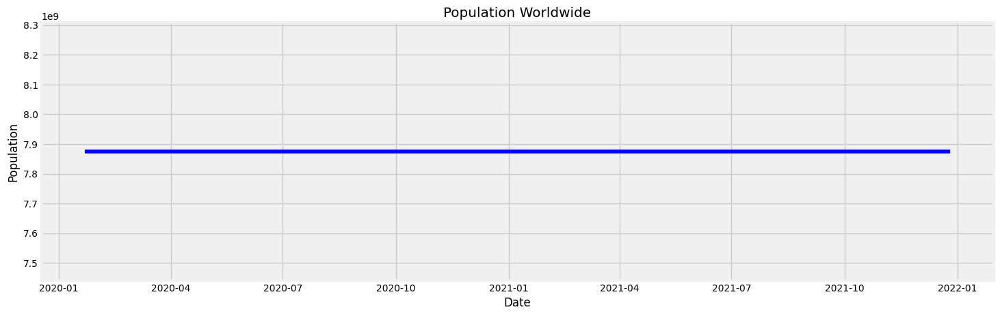

In [20]:
# Note that Population Worldwide Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['population'], color='blue')
title = 'Population Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [21]:
group = world_covid_data.groupby("location")["population"].max()
print("Worldwide Population")
print("                   ")
group

Worldwide Population
                   


location
World    7.874966e+09
Name: population, dtype: float64

## Worldwide Population Density

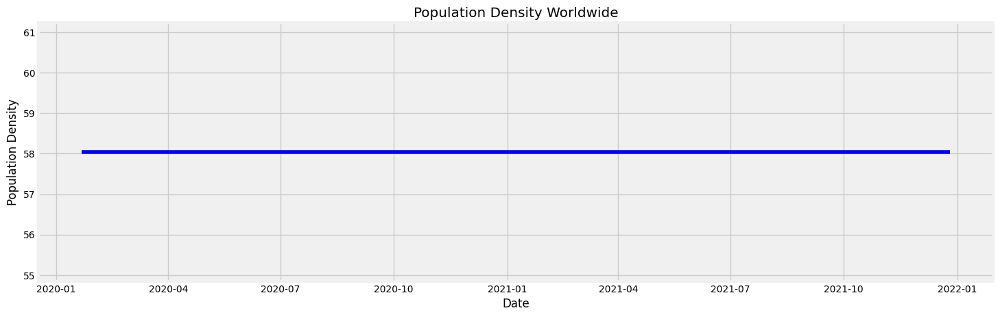

In [22]:
# Note that Population Density Worldwide Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['population_density'], color='blue')
title = 'Population Density Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population Density')
plt.show()

In [23]:
group = world_covid_data.groupby("location")["population_density"].max()
print("Worldwide Population Density")
print("                   ")
group

Worldwide Population Density
                   


location
World    58.045
Name: population_density, dtype: float64

## Worldwide Cases (Cumulative and Daily New Number of Cases) Over Time 

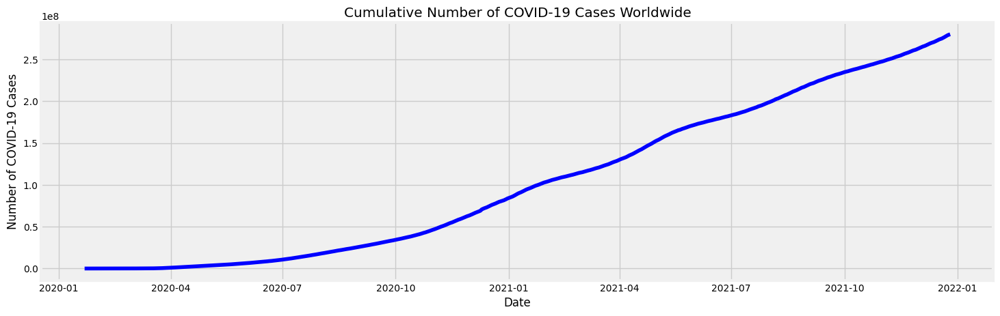

In [24]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_cases'], color='blue')
title = 'Cumulative Number of COVID-19 Cases Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Cases')
plt.show()

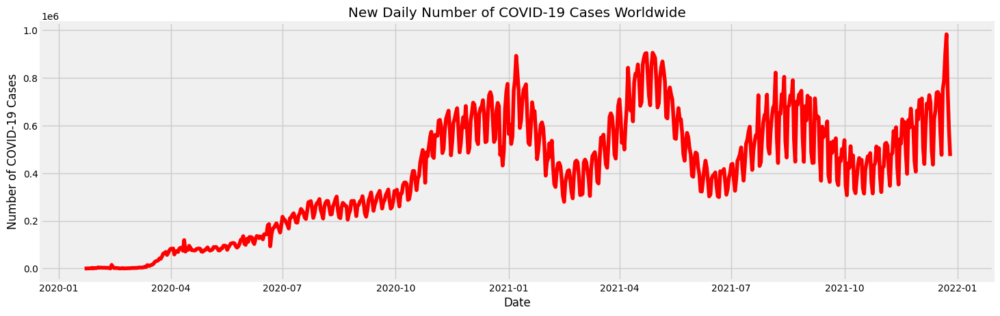

In [25]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_cases'], color='red')
title = 'New Daily Number of COVID-19 Cases Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Cases')
plt.show()

## Worldwide Deaths (Cumulative and Daily New Number of Deaths) Over Time

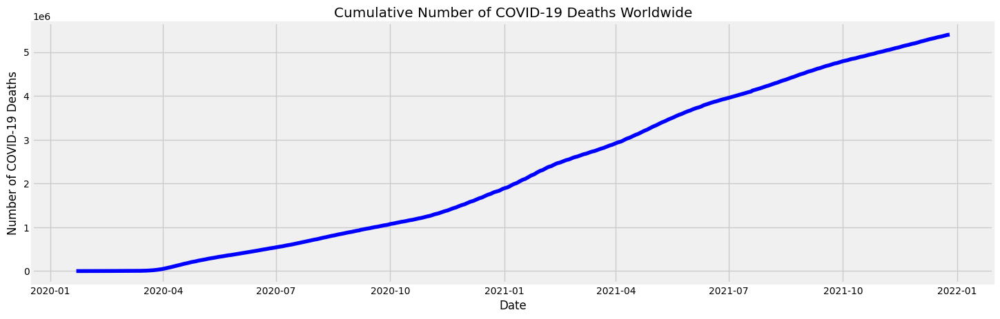

In [26]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_deaths'], color='blue')
title = 'Cumulative Number of COVID-19 Deaths Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Deaths')
plt.show()

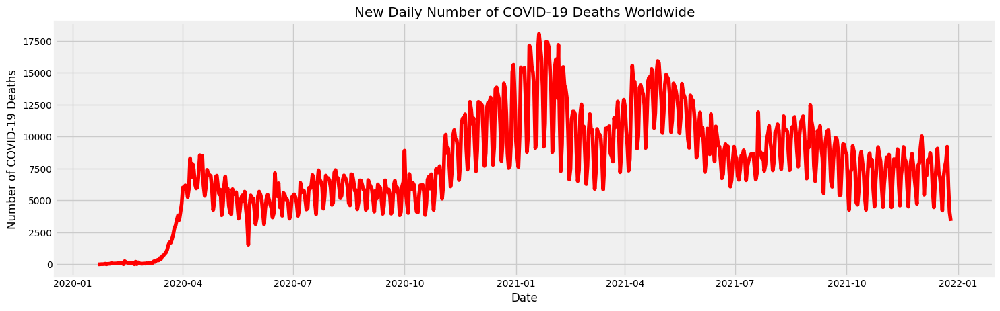

In [27]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_deaths'], color='red')
title = 'New Daily Number of COVID-19 Deaths Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Deaths')
plt.show()

## Worldwide Vaccinations (Cumulative and Daily New Number of Vaccinations) for COVID-19 Over Time

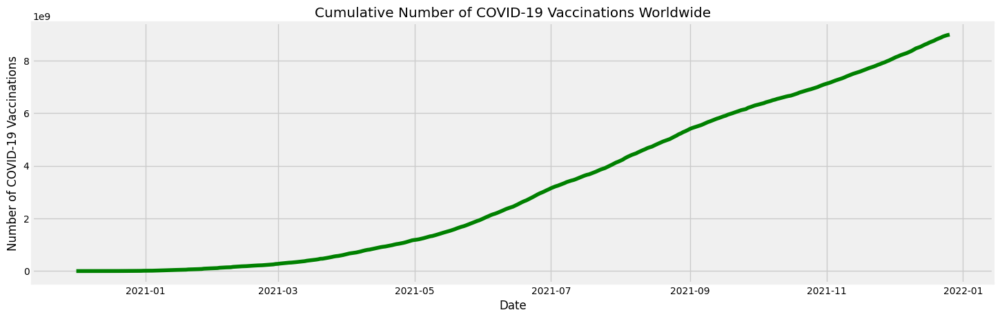

In [28]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_vaccinations'], color='green')
title = 'Cumulative Number of COVID-19 Vaccinations Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Vaccinations')
plt.show()

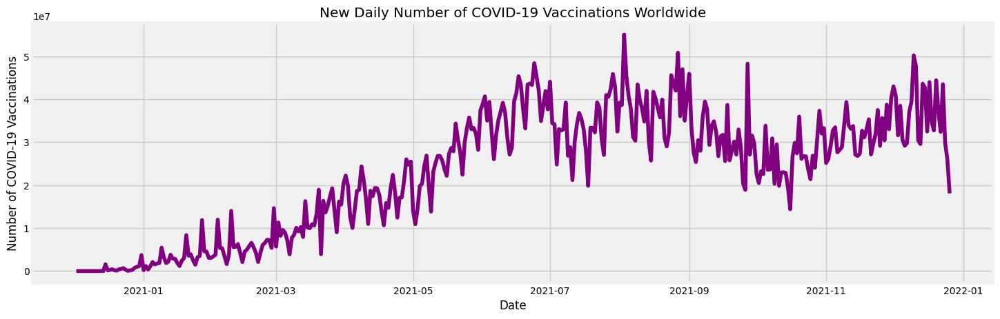

In [29]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_vaccinations'], color='purple')
title = 'New Daily Number of COVID-19 Vaccinations Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Vaccinations')
plt.show()

## Worldwide Cumulative Number of Fully and Partially Vaccinated People for COVID-19 Over Time

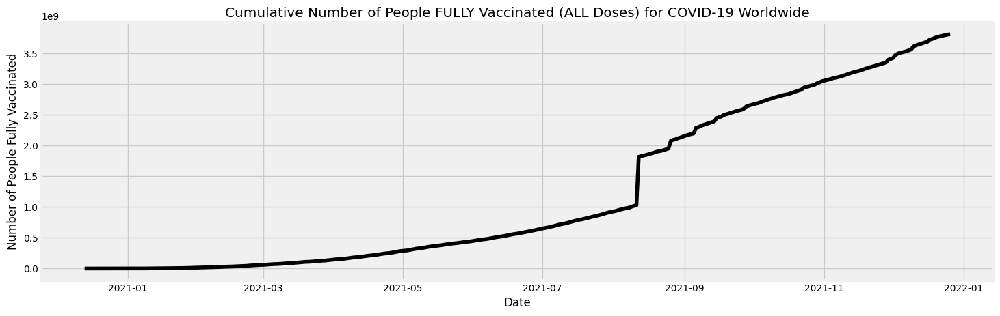

In [30]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['people_fully_vaccinated'], color='black')
title = 'Cumulative Number of People FULLY Vaccinated (ALL Doses) for COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of People Fully Vaccinated')
plt.show()

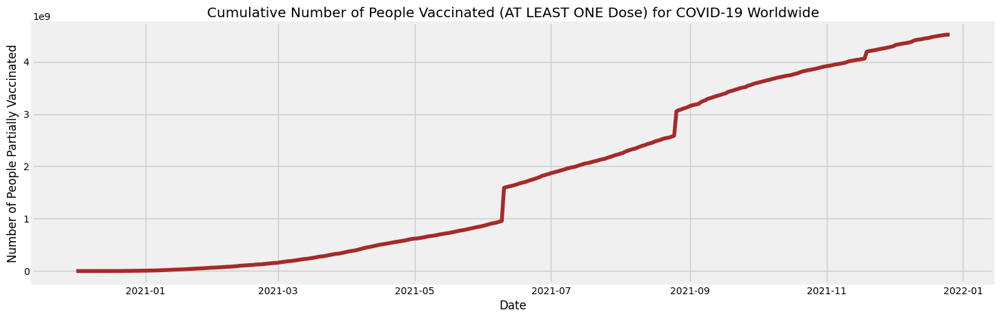

In [31]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['people_vaccinated'], color='brown')
title = 'Cumulative Number of People Vaccinated (AT LEAST ONE Dose) for COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of People Partially Vaccinated')
plt.show()

## Total Number of COVID-19 Cases Worldwide

In [32]:
group = world_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Worldwide")
print("                   ")
group

Total Number of COVID-19 Cases Worldwide
                   


location
World    279411984.0
Name: new_cases, dtype: float64

## Mean Daily New Number of COVID-19 Cases Worldwide

In [33]:
group = world_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Worldwide
                   


location
World    396329.055319
Name: new_cases, dtype: float64

## Total Number of COVID-19 Deaths Worldwide

In [34]:
group = world_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Worldwide")
print("                   ")
group

Total Number of COVID-19 Deaths Worldwide
                   


location
World    5376063.0
Name: new_deaths, dtype: float64

## Mean Daily New Number of COVID-19 Deaths Worldwide

In [35]:
group = world_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Worldwide
                   


location
World    7625.621277
Name: new_deaths, dtype: float64

## Total Number of COVID-19 Vaccinations Worldwide

In [36]:
group = world_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Worldwide")
print("                   ")
group

Total Number of COVID-19 Vaccinations Worldwide
                   


location
World    8.990045e+09
Name: new_vaccinations, dtype: float64

## Mean Daily New Number of COVID-19 Vaccinations Worldwide

In [37]:
group = world_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Worldwide
                   


location
World    2.305140e+07
Name: new_vaccinations, dtype: float64

## Total Number of People Vaccinated (At LEAST One Dose) Against COVID-19 Worldwide

In [38]:
group = world_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Worldwide")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Worldwide
                   


location
World    4.517718e+09
Name: people_vaccinated, dtype: float64

## Total Number of FULLY Vaccinated People Against COVID-19 Worldwide

In [39]:
group = world_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Worldwide")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Worldwide
                   


location
World    3.809216e+09
Name: people_fully_vaccinated, dtype: float64

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Worldwide

In [ ]:
world_covid_data['Proportion_of_cases_of_population'] = world_covid_data['total_cases'] / world_covid_data['population']
world_covid_data['Proportion_of_deaths_of_population'] = world_covid_data['total_deaths'] / world_covid_data['population']
world_covid_data['Proportion_of_deaths_of_pos_cases'] = world_covid_data['total_deaths'] / world_covid_data['total_cases']
world_covid_data['Proportion_of_vaccinated_of_population'] = world_covid_data['people_vaccinated'] / world_covid_data['population']
world_covid_data['Proportion_of_fully_vaccinated_of_population'] = world_covid_data['people_fully_vaccinated'] / world_covid_data['population']

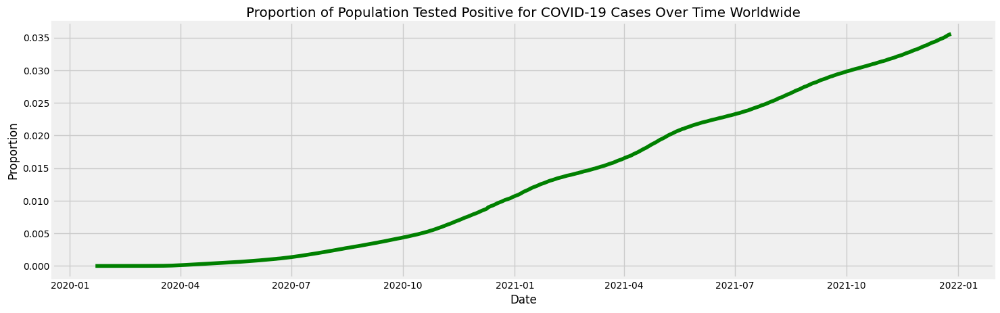

In [41]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_cases_of_population'], color='green')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

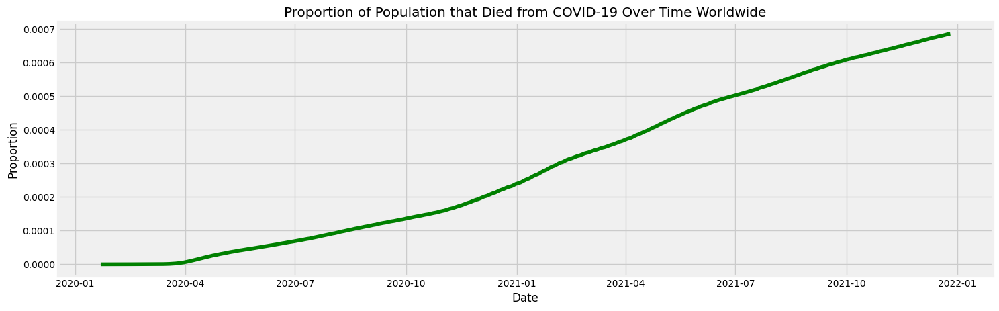

In [42]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_deaths_of_population'], color='green')
title = 'Proportion of Population that Died from COVID-19 Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

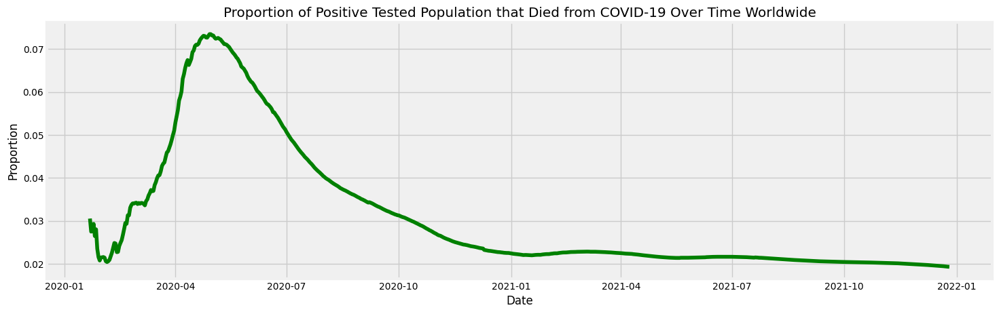

In [43]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_deaths_of_pos_cases'], color='green')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

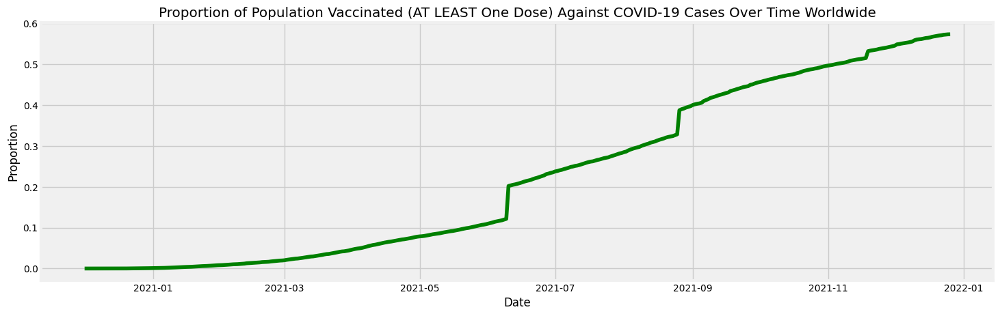

In [44]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_vaccinated_of_population'], color='green')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

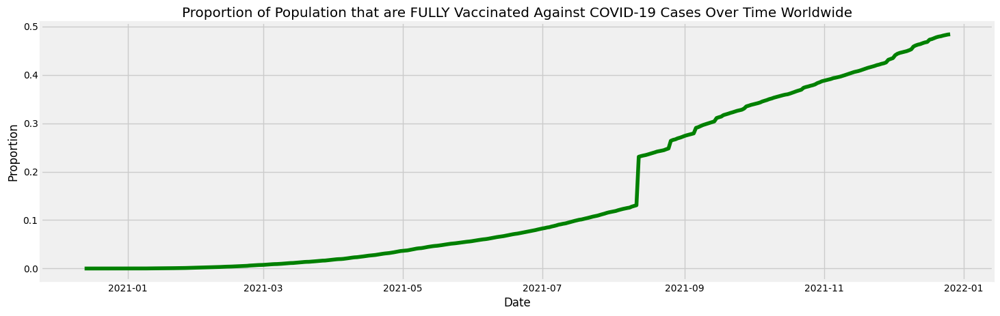

In [45]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_fully_vaccinated_of_population'], color='green')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Worldwide

In [46]:
group = world_covid_data.groupby("location")["new_cases"].sum() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Worldwide")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Worldwide
                   


location
World    0.035481
dtype: float64

In [47]:
group = world_covid_data.groupby("location")["new_deaths"].sum() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Worldwide")
print("                   ")
group

Proportion of Population that Died from COVID-19 Worldwide
                   


location
World    0.000683
dtype: float64

## Proportion of Population Tested Positive for COVID-19 that Have Died From COVID-19 Worldwide

In [48]:
group = world_covid_data.groupby("location")["new_deaths"].sum() / world_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Worldwide")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Worldwide
                   


location
World    0.019241
dtype: float64

## Proportion of Population Vaccinated (Fully or Partially) Against COVID-19 Worldwide

In [49]:
group = world_covid_data.groupby("location")["people_vaccinated"].max() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Worldwide")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Worldwide
                   


location
World    0.573681
dtype: float64

In [50]:
group = world_covid_data.groupby("location")["people_fully_vaccinated"].max() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Worldwide")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Worldwide
                   


location
World    0.483712
dtype: float64

## Worldwide Reproduction Rate of COVID-19

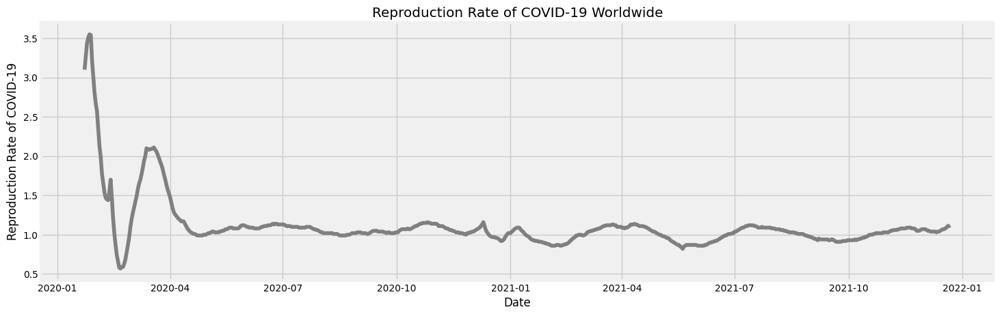

In [51]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['reproduction_rate'], color='gray')
title = 'Reproduction Rate of COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Reproduction Rate of COVID-19')
plt.show()

In [54]:
group = world_covid_data.groupby("location")["reproduction_rate"].mean()
print("Average Daily Reproduction Rate of COVID-19 Worldwide")
print("                   ")
group

Average Daily Reproduction Rate of COVID-19 Worldwide
                   


location
World    1.105686
Name: reproduction_rate, dtype: float64

## Continents COVID-19 Data

In [52]:
# Extracting data only corresponding to Continents in the World
continents = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania']
continents_covid_data = owid_covid_data[owid_covid_data['location'].isin(continents)]

In [53]:
# Check first 5 rows of dataframe
continents_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
672,OWID_AFR,NaN,Africa,2020-02-13,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
673,OWID_AFR,NaN,Africa,2020-02-14,1.0,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
674,OWID_AFR,NaN,Africa,2020-02-15,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
675,OWID_AFR,NaN,Africa,2020-02-16,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
676,OWID_AFR,NaN,Africa,2020-02-17,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
# Check last 5 rows of dataframe
continents_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
125865,OWID_SAM,NaN,South America,2021-12-22,39330040.0,19770.0,1189567.0,263.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,637554761.0,327877820.0,274049963.0,47604714.0,2864501.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125866,OWID_SAM,NaN,South America,2021-12-23,39356178.0,26138.0,1189898.0,331.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,639154713.0,328092328.0,274726411.0,48314467.0,1599952.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125867,OWID_SAM,NaN,South America,2021-12-24,39388116.0,31938.0,1190226.0,328.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,639770959.0,328212426.0,275006569.0,48543213.0,616246.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125868,OWID_SAM,NaN,South America,2021-12-25,39411558.0,23442.0,1190409.0,183.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,639787191.0,328213412.0,275008258.0,48556770.0,16232.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125869,OWID_SAM,NaN,South America,2021-12-26,39430318.0,18760.0,1190544.0,135.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,639801412.0,328215766.0,275011045.0,48565779.0,14221.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
# Shape of continents_covid_data
continents_covid_data.shape

(4173, 43)

In [57]:
# Number of Null Values in Each Column
continents_covid_data.isnull().sum()

iso_code                                      0
continent                                  4173
location                                      0
date                                          0
total_cases                                   4
new_cases                                     0
total_deaths                                134
new_deaths                                    0
reproduction_rate                          4173
icu_patients                               4173
hosp_patients                              4173
weekly_icu_admissions                      4173
weekly_hosp_admissions                     4173
new_tests                                  4173
total_tests                                4173
positive_rate                              4173
tests_per_case                             4173
tests_units                                4173
total_vaccinations                         2002
people_vaccinated                          2002
people_fully_vaccinated                 

In [58]:
# Check to see unique Continents 
continents_covid_data['location'].unique()

array(['Africa', 'Asia', 'Europe', 'North America', 'Oceania',
       'South America'], dtype=object)

In [59]:
# Set Index to Date
continents_covid_data.set_index('date', inplace = True)

## Population Between Continents

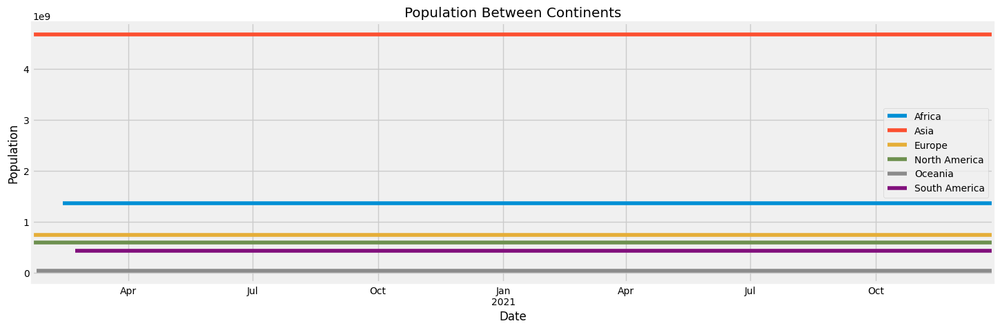

In [60]:
# Note that Population Between Continents Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['population'].plot(legend='True')
title = 'Population Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [61]:
group = continents_covid_data.groupby("location")["population"].max()
print("Population Between Continents")
print("                   ")
group

Population Between Continents
                   


location
Africa           1.373486e+09
Asia             4.678445e+09
Europe           7.489630e+08
North America    5.965813e+08
Oceania          4.321995e+07
South America    4.342601e+08
Name: population, dtype: float64

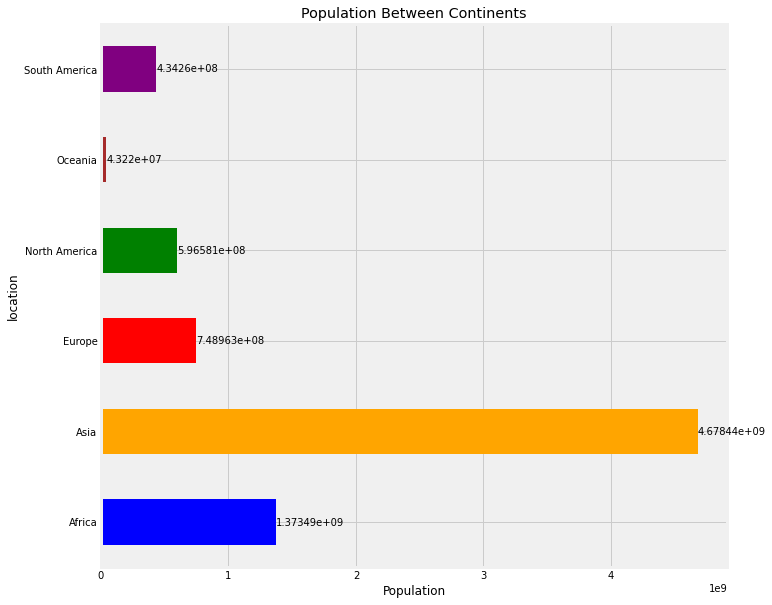

In [62]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Population Between Continents")
plt.xlabel("Population")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Continents

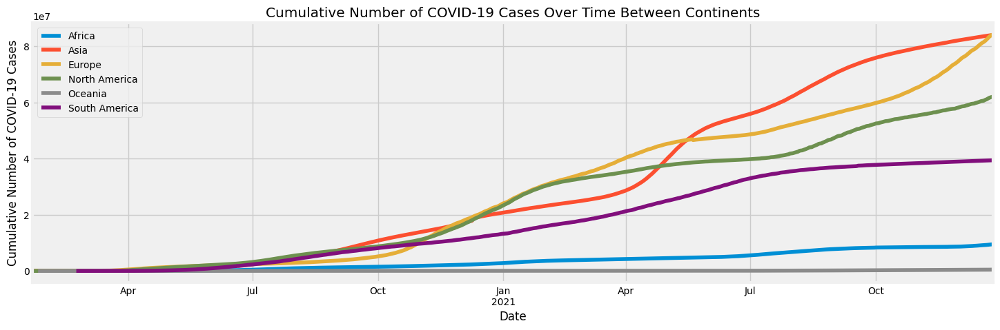

In [63]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_cases'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
plt.show()

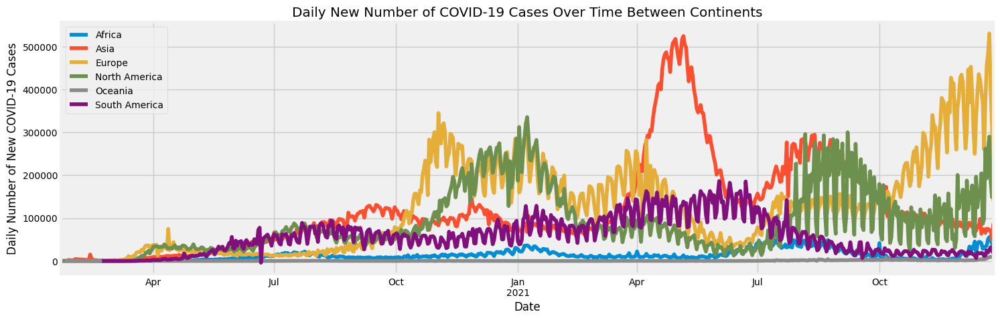

In [64]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_cases'].plot(legend='True')
title = 'Daily New Number of COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Continents

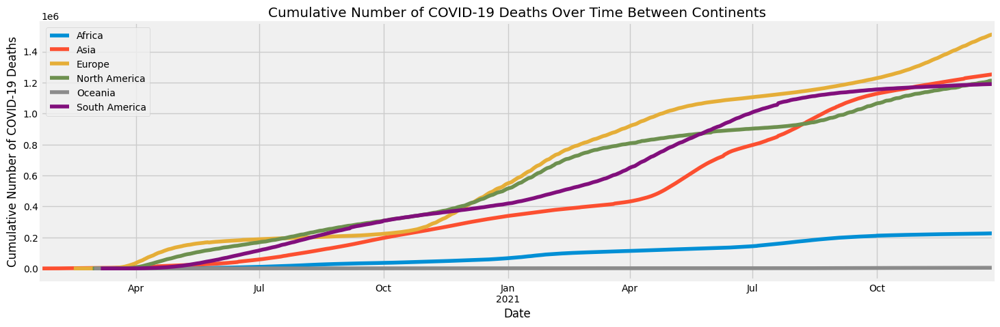

In [65]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_deaths'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Deaths Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
plt.show()

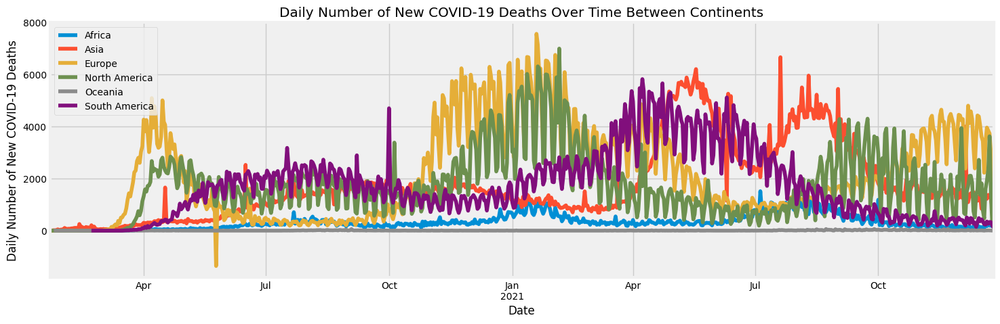

In [66]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_deaths'].plot(legend='True')
title = 'Daily Number of New COVID-19 Deaths Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Against COVID-19 Over Time Between Continents

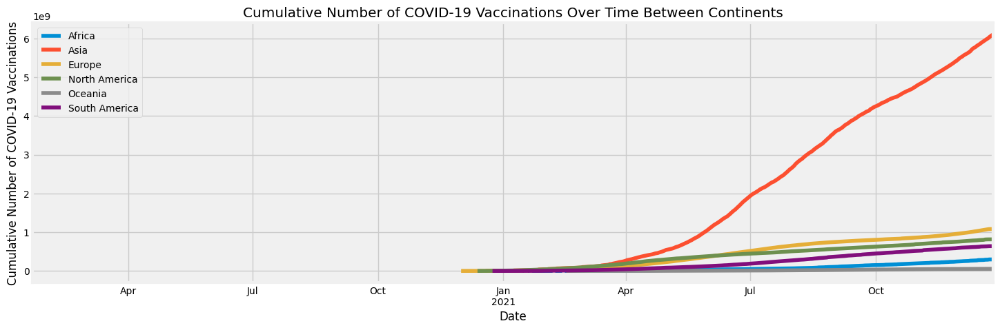

In [67]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_vaccinations'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
plt.show()

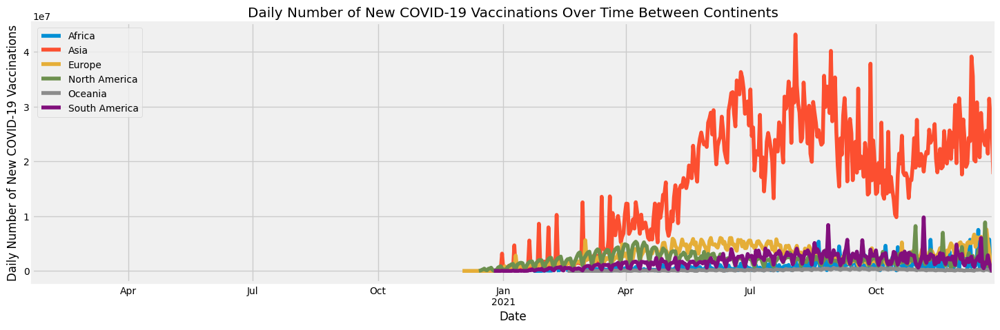

In [68]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_vaccinations'].plot(legend='True')
title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Continents

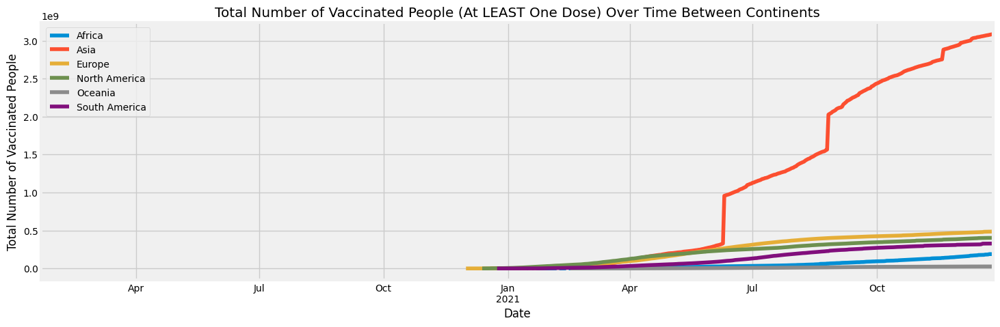

In [69]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['people_vaccinated'].plot(legend='True')
title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Vaccinated People')
plt.show()

## Total Number of Fully Vaccinated People Against COVID-19 Over Time Between Continents

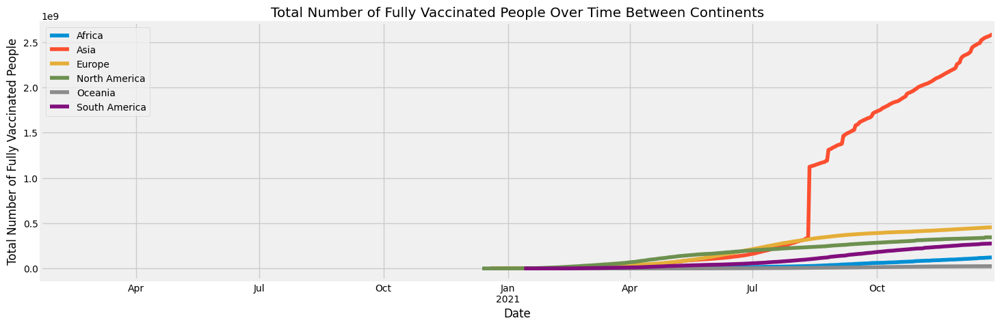

In [70]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['people_fully_vaccinated'].plot(legend='True')
title = 'Total Number of Fully Vaccinated People Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Continents

In [71]:
group = continents_covid_data.groupby("location")["new_cases"].sum() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Between Continents")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Between Continents
                   


location
Africa           0.006885
Asia             0.017804
Europe           0.113063
North America    0.104261
Oceania          0.010941
South America    0.090511
dtype: float64

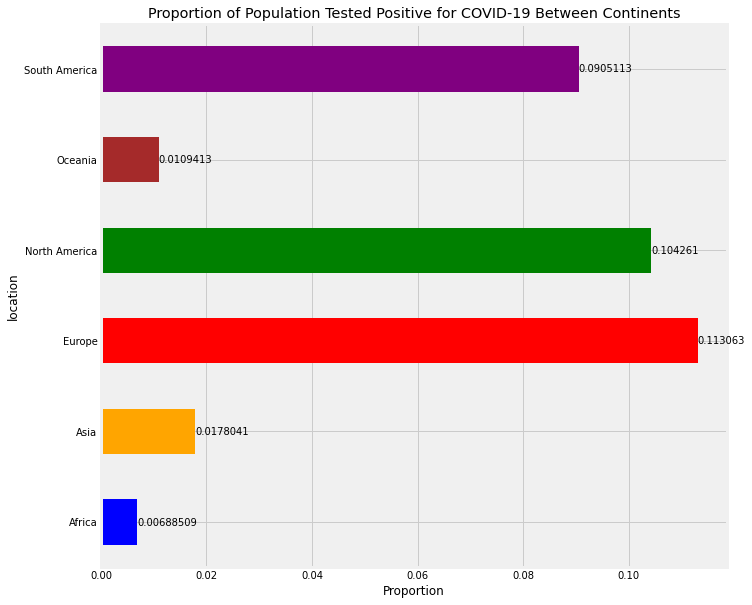

In [72]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population Tested Positive for COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [73]:
group = continents_covid_data.groupby("location")["new_deaths"].sum() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Between Continents")
print("                   ")
group

Proportion of Population that Died from COVID-19 Between Continents
                   


location
Africa           0.000165
Asia             0.000266
Europe           0.002019
North America    0.002025
Oceania          0.000103
South America    0.002712
dtype: float64

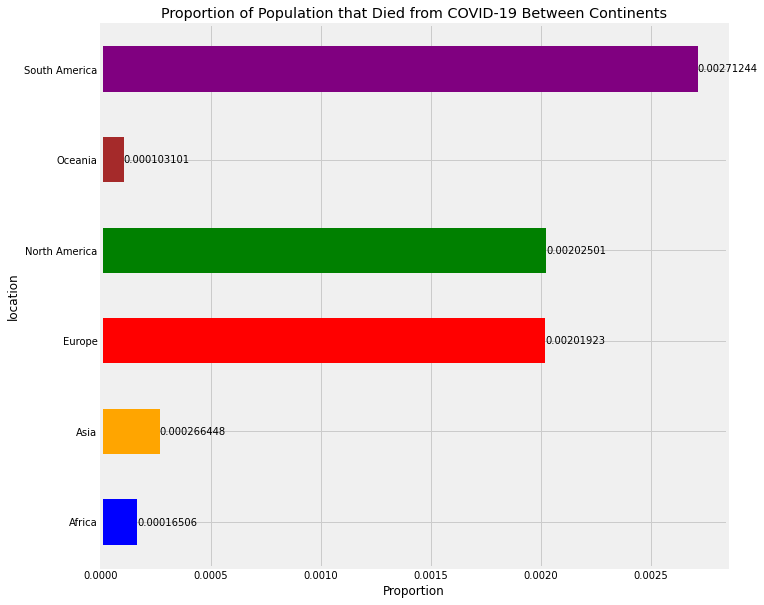

In [74]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population that Died from COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Continents

In [75]:
group = continents_covid_data.groupby("location")["new_deaths"].sum() / continents_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Between Continents")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Between Continents
                   


location
Africa           0.023974
Asia             0.014966
Europe           0.017859
North America    0.019422
Oceania          0.009423
South America    0.029968
dtype: float64

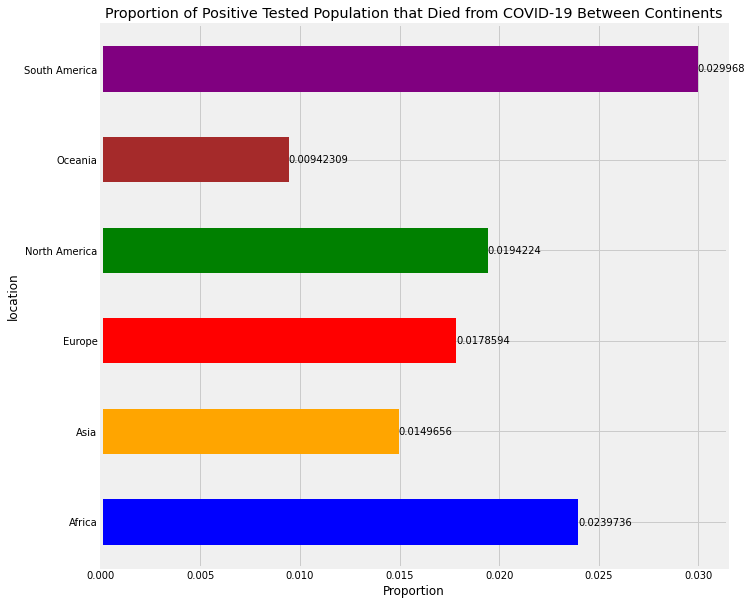

In [76]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Positive Tested Population that Died from COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Continents

In [77]:
group = continents_covid_data.groupby("location")["people_vaccinated"].max() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents
                   


location
Africa           0.137586
Asia             0.659573
Europe           0.648672
North America    0.674928
Oceania          0.607871
South America    0.755805
dtype: float64

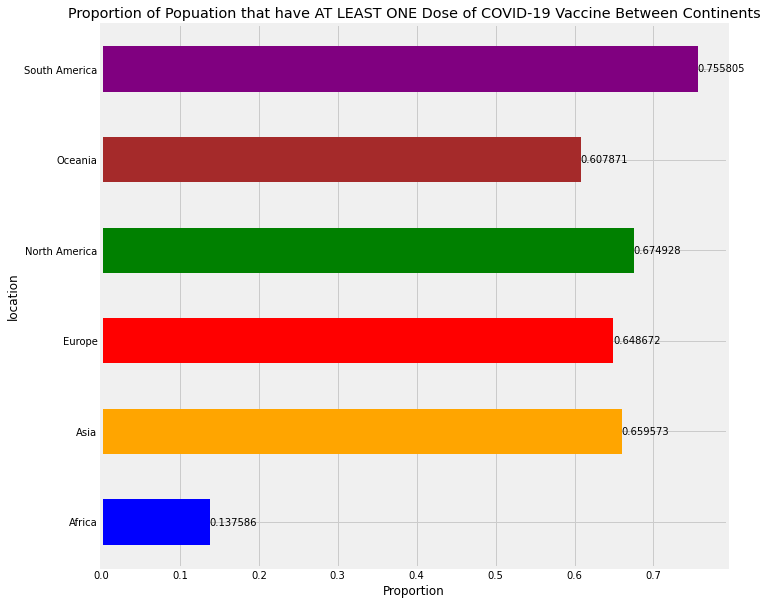

In [78]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [79]:
group = continents_covid_data.groupby("location")["people_fully_vaccinated"].max() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Between Continents")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Between Continents
                   


location
Africa           0.088376
Asia             0.553366
Europe           0.607103
North America    0.576948
Oceania          0.579233
South America    0.633286
dtype: float64

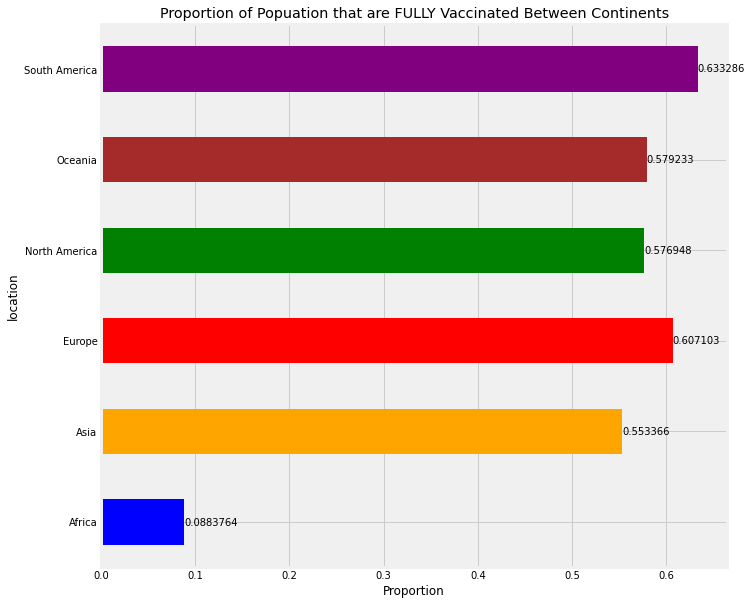

In [80]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that are FULLY Vaccinated Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Continents 

In [ ]:
continents_covid_data['Proportion_of_cases_of_population'] = continents_covid_data['total_cases'] / continents_covid_data['population']
continents_covid_data['Proportion_of_deaths_of_population'] = continents_covid_data['total_deaths'] / continents_covid_data['population']
continents_covid_data['Proportion_of_deaths_of_pos_cases'] = continents_covid_data['total_deaths'] / continents_covid_data['total_cases']
continents_covid_data['Proportion_of_vaccinated_of_population'] = continents_covid_data['people_vaccinated'] / continents_covid_data['population']
continents_covid_data['Proportion_of_fully_vaccinated_of_population'] = continents_covid_data['people_fully_vaccinated'] / continents_covid_data['population']

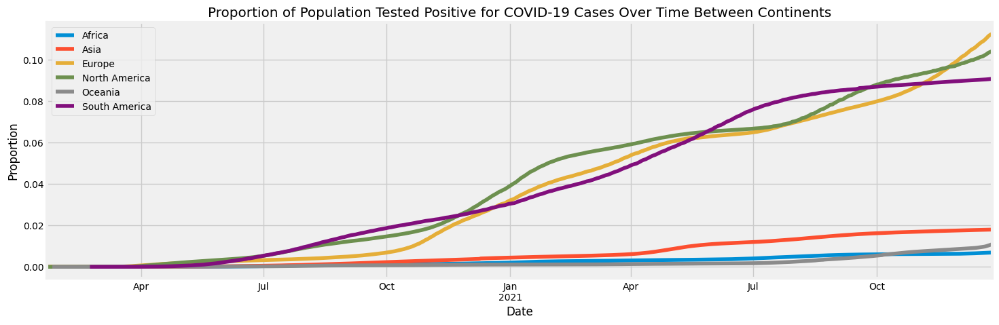

In [82]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

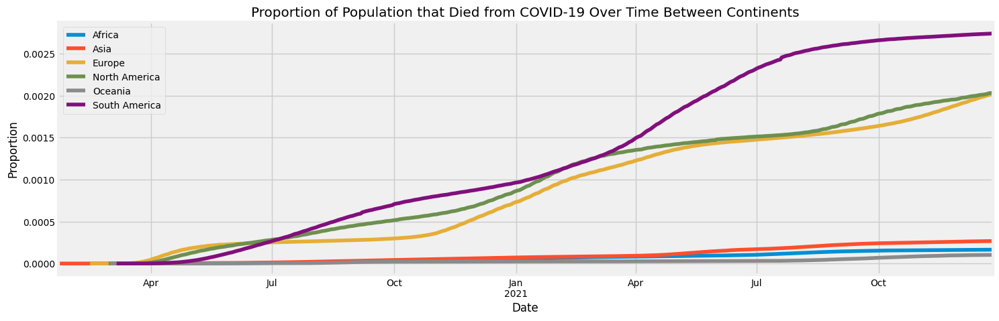

In [83]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
title = 'Proportion of Population that Died from COVID-19 Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

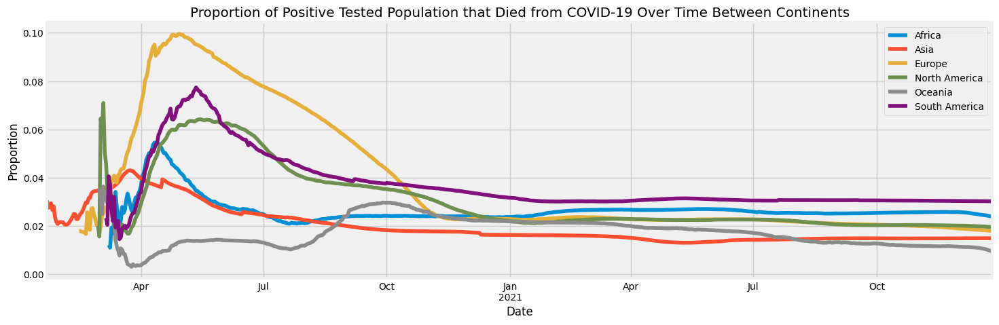

In [84]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

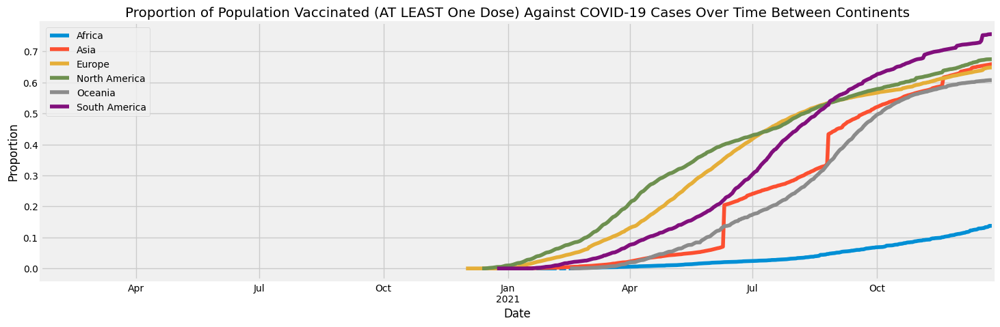

In [85]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

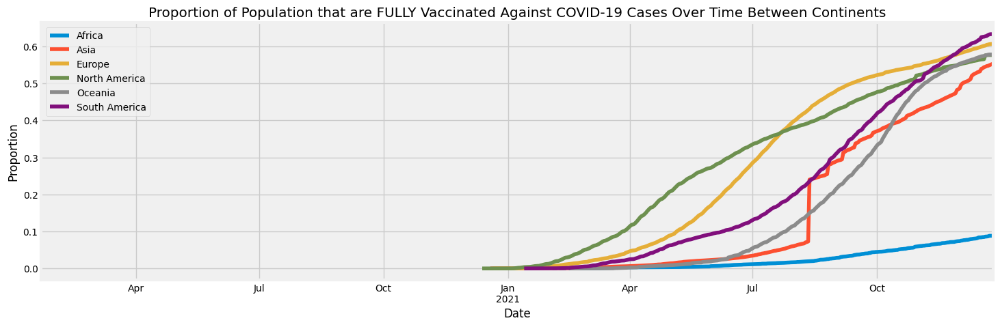

In [86]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Total Number of COVID-19 Cases Between Continents

In [87]:
group = continents_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Between Continents")
print("                   ")
group

Total Number of COVID-19 Cases Between Continents
                   


location
Africa            9456576.0
Asia             83295270.0
Europe           84679818.0
North America    62200413.0
Oceania            472881.0
South America    39305440.0
Name: new_cases, dtype: float64

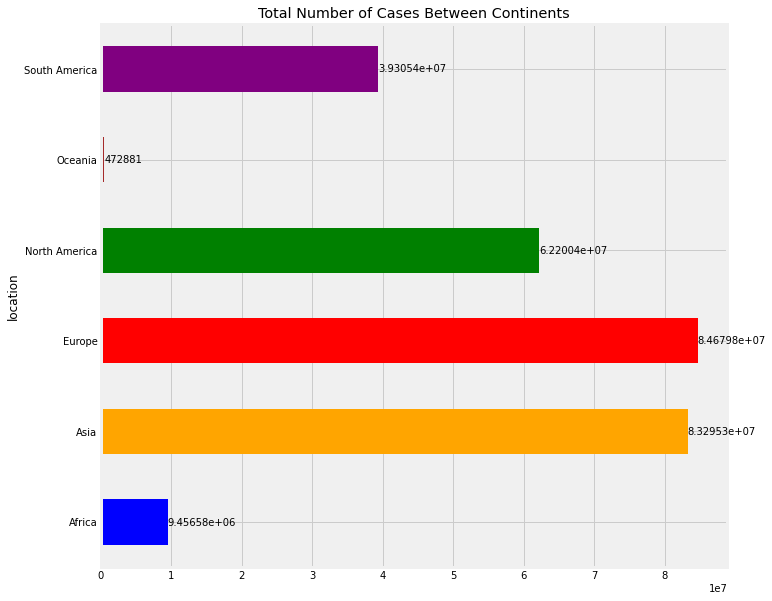

In [88]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Cases Between Continents")
plt.ylabel("Total Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Continents

In [89]:
group = continents_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Between Continents
                   


location
Africa            13845.645681
Asia             118149.319149
Europe           120283.832386
North America     88227.536170
Oceania             673.619658
South America     58316.676558
Name: new_cases, dtype: float64

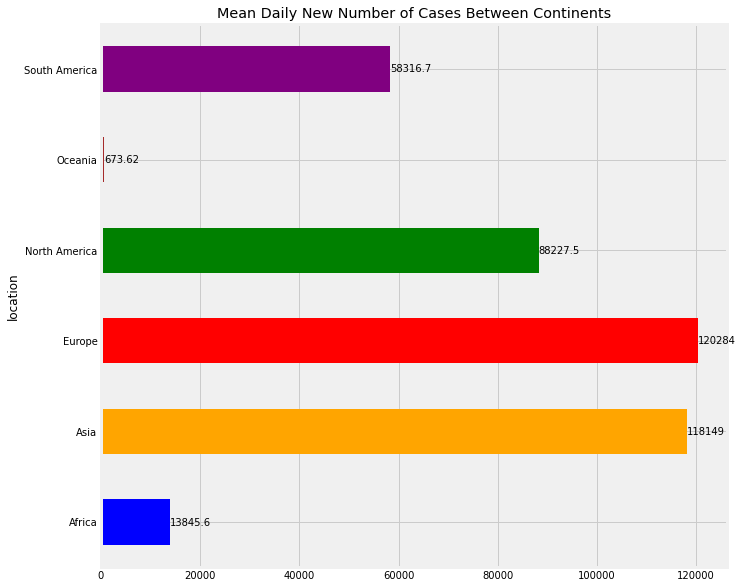

In [90]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Cases Between Continents")
plt.ylabel("Mean Daily New Number of Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Continents

In [91]:
group = continents_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Between Continents")
print("                   ")
group

Total Number of COVID-19 Deaths Between Continents
                   


location
Africa            226708.0
Asia             1246564.0
Europe           1512330.0
North America    1208084.0
Oceania             4456.0
South America    1177906.0
Name: new_deaths, dtype: float64

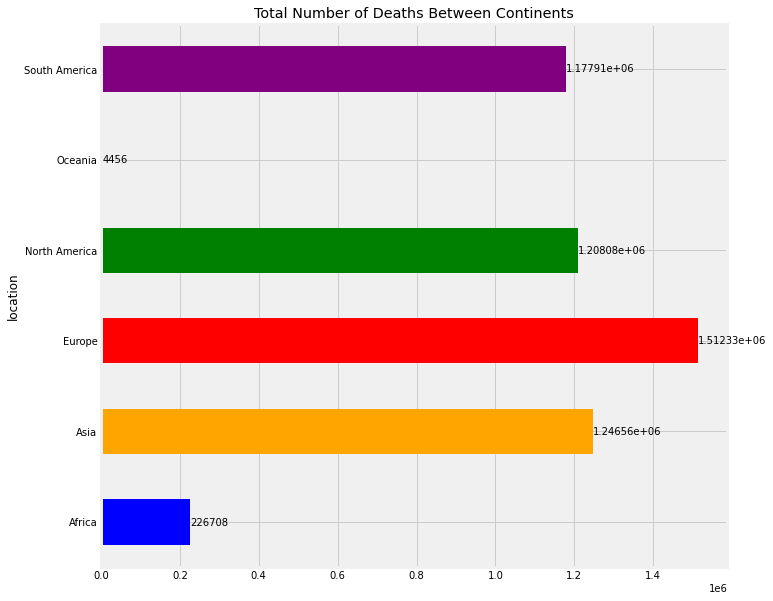

In [92]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Deaths Between Continents")
plt.ylabel("Total Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Continents

In [93]:
group = continents_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Between Continents
                   


location
Africa            331.929722
Asia             1768.175887
Europe           2148.196023
North America    1713.594326
Oceania             6.347578
South America    1747.635015
Name: new_deaths, dtype: float64

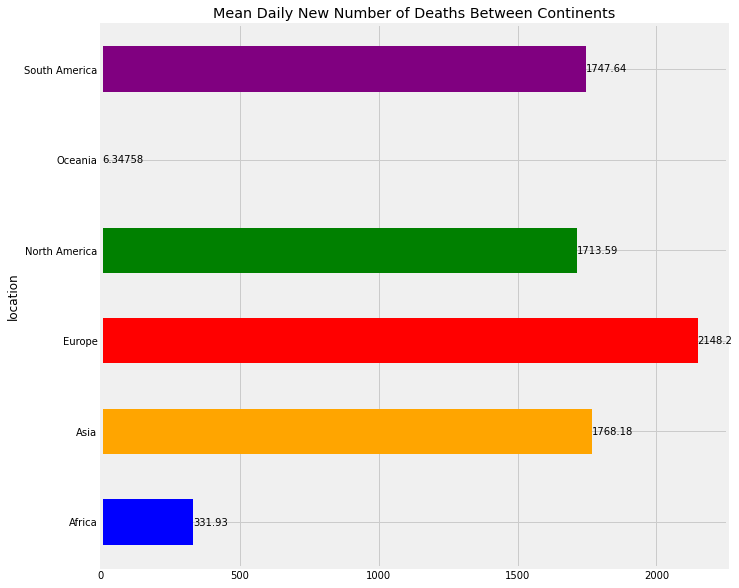

In [94]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Deaths Between Continents")
plt.ylabel("Mean Daily New Number of Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Continents

In [95]:
group = continents_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Between Continents")
print("                   ")
group

Total Number of COVID-19 Vaccinations Between Continents
                   


location
Africa           2.960932e+08
Asia             6.102061e+09
Europe           1.081259e+09
North America    8.151822e+08
Oceania          5.369430e+07
South America    6.398010e+08
Name: new_vaccinations, dtype: float64

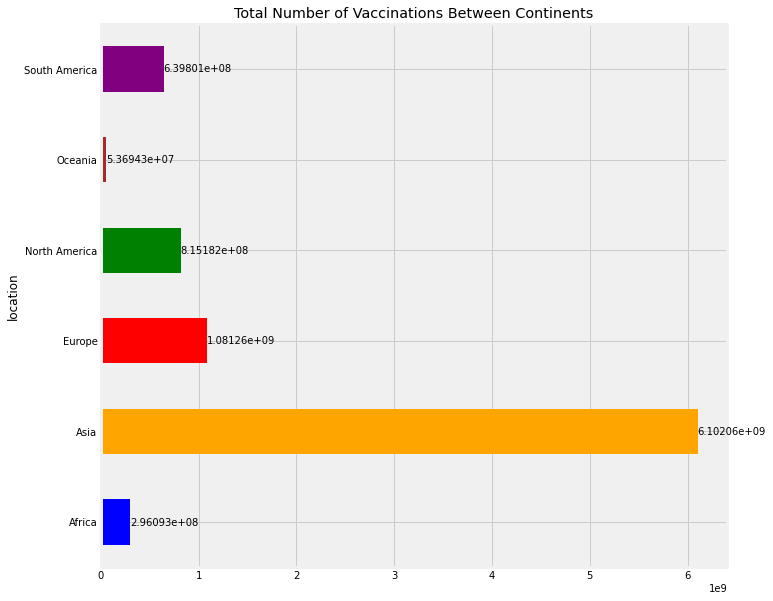

In [96]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinations Between Continents")
plt.ylabel("Total Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Continents

In [97]:
group = continents_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Between Continents
                   


location
Africa           8.812298e+05
Asia             1.640339e+07
Europe           2.772460e+06
North America    2.156567e+06
Oceania          1.715473e+05
South America    1.743327e+06
Name: new_vaccinations, dtype: float64

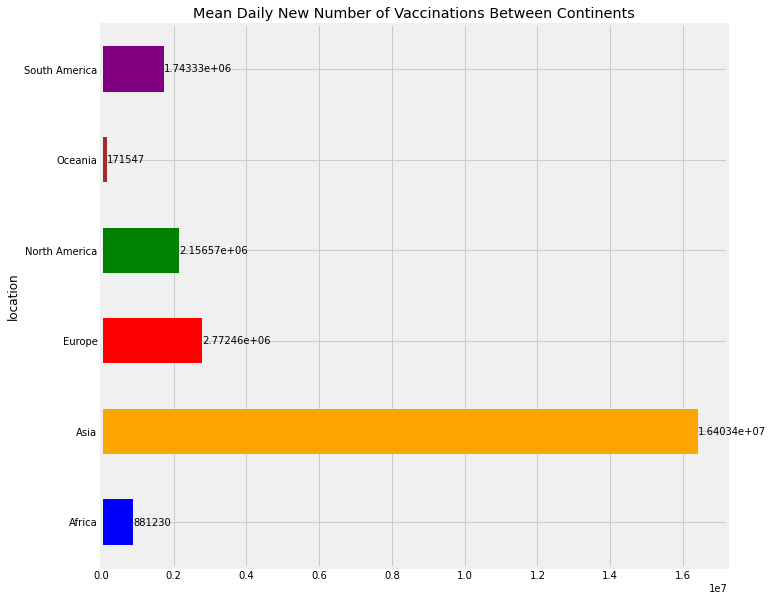

In [98]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Vaccinations Between Continents")
plt.ylabel("Mean Daily New Number of Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents

In [99]:
group = continents_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents
                   


location
Africa           1.889725e+08
Asia             3.085777e+09
Europe           4.858314e+08
North America    4.026495e+08
Oceania          2.627215e+07
South America    3.282158e+08
Name: people_vaccinated, dtype: float64

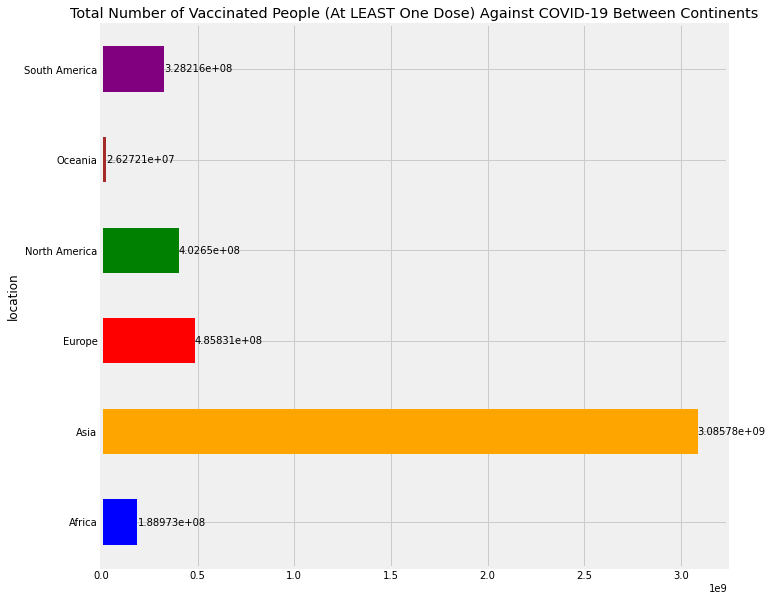

In [100]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents")
plt.ylabel("Total Number of Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Continents

In [101]:
group = continents_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Between Continents")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Between Continents
                   


location
Africa           1.213837e+08
Asia             2.588893e+09
Europe           4.546975e+08
North America    3.441966e+08
Oceania          2.503441e+07
South America    2.750110e+08
Name: people_fully_vaccinated, dtype: float64

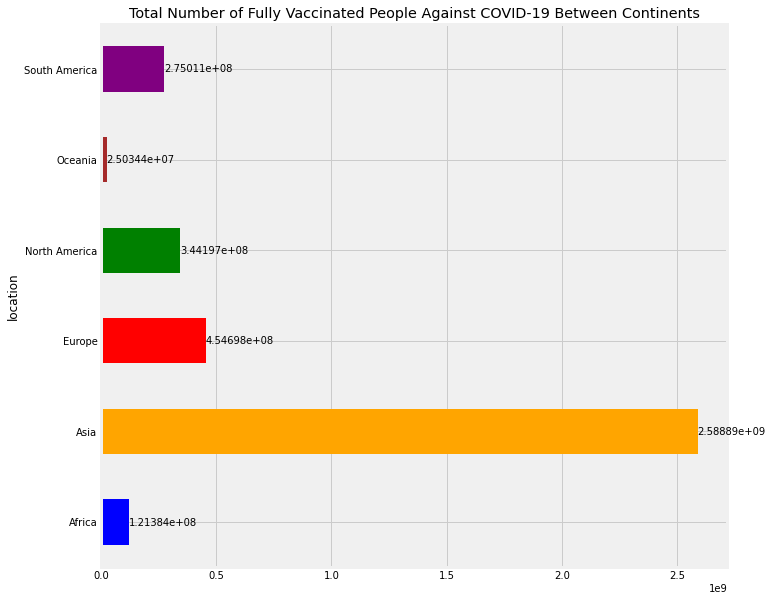

In [102]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Fully Vaccinated People Against COVID-19 Between Continents")
plt.ylabel("Total Number of Fully Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

# Countries COVID-19 Data

In [103]:
# Getting data corresponding to Countries only around the World
drop_values = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania', 'World', 'European Union',
               'High income', 'Low income', 'Lower middle income', 'Upper middle income', 'International']
countries_covid_data = owid_covid_data[~owid_covid_data['location'].isin(drop_values)]

In [104]:
# Check first 5 rows of dataframe
countries_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [105]:
# Check last 5 rows of dataframe
countries_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
150162,ZWE,Africa,Zimbabwe,2021-12-22,199404.0,1636.0,4828.0,9.0,1.1,NaN,NaN,NaN,NaN,4663.0,1662044.0,0.4163,2.4,tests performed,7167610.0,4078945.0,3088665.0,NaN,15664.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150163,ZWE,Africa,Zimbabwe,2021-12-23,201344.0,1940.0,4855.0,27.0,NaN,NaN,NaN,NaN,NaN,3919.0,1665963.0,0.4415,2.3,tests performed,7188128.0,4089315.0,3098813.0,NaN,20518.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150164,ZWE,Africa,Zimbabwe,2021-12-24,202736.0,1392.0,4871.0,16.0,NaN,NaN,NaN,NaN,NaN,4454.0,1670417.0,0.3407,2.9,tests performed,7200776.0,4095685.0,3105091.0,NaN,12648.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150165,ZWE,Africa,Zimbabwe,2021-12-25,203746.0,1010.0,4885.0,14.0,NaN,NaN,NaN,NaN,NaN,2903.0,1673320.0,0.3925,2.5,tests performed,7209049.0,4100069.0,3108980.0,NaN,8273.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
150166,ZWE,Africa,Zimbabwe,2021-12-26,204351.0,605.0,4891.0,6.0,NaN,NaN,NaN,NaN,NaN,1843.0,1675163.0,0.3654,2.7,tests performed,7214640.0,4103288.0,3111352.0,NaN,5591.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [106]:
# Shape of countries_covid_data
countries_covid_data.shape

(141108, 43)

In [107]:
# Number of Null Values in Each Column
countries_covid_data.isnull().sum()

iso_code                                        0
continent                                       0
location                                        0
date                                            0
total_cases                                  2602
new_cases                                    2704
total_deaths                                19470
new_deaths                                  19514
reproduction_rate                           29058
icu_patients                               124016
hosp_patients                              120898
weekly_icu_admissions                      136882
weekly_hosp_admissions                     132626
new_tests                                   81339
total_tests                                 81155
positive_rate                               73079
tests_per_case                              73741
tests_units                                 66770
total_vaccinations                         107610
people_vaccinated                          109095


In [108]:
# List of all Countries and How Many there are 
print("There are " + str(len(countries_covid_data['location'].unique())) + " countries")
print("                   ")
countries_covid_data['location'].unique()

There are 225 countries
                   


array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Faeroe Isl

In [109]:
# Grouping Countries by their Respective Continents they are in
countries_continent_map = countries_covid_data.groupby('continent')['location'].agg(set).to_dict()
for continent, countries in countries_continent_map.items():
  countries_continent_map[continent] = list(countries_continent_map[continent])
np.array(countries_continent_map)

array({'Africa': ['Morocco', "Cote d'Ivoire", 'Botswana', 'Burundi', 'Djibouti', 'Democratic Republic of Congo', 'Tunisia', 'Kenya', 'Mozambique', 'Guinea-Bissau', 'Sao Tome and Principe', 'Equatorial Guinea', 'Liberia', 'Niger', 'Eritrea', 'Gambia', 'Seychelles', 'Sudan', 'Mauritania', 'Zambia', 'Cape Verde', 'Madagascar', 'Namibia', 'South Sudan', 'Congo', 'Mali', 'Chad', 'Gabon', 'Nigeria', 'Somalia', 'Tanzania', 'Central African Republic', 'Algeria', 'Ethiopia', 'South Africa', 'Guinea', 'Togo', 'Mauritius', 'Saint Helena', 'Malawi', 'Cameroon', 'Angola', 'Eswatini', 'Libya', 'Sierra Leone', 'Egypt', 'Zimbabwe', 'Rwanda', 'Lesotho', 'Senegal', 'Comoros', 'Benin', 'Uganda', 'Burkina Faso', 'Ghana'], 'Asia': ['Myanmar', 'Oman', 'Laos', 'United Arab Emirates', 'Syria', 'Kuwait', 'Saudi Arabia', 'Mongolia', 'Cambodia', 'Turkey', 'Thailand', 'Singapore', 'Qatar', 'Uzbekistan', 'Japan', 'Iraq', 'India', 'Bangladesh', 'Tajikistan', 'Taiwan', 'Nepal', 'Palestine', 'South Korea', 'Maldives'

In [110]:
# Number of Countries In Each Continent
print("There are " + str(len(countries_continent_map['Africa'])) + " African countries")
print("There are " + str(len(countries_continent_map['Asia'])) + " Asian countries")
print("There are " + str(len(countries_continent_map['Europe'])) + " European countries")
print("There are " + str(len(countries_continent_map['North America'])) + " North American countries")
print("There are " + str(len(countries_continent_map['South America'])) + " South American countries")
print("There are " + str(len(countries_continent_map['Oceania'])) + " Oceanian countries")

There are 55 African countries
There are 50 Asian countries
There are 51 European countries
There are 35 North American countries
There are 13 South American countries
There are 21 Oceanian countries


In [111]:
# Function to choose countries from a given Continent (At LEAST One Country Chosen to Compare Countries from Different Continents)

def choose_countries(continent, country_options):
  adding_country = True
  countries_chosen = []
  country_options_copy = country_options.copy()

  while adding_country is True:
    country_at_index = {}
    for idx, element in enumerate(country_options_copy):
      country_at_index[idx+1] = element

    add_country = input("Want to Input Country From " + continent + "? (Y/N):    ")

    if add_country.upper() == 'Y':
      print("Please choose from Remaining Countries from " + continent)
      for idx, element in enumerate(country_options_copy):
        print("{}) {}".format(idx+1,element))
      index = int(input("Enter valid number corresponding to country from " + continent + ": "))
      try:
        if country_at_index[index] is not None:
          print('country chosen: ', country_at_index[index])
          countries_chosen.append(country_at_index[index])
          print("current countries added from " + continent + ": ", countries_chosen)
          country_options_copy.remove(country_at_index[index])
      except:
        print("Not a valid number corresponding to country! Choose a valid number!")
        print("current countries chosen from " + continent + ": ", countries_chosen)

    elif add_country.upper() == 'N':
      if len(countries_chosen) == 0:
        print("You must enter AT LEAST one country from " + continent + "!")
      else:
        adding_country = False

    else:
      print("Not a valid answer! Select Y or N")

  return countries_chosen

In [112]:
# Choose countries from Africa 
african_countries_chosen = choose_countries('Africa', countries_continent_map['Africa'])

Want to Input Country From Africa? (Y/N):    y
Please choose from Remaining Countries from Africa
1) Morocco
2) Cote d'Ivoire
3) Botswana
4) Burundi
5) Djibouti
6) Democratic Republic of Congo
7) Tunisia
8) Kenya
9) Mozambique
10) Guinea-Bissau
11) Sao Tome and Principe
12) Equatorial Guinea
13) Liberia
14) Niger
15) Eritrea
16) Gambia
17) Seychelles
18) Sudan
19) Mauritania
20) Zambia
21) Cape Verde
22) Madagascar
23) Namibia
24) South Sudan
25) Congo
26) Mali
27) Chad
28) Gabon
29) Nigeria
30) Somalia
31) Tanzania
32) Central African Republic
33) Algeria
34) Ethiopia
35) South Africa
36) Guinea
37) Togo
38) Mauritius
39) Saint Helena
40) Malawi
41) Cameroon
42) Angola
43) Eswatini
44) Libya
45) Sierra Leone
46) Egypt
47) Zimbabwe
48) Rwanda
49) Lesotho
50) Senegal
51) Comoros
52) Benin
53) Uganda
54) Burkina Faso
55) Ghana
Enter valid number corresponding to country from Africa: 35
country chosen:  South Africa
current countries added from Africa:  ['South Africa']
Want to Input Coun

In [113]:
# Choose countries from Asia 
asian_countries_chosen = choose_countries('Asia', countries_continent_map['Asia'])

Want to Input Country From Asia? (Y/N):    y
Please choose from Remaining Countries from Asia
1) Myanmar
2) Oman
3) Laos
4) United Arab Emirates
5) Syria
6) Kuwait
7) Saudi Arabia
8) Mongolia
9) Cambodia
10) Turkey
11) Thailand
12) Singapore
13) Qatar
14) Uzbekistan
15) Japan
16) Iraq
17) India
18) Bangladesh
19) Tajikistan
20) Taiwan
21) Nepal
22) Palestine
23) South Korea
24) Maldives
25) Azerbaijan
26) Timor
27) Georgia
28) Afghanistan
29) Lebanon
30) Indonesia
31) Northern Cyprus
32) Macao
33) Turkmenistan
34) Iran
35) Vietnam
36) Bhutan
37) Hong Kong
38) China
39) Bahrain
40) Kazakhstan
41) Malaysia
42) Yemen
43) Kyrgyzstan
44) Armenia
45) Brunei
46) Jordan
47) Sri Lanka
48) Philippines
49) Israel
50) Pakistan
Enter valid number corresponding to country from Asia: 38
country chosen:  China
current countries added from Asia:  ['China']
Want to Input Country From Asia? (Y/N):    y
Please choose from Remaining Countries from Asia
1) Myanmar
2) Oman
3) Laos
4) United Arab Emirates
5) 

In [114]:
# Choose countries from Europe 
european_countries_chosen = choose_countries('Europe', countries_continent_map['Europe'])

Want to Input Country From Europe? (Y/N):    y
Please choose from Remaining Countries from Europe
1) Vatican
2) Liechtenstein
3) Iceland
4) Netherlands
5) Faeroe Islands
6) Germany
7) North Macedonia
8) Ukraine
9) Belgium
10) Sweden
11) San Marino
12) Czechia
13) Montenegro
14) Poland
15) Jersey
16) Malta
17) Lithuania
18) Russia
19) Andorra
20) Belarus
21) Gibraltar
22) Guernsey
23) Bulgaria
24) Cyprus
25) Ireland
26) Norway
27) Hungary
28) Spain
29) Switzerland
30) Croatia
31) Finland
32) Luxembourg
33) Kosovo
34) United Kingdom
35) Estonia
36) Slovenia
37) Monaco
38) France
39) Greece
40) Slovakia
41) Albania
42) Serbia
43) Bosnia and Herzegovina
44) Isle of Man
45) Romania
46) Austria
47) Denmark
48) Moldova
49) Portugal
50) Italy
51) Latvia
Enter valid number corresponding to country from Europe: 18
country chosen:  Russia
current countries added from Europe:  ['Russia']
Want to Input Country From Europe? (Y/N):    y
Please choose from Remaining Countries from Europe
1) Vatican
2)

In [115]:
# Choose countries from North America 
north_american_countries_chosen = choose_countries('North America', countries_continent_map['North America'])

Want to Input Country From North America? (Y/N):    y
Please choose from Remaining Countries from North America
1) Saint Pierre and Miquelon
2) Trinidad and Tobago
3) Bermuda
4) Honduras
5) Dominica
6) Greenland
7) Curacao
8) Guatemala
9) Saint Kitts and Nevis
10) Mexico
11) Barbados
12) Saint Vincent and the Grenadines
13) Sint Maarten (Dutch part)
14) Anguilla
15) Antigua and Barbuda
16) Bonaire Sint Eustatius and Saba
17) El Salvador
18) Cayman Islands
19) Jamaica
20) United States
21) Grenada
22) Nicaragua
23) Aruba
24) Costa Rica
25) Turks and Caicos Islands
26) Montserrat
27) Haiti
28) Cuba
29) Belize
30) British Virgin Islands
31) Panama
32) Bahamas
33) Dominican Republic
34) Saint Lucia
35) Canada
Enter valid number corresponding to country from North America: 35
country chosen:  Canada
current countries added from North America:  ['Canada']
Want to Input Country From North America? (Y/N):    y
Please choose from Remaining Countries from North America
1) Saint Pierre and Miquel

In [116]:
# Choose countries from South America 
south_american_countries_chosen = choose_countries('South America', countries_continent_map['South America'])

Want to Input Country From South America? (Y/N):    y
Please choose from Remaining Countries from South America
1) Paraguay
2) Suriname
3) Colombia
4) Guyana
5) Ecuador
6) Falkland Islands
7) Venezuela
8) Uruguay
9) Peru
10) Brazil
11) Bolivia
12) Argentina
13) Chile
Enter valid number corresponding to country from South America: 10
country chosen:  Brazil
current countries added from South America:  ['Brazil']
Want to Input Country From South America? (Y/N):    y
Please choose from Remaining Countries from South America
1) Paraguay
2) Suriname
3) Colombia
4) Guyana
5) Ecuador
6) Falkland Islands
7) Venezuela
8) Uruguay
9) Peru
10) Bolivia
11) Argentina
12) Chile
Enter valid number corresponding to country from South America: 3
country chosen:  Colombia
current countries added from South America:  ['Brazil', 'Colombia']
Want to Input Country From South America? (Y/N):    n


In [117]:
# Choose countries from Oceania 
oceanian_countries_chosen = choose_countries('Oceania', countries_continent_map['Oceania'])

Want to Input Country From Oceania? (Y/N):    y
Please choose from Remaining Countries from Oceania
1) Cook Islands
2) Kiribati
3) Tonga
4) Solomon Islands
5) New Caledonia
6) French Polynesia
7) Samoa
8) Papua New Guinea
9) Tokelau
10) New Zealand
11) Australia
12) Vanuatu
13) Micronesia (country)
14) Wallis and Futuna
15) Pitcairn
16) Fiji
17) Tuvalu
18) Nauru
19) Niue
20) Marshall Islands
21) Palau
Enter valid number corresponding to country from Oceania: 11
country chosen:  Australia
current countries added from Oceania:  ['Australia']
Want to Input Country From Oceania? (Y/N):    y
Please choose from Remaining Countries from Oceania
1) Cook Islands
2) Kiribati
3) Tonga
4) Solomon Islands
5) New Caledonia
6) French Polynesia
7) Samoa
8) Papua New Guinea
9) Tokelau
10) New Zealand
11) Vanuatu
12) Micronesia (country)
13) Wallis and Futuna
14) Pitcairn
15) Fiji
16) Tuvalu
17) Nauru
18) Niue
19) Marshall Islands
20) Palau
Enter valid number corresponding to country from Oceania: 10
co

In [118]:
# Countries dataframes for Each Continent
african_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Africa'])]
asian_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Asia'])]
european_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Europe'])]
north_american_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['North America'])]
south_american_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['South America'])]
oceanian_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Oceania'])]

In [119]:
# Countries chosen by Continent
african_countries = african_countries[african_countries['location'].isin(african_countries_chosen)]
asian_countries = asian_countries[asian_countries['location'].isin(asian_countries_chosen)]
european_countries = european_countries[european_countries['location'].isin(european_countries_chosen)]
north_american_countries = north_american_countries[north_american_countries['location'].isin(north_american_countries_chosen)]
south_american_countries = south_american_countries[south_american_countries['location'].isin(south_american_countries_chosen)]
oceanian_countries = oceanian_countries[oceanian_countries['location'].isin(oceanian_countries_chosen)]

In [120]:
# Set Date to Index for Dataframes
countries_covid_data.set_index('date', inplace=True)
african_countries.set_index('date', inplace=True)
asian_countries.set_index('date', inplace=True)
european_countries.set_index('date', inplace=True)
north_american_countries.set_index('date', inplace=True)
south_american_countries.set_index('date', inplace=True)
oceanian_countries.set_index('date', inplace=True)

In [121]:
# List of Dataframes by Continents
countries_continents_lst = [african_countries, asian_countries, european_countries, north_american_countries, south_american_countries, oceanian_countries]

## Population Between Countries

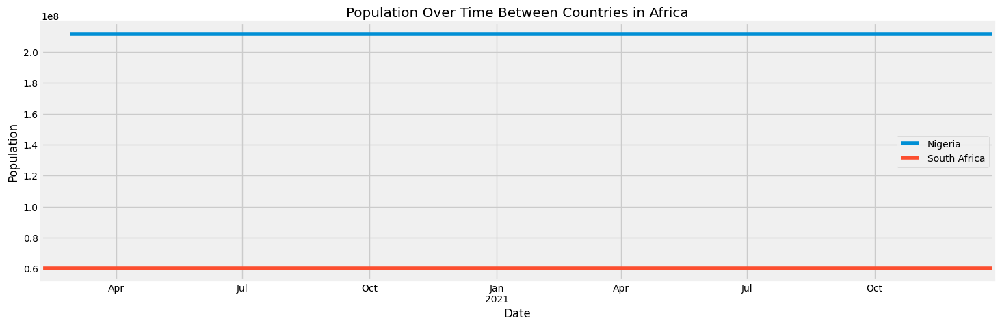

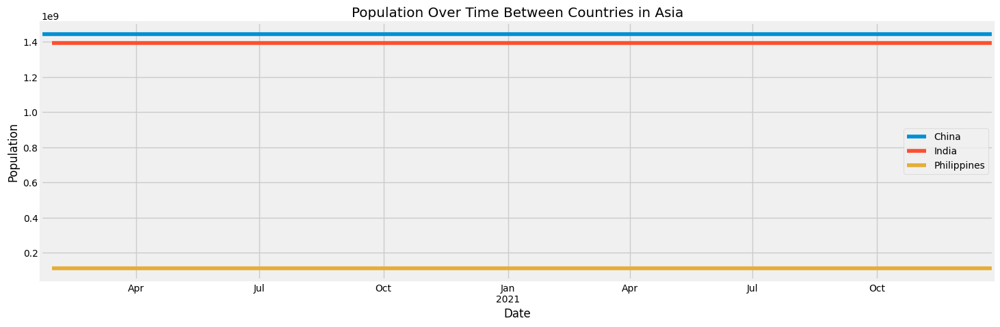

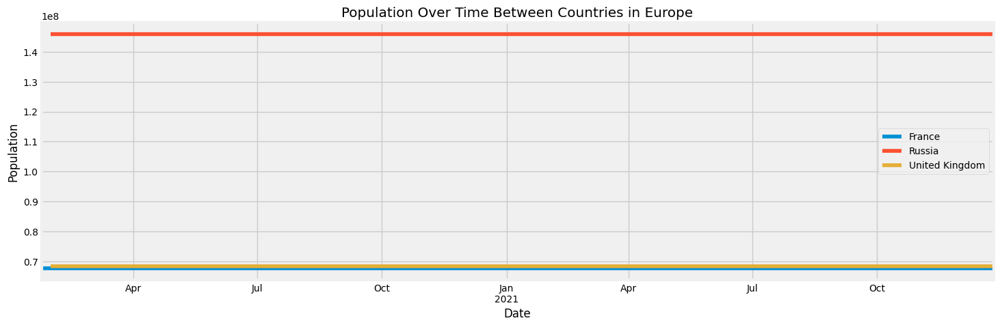

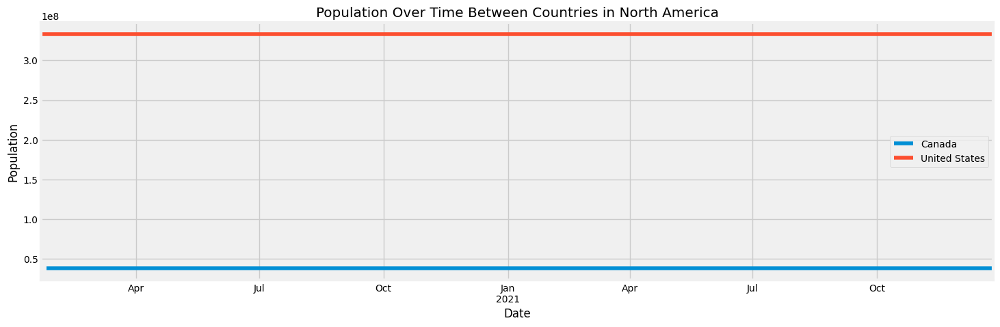

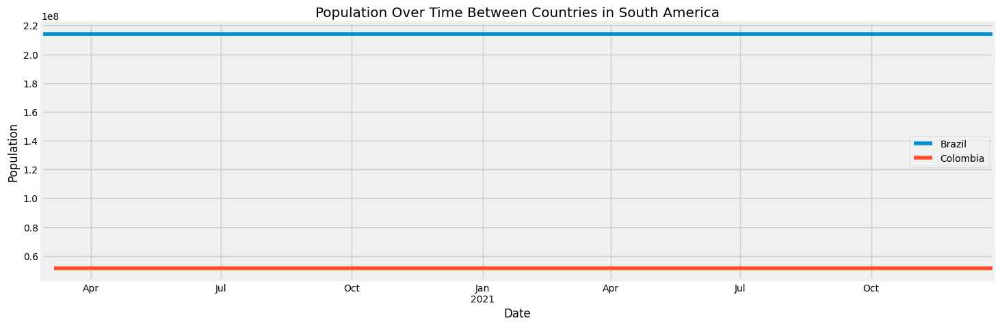

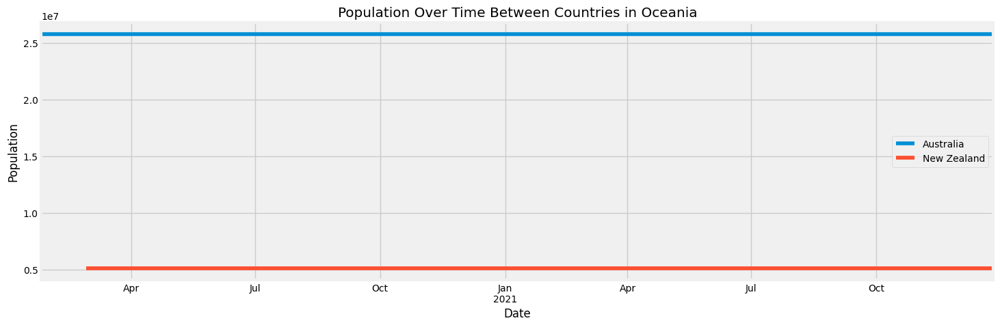

In [122]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['population'].plot(legend='True')
  title = 'Population Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Population')
  plt.show()

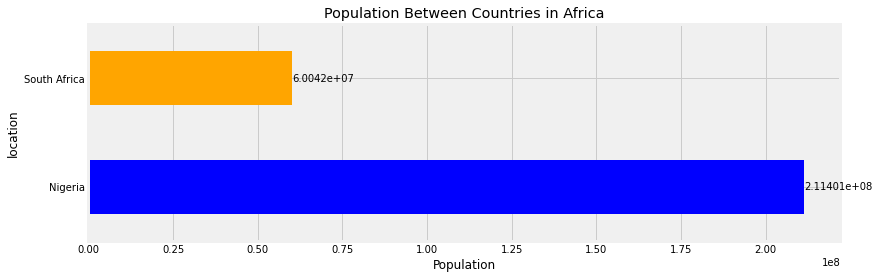

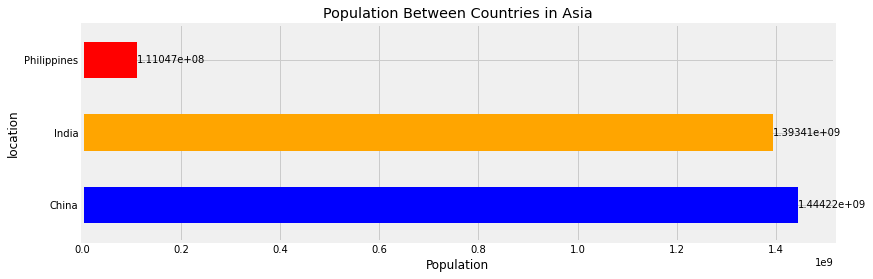

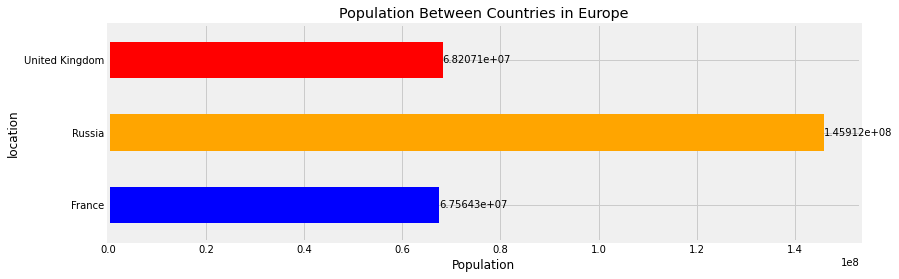

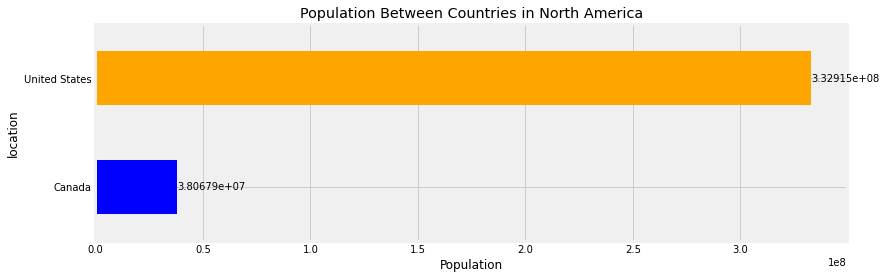

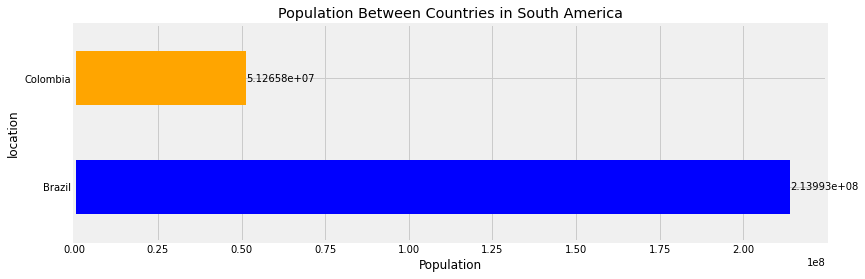

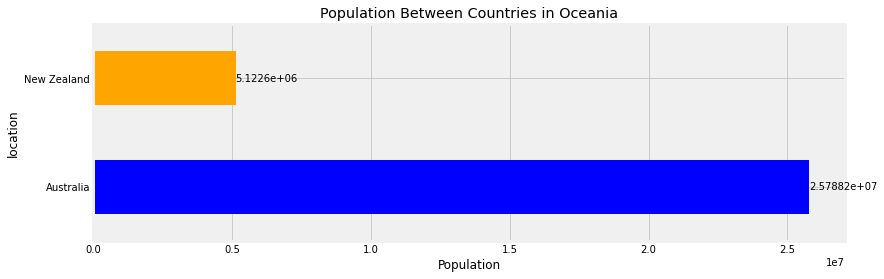

In [123]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Population Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Population")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Population Density Between Countries

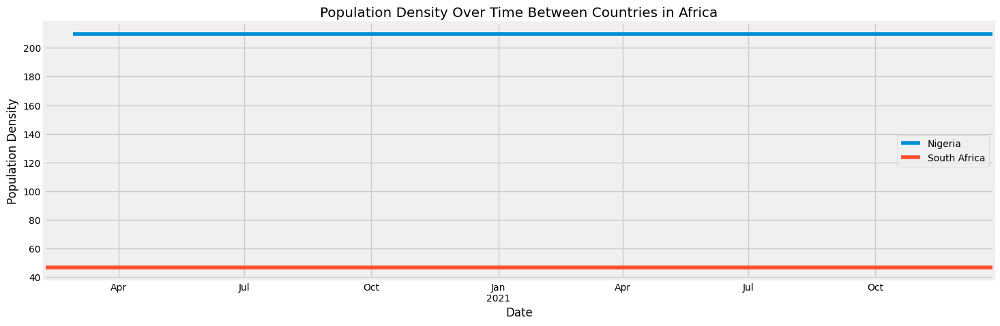

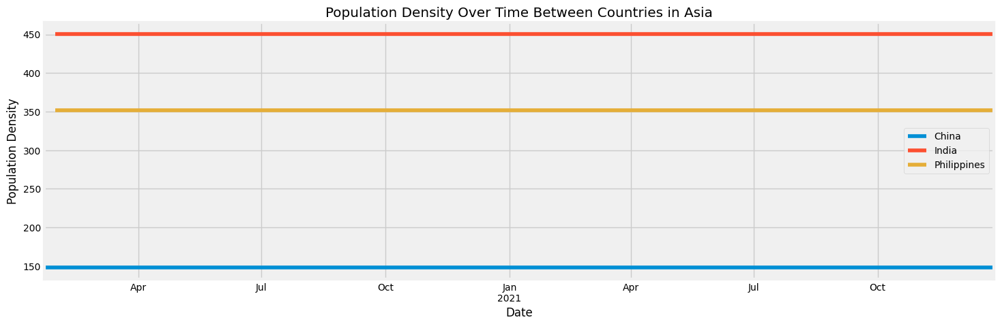

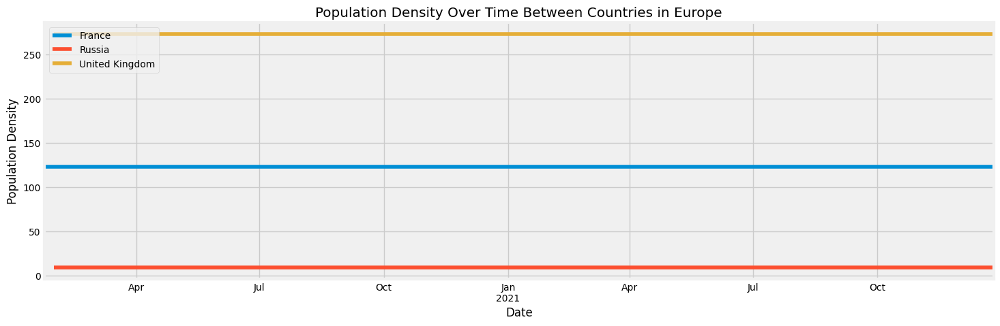

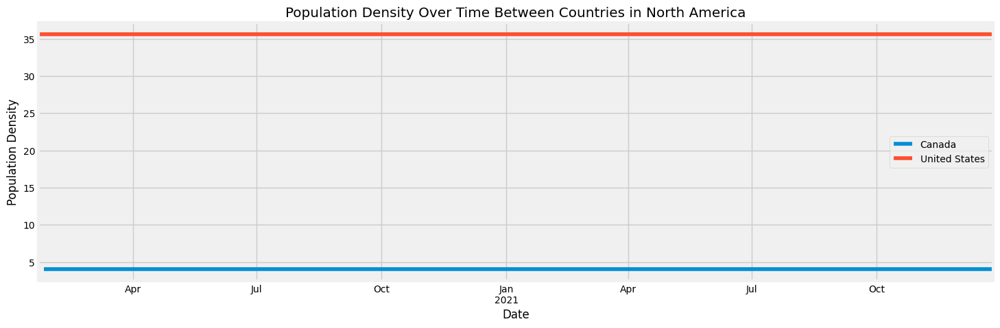

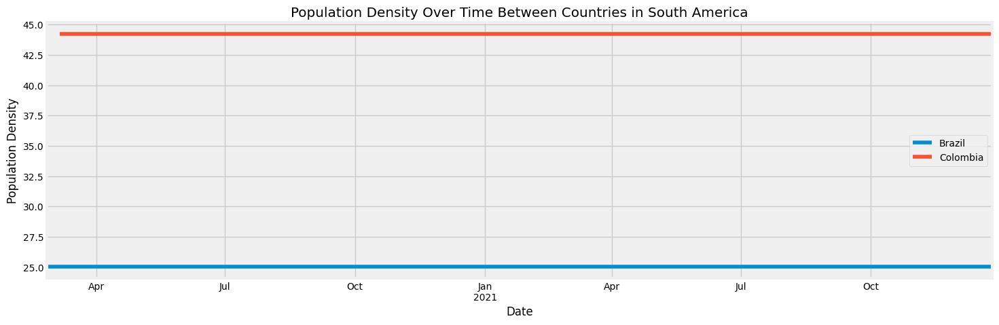

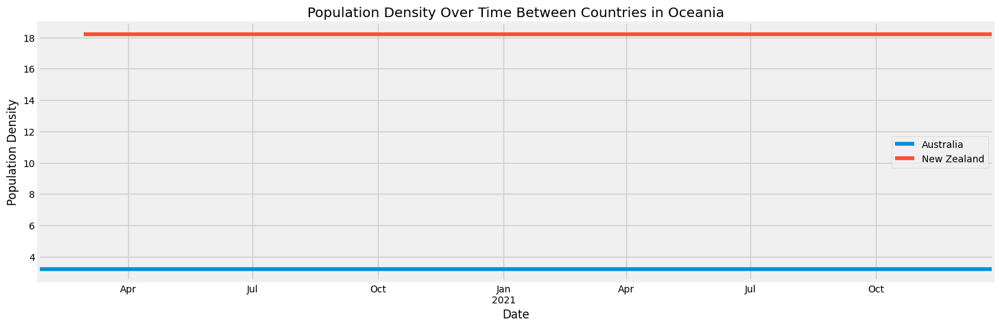

In [124]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['population_density'].plot(legend='True')
  title = 'Population Density Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Population Density')
  plt.show()

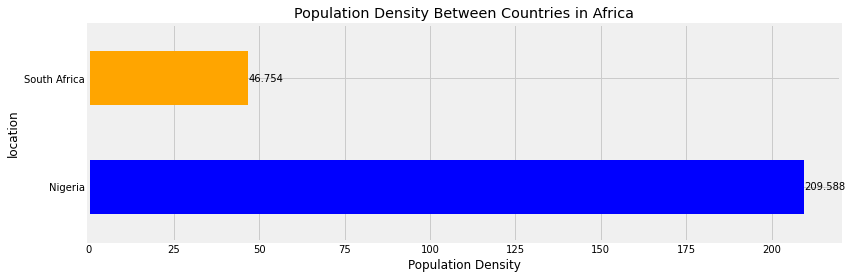

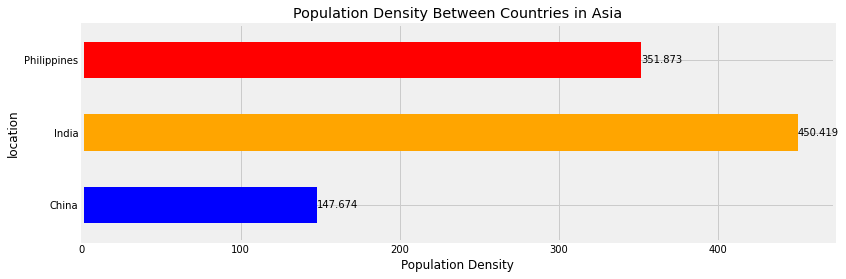

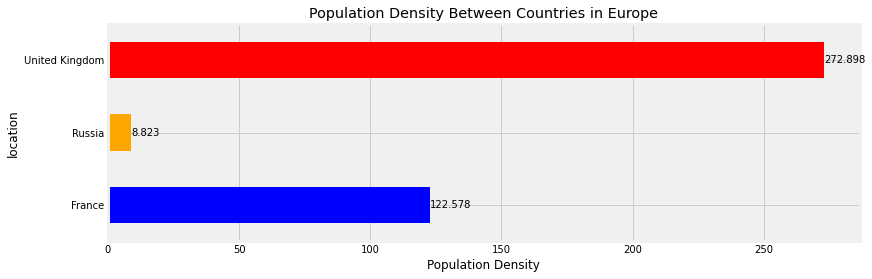

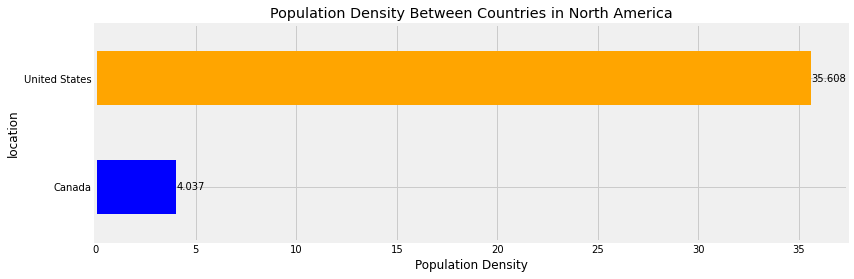

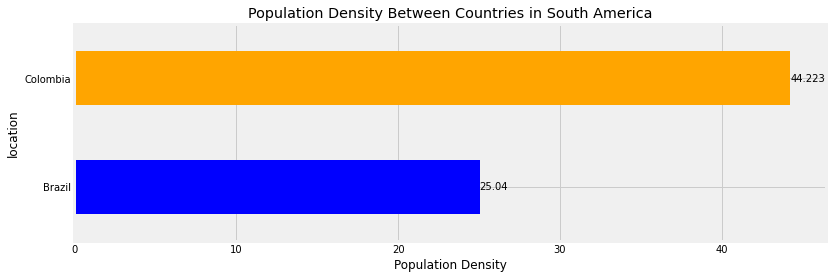

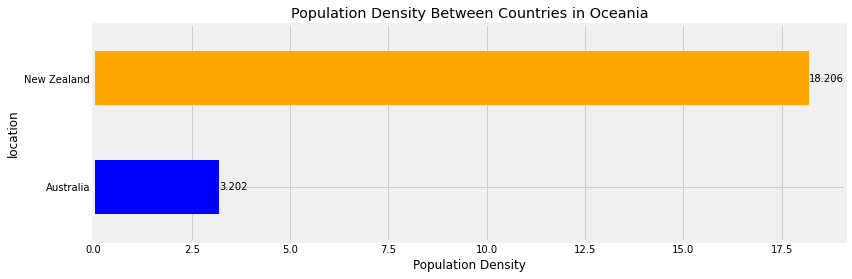

In [125]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["population_density"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Population Density Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Population Density")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Countries



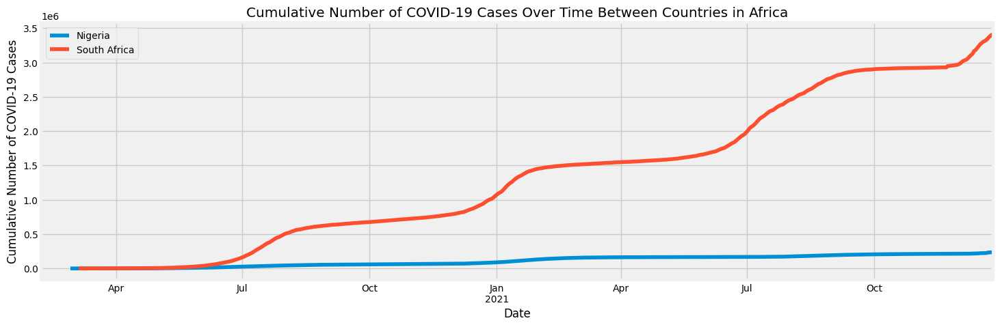

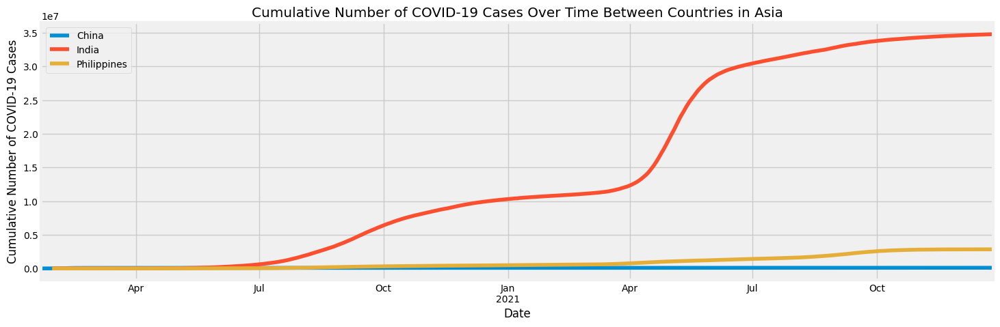

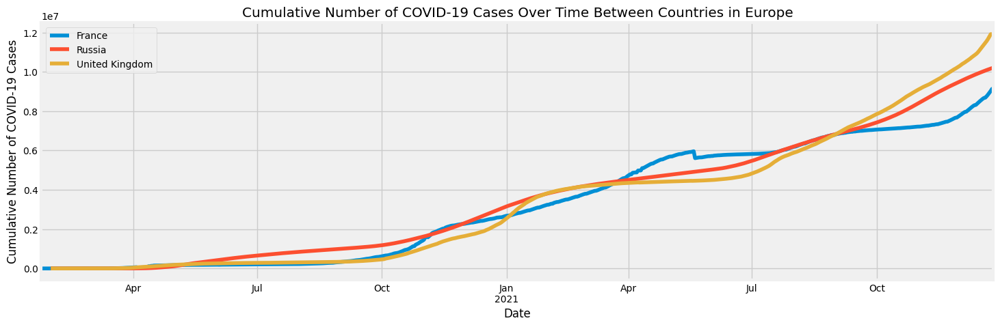

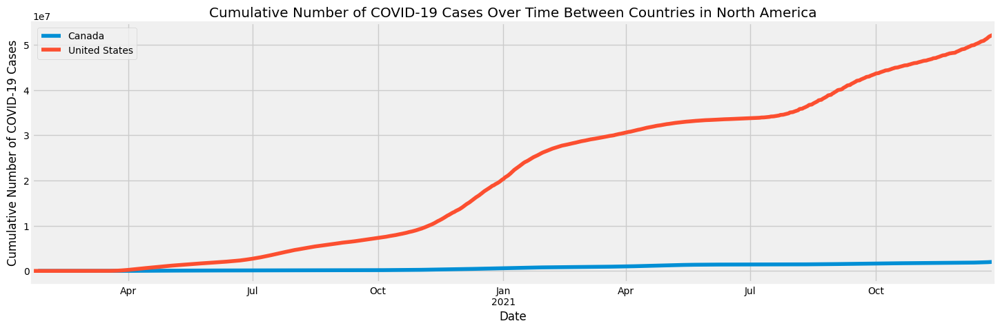

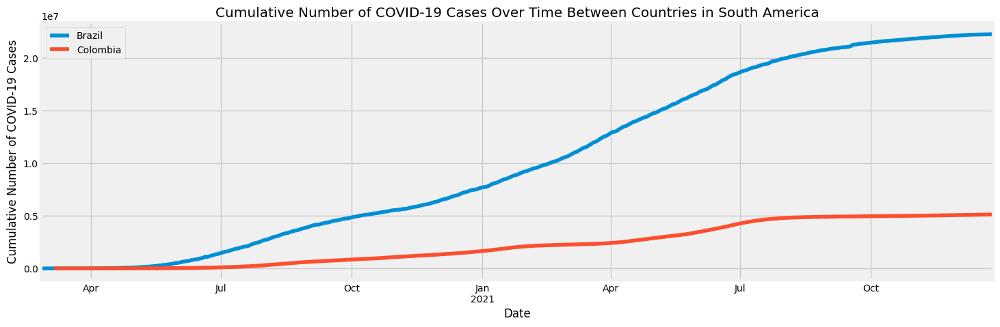

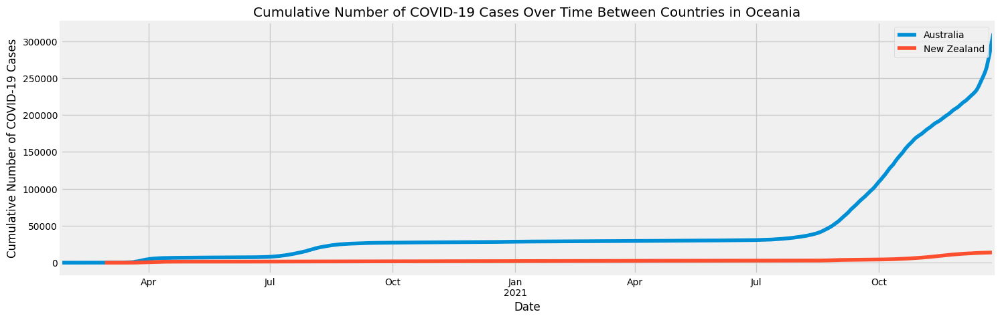

In [126]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_cases'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
  plt.show()

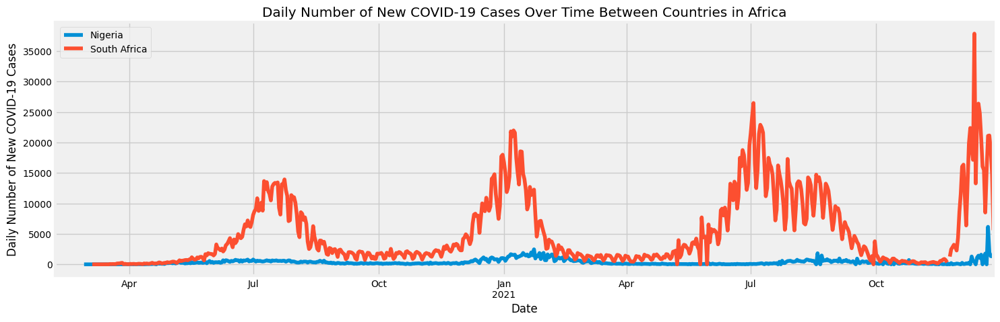

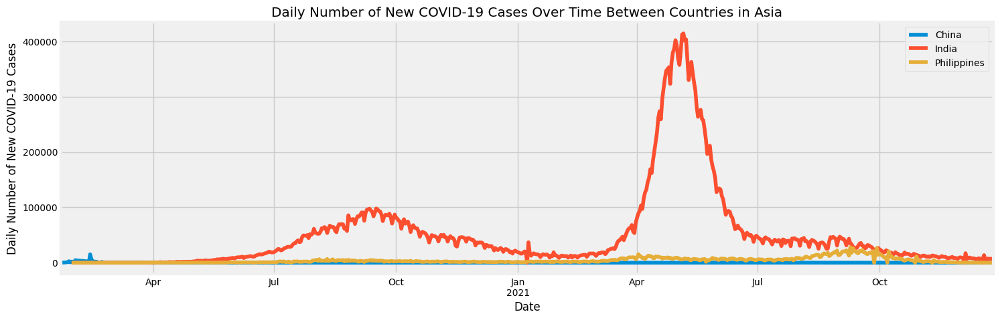

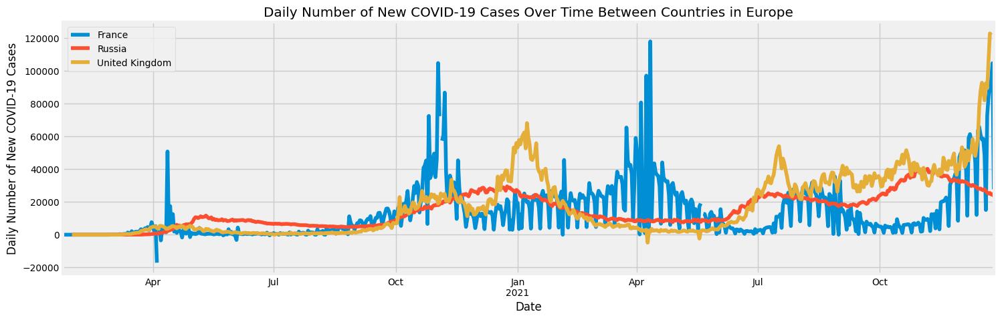

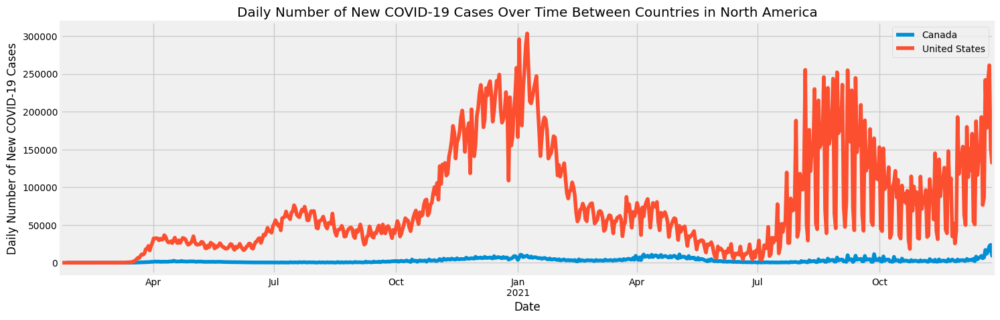

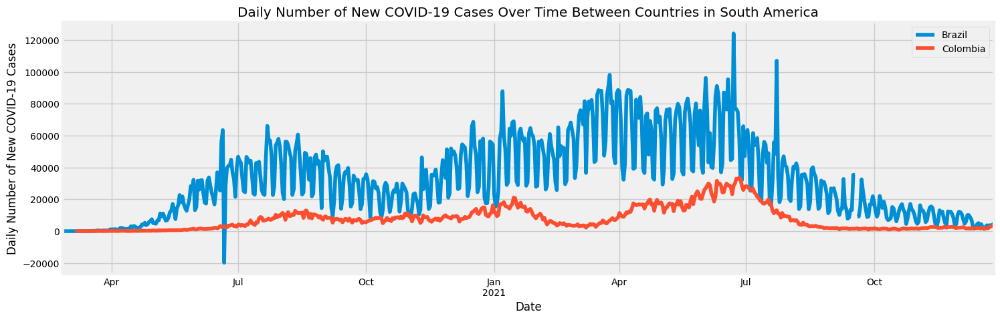

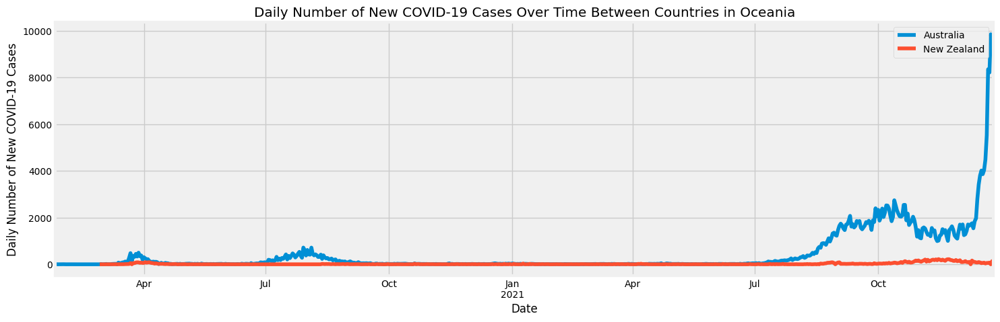

In [127]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_cases'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
  plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Countries

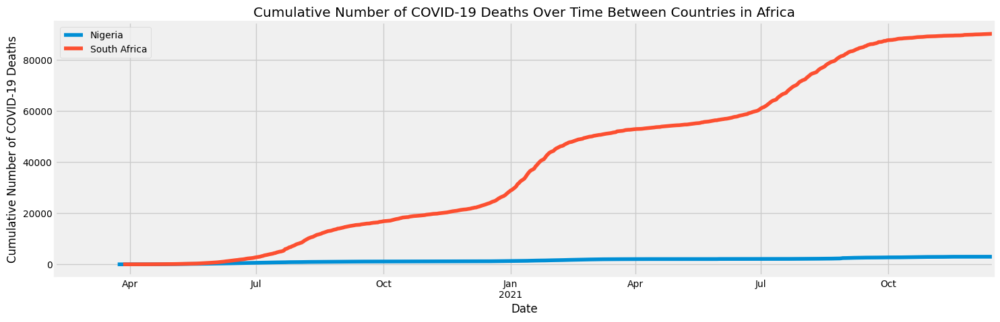

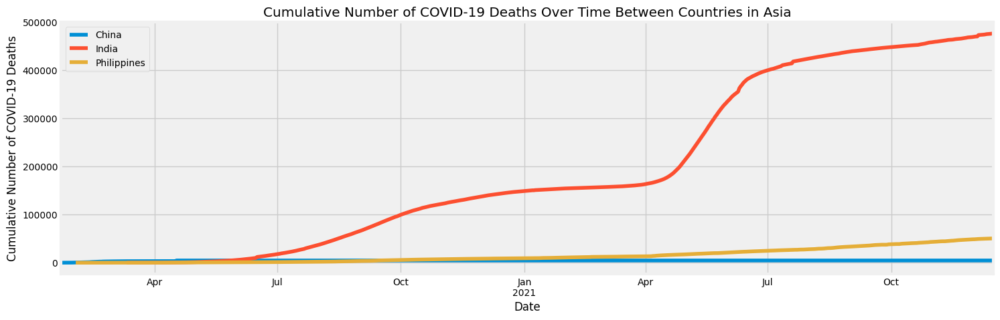

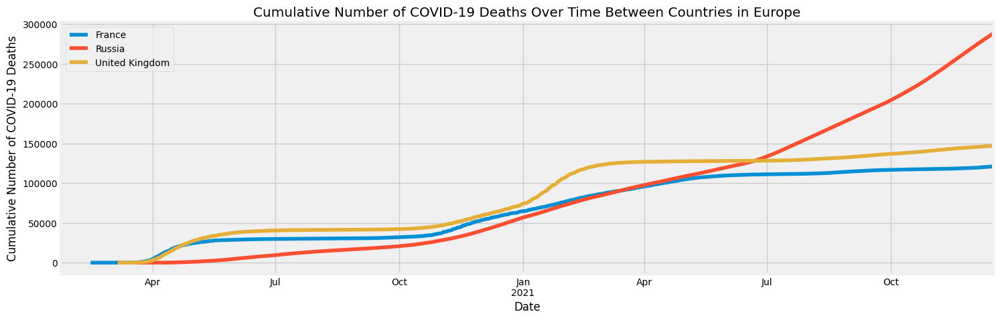

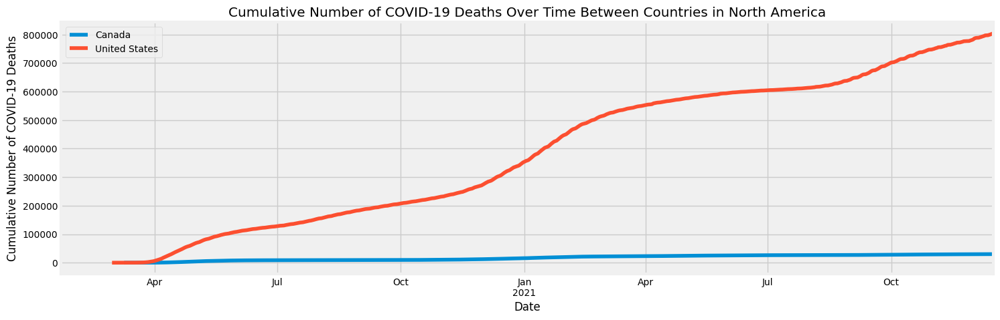

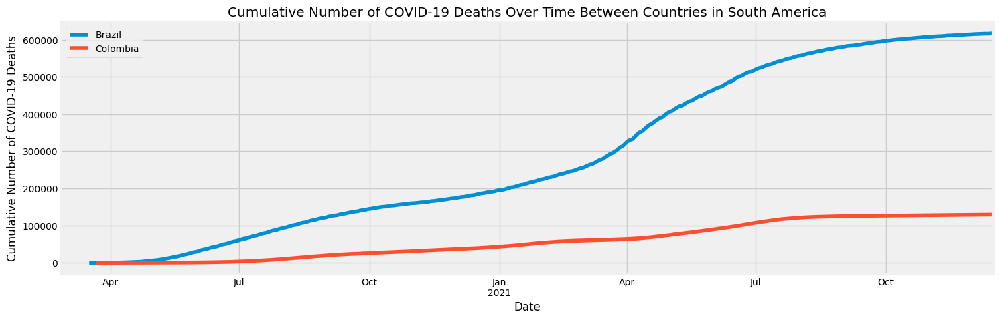

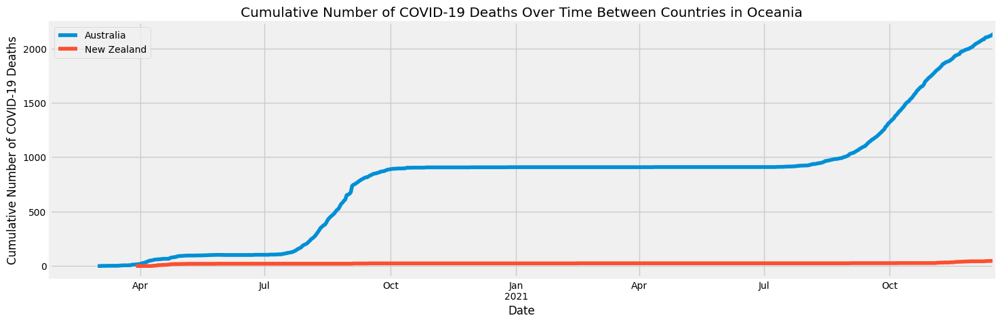

In [ ]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_deaths'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Deaths Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
  plt.show()

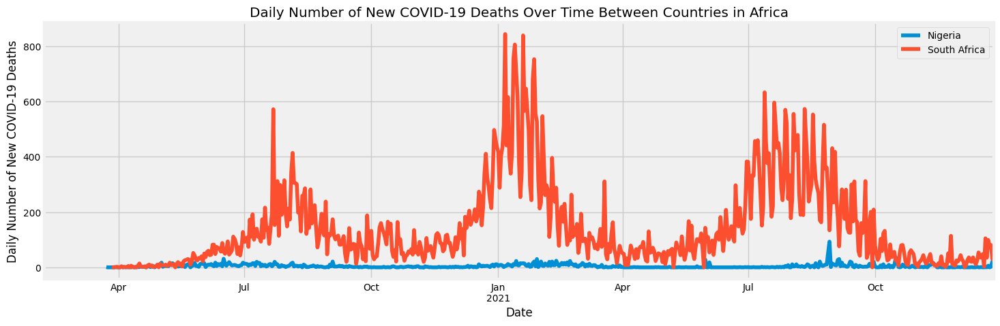

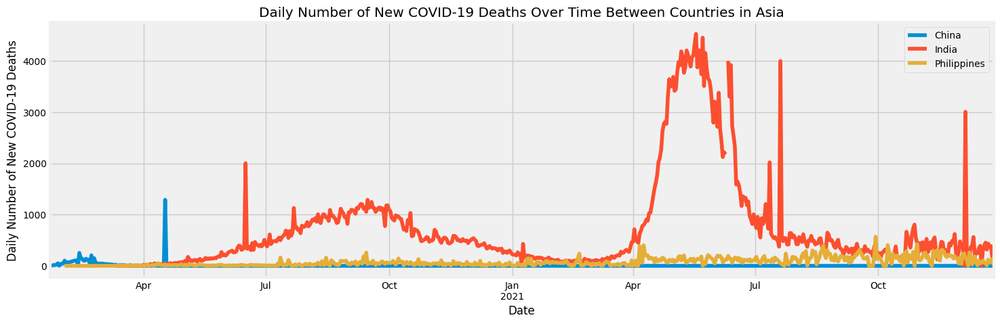

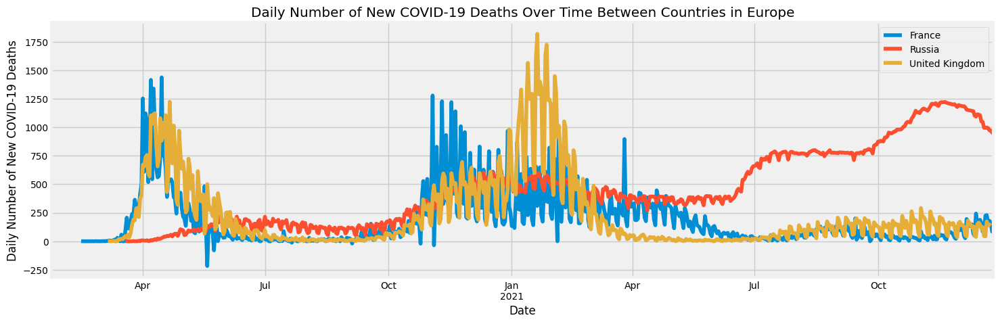

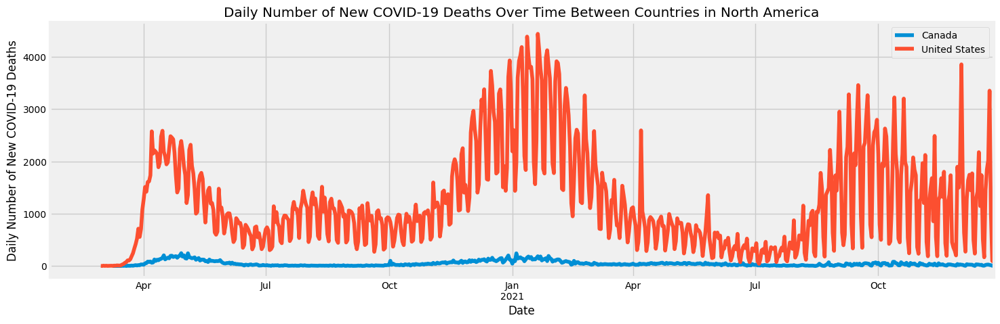

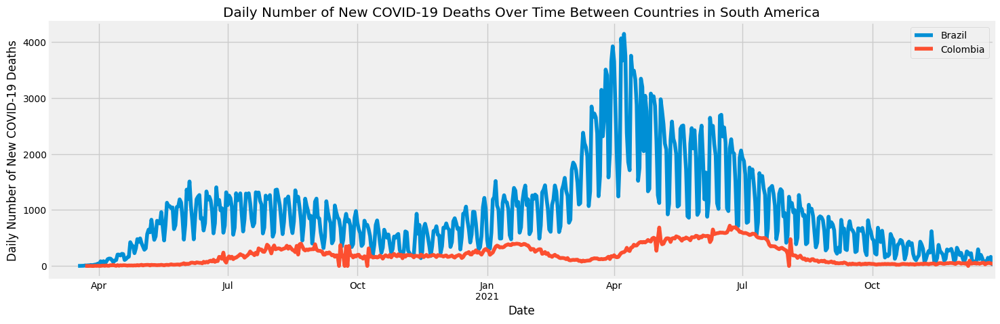

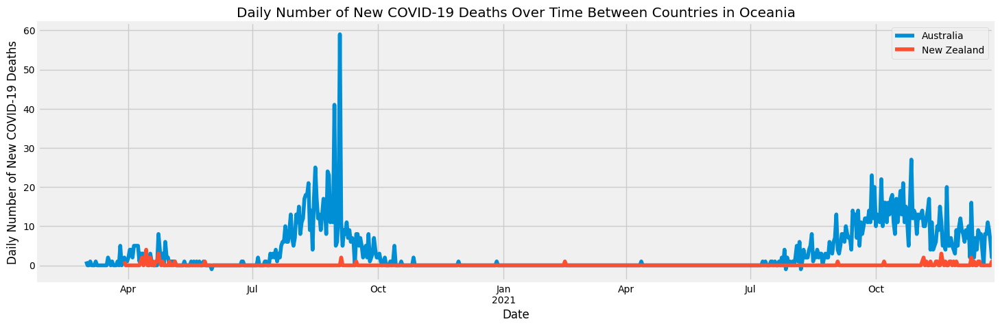

In [128]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_deaths'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Deaths Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
  plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Over Time Between Countries

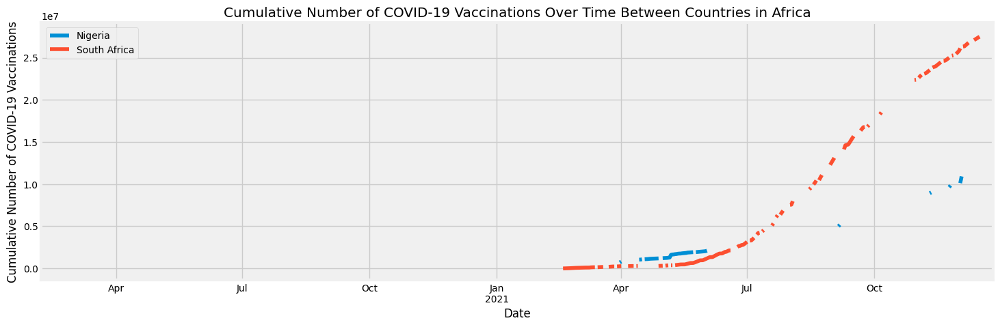

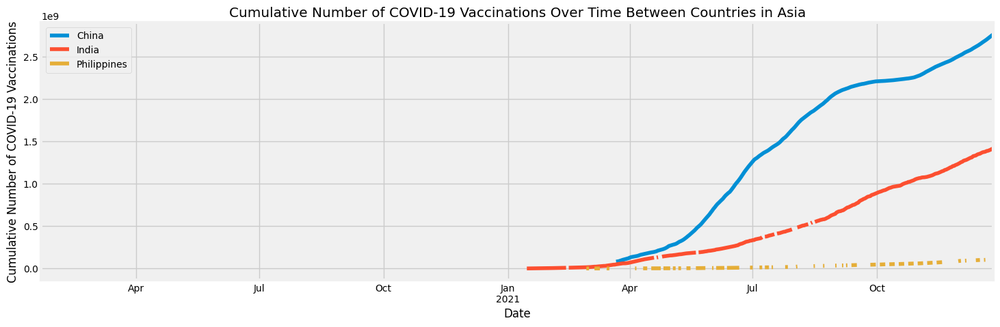

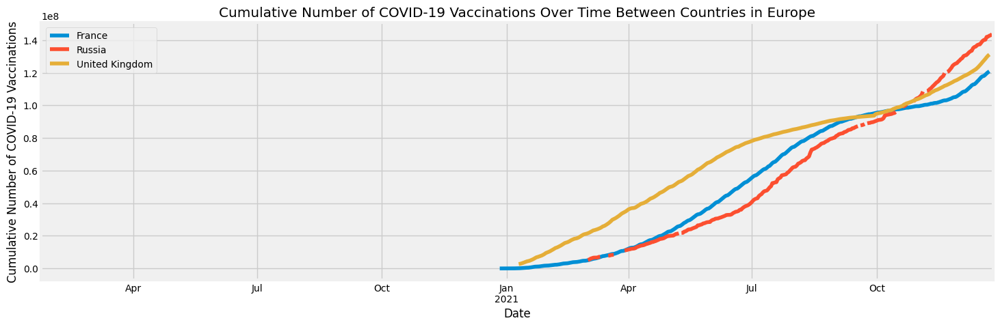

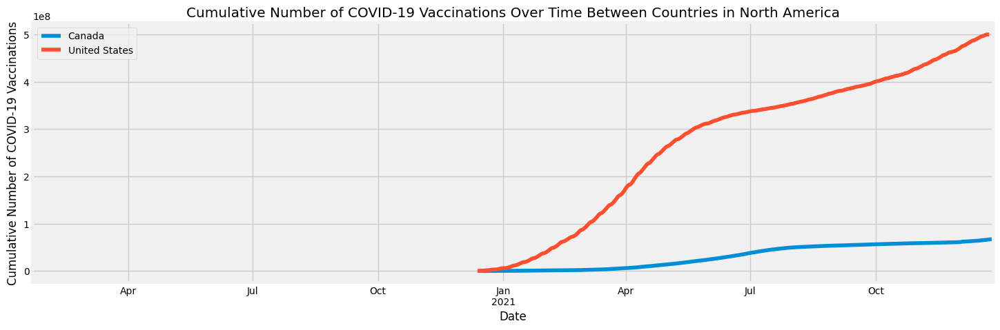

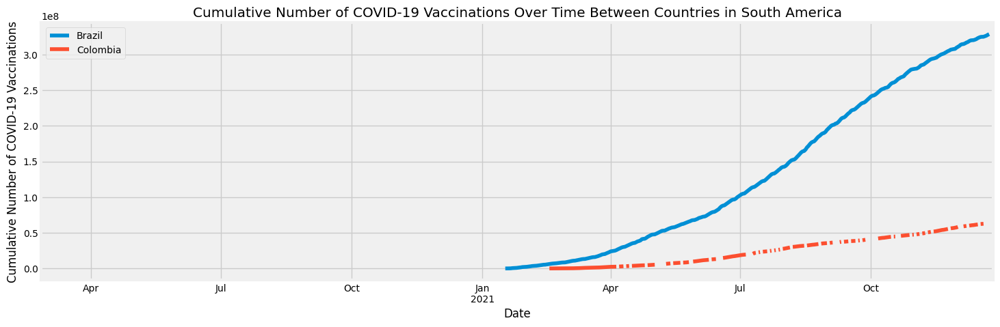

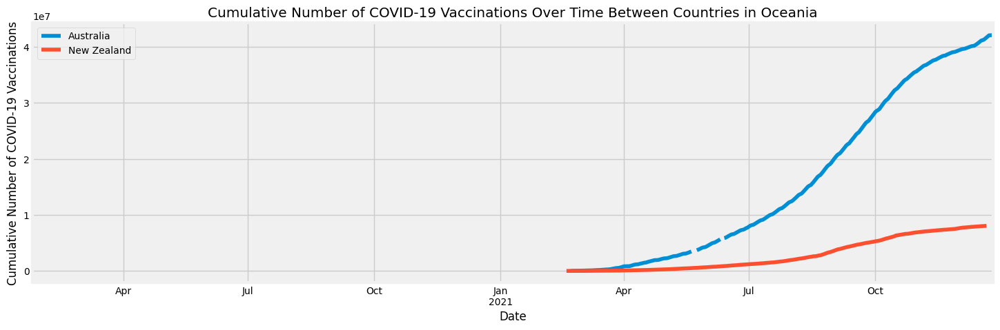

In [145]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_vaccinations'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
  plt.show()

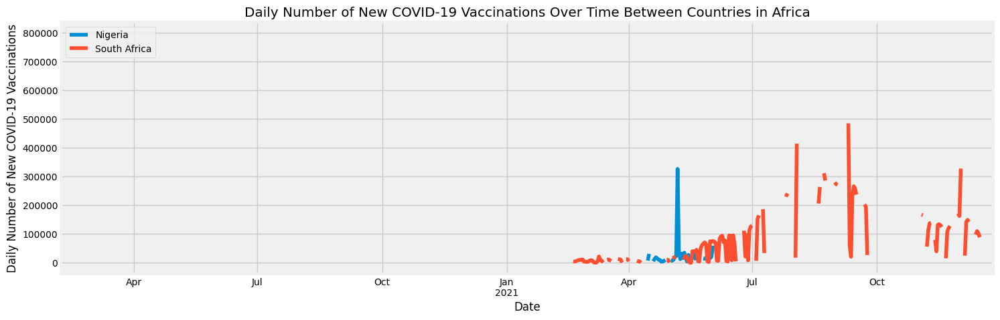

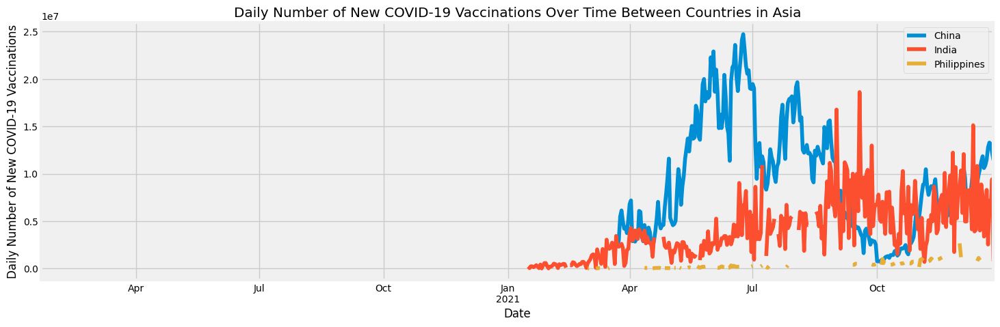

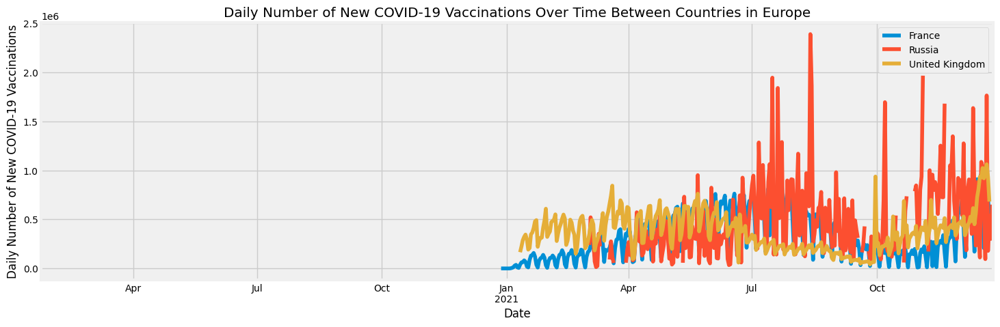

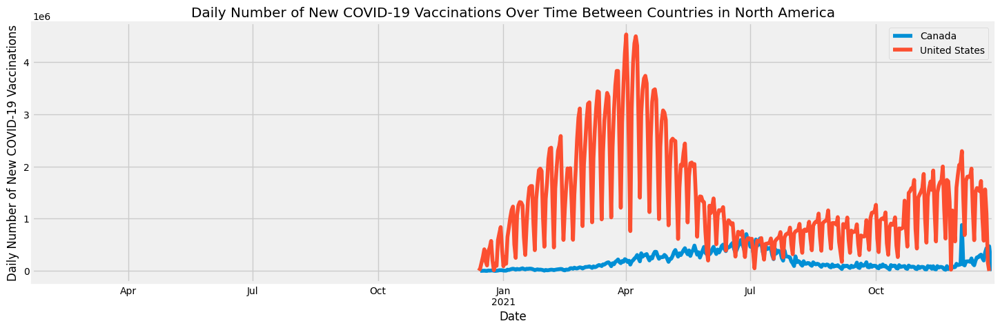

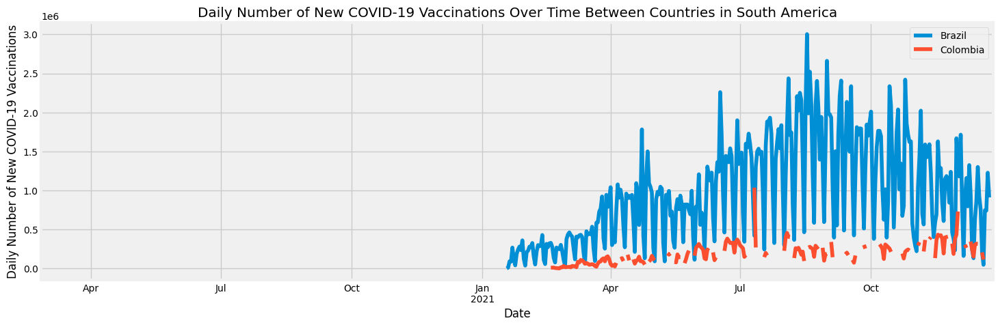

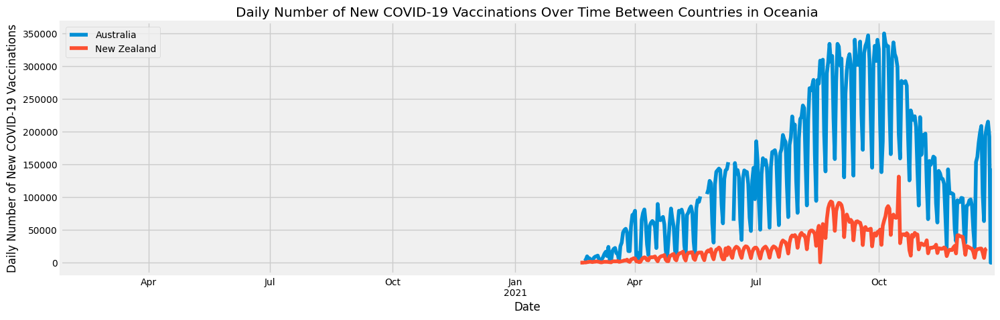

In [146]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_vaccinations'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
  plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Between Countries

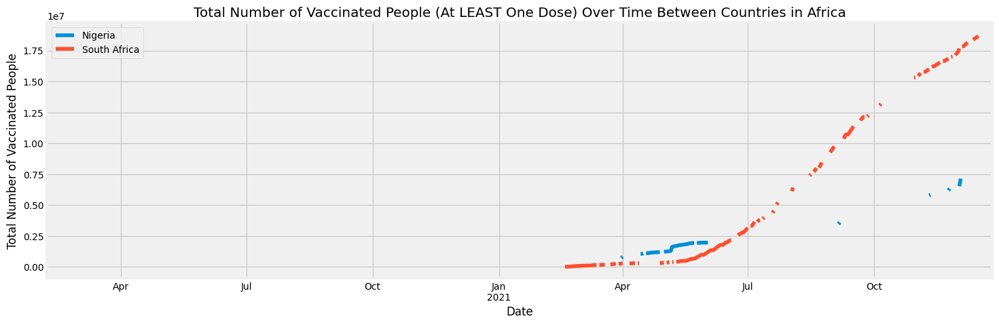

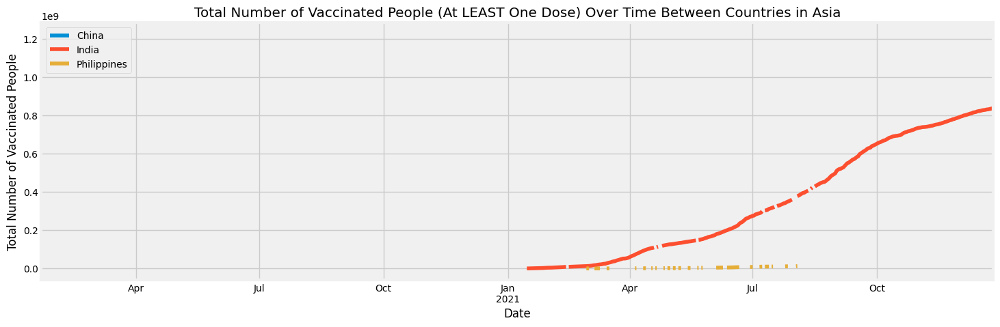

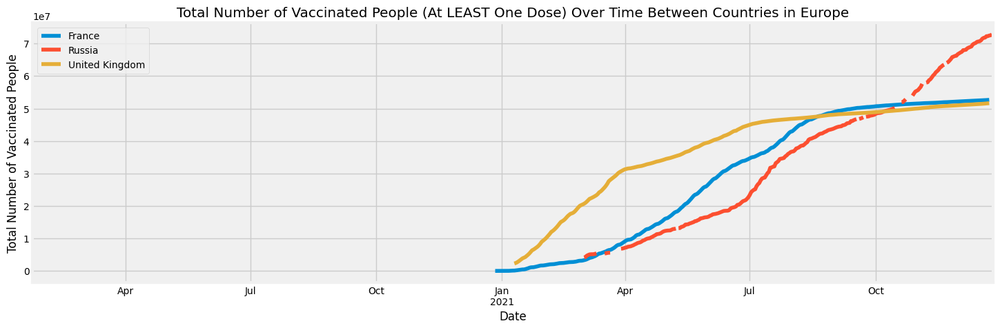

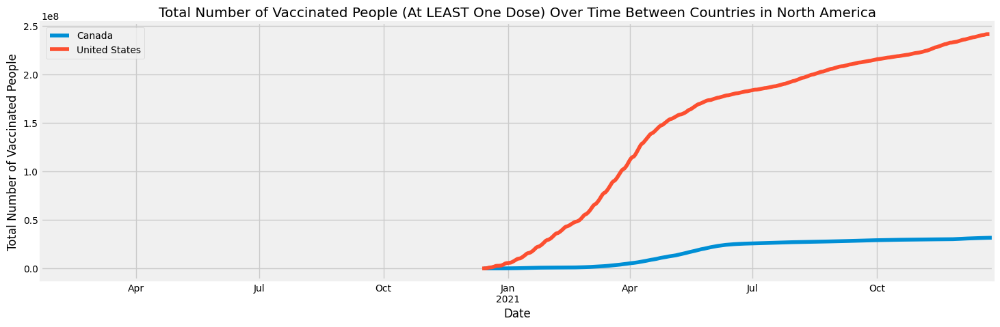

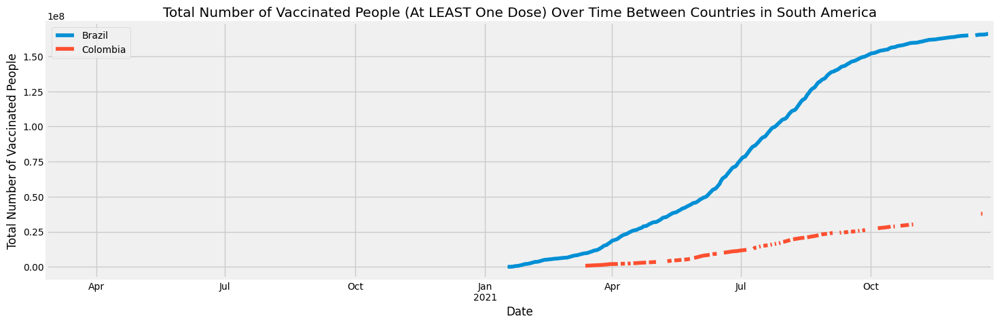

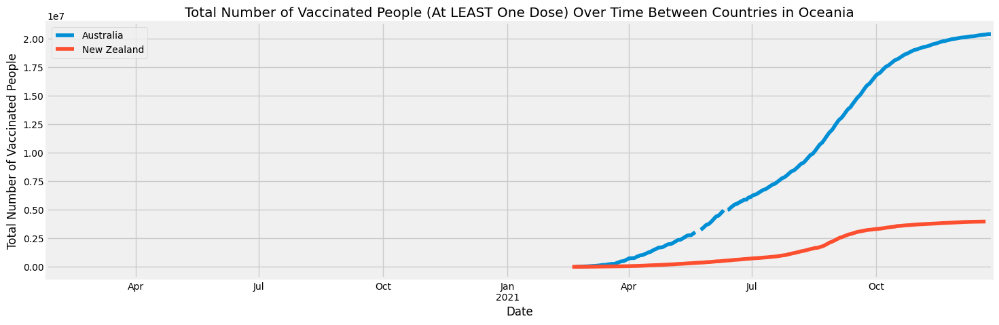

In [147]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['people_vaccinated'].plot(legend='True')
  title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Total Number of Vaccinated People')
  plt.show()

## Total Number of FULLY Vaccinated People Between Countries

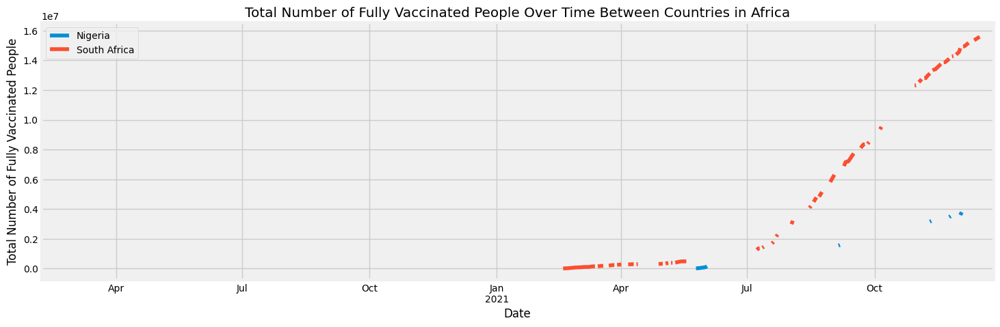

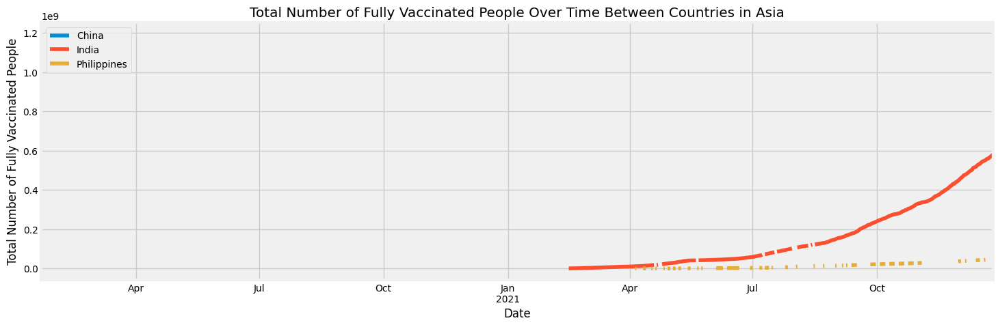

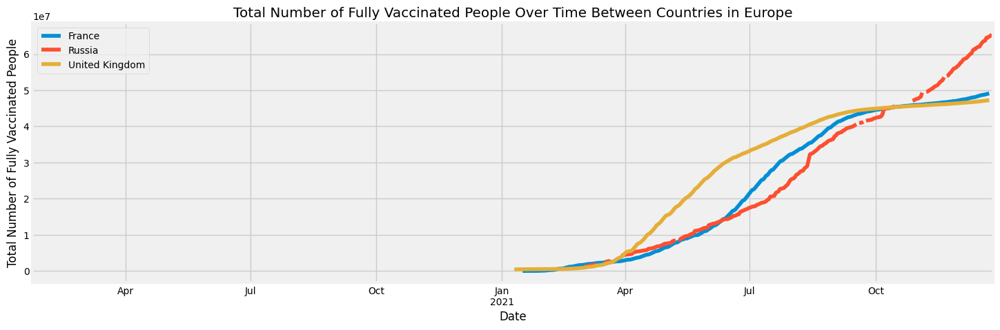

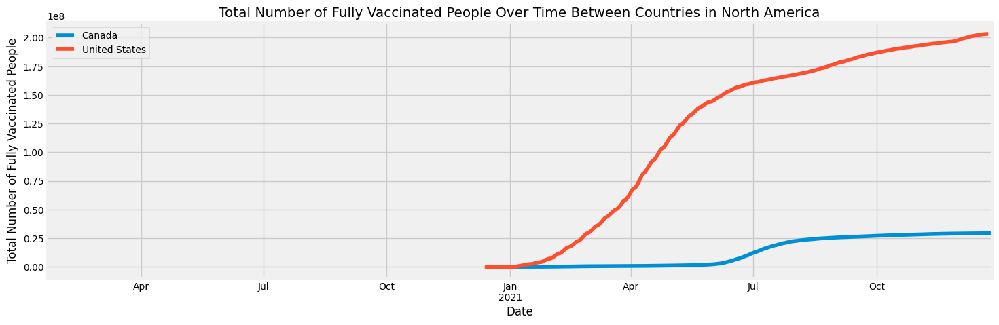

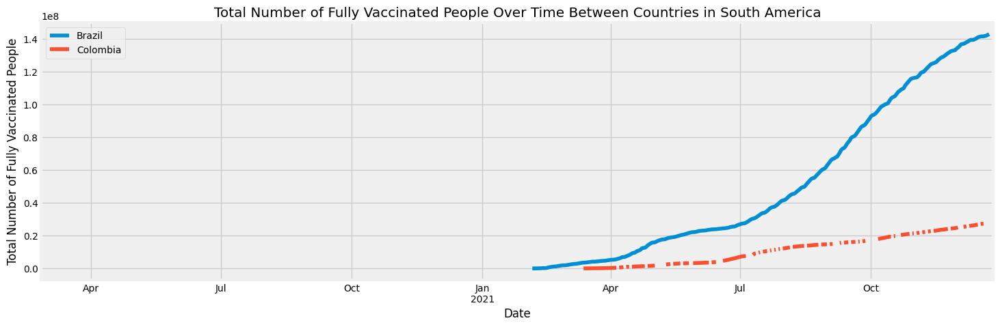

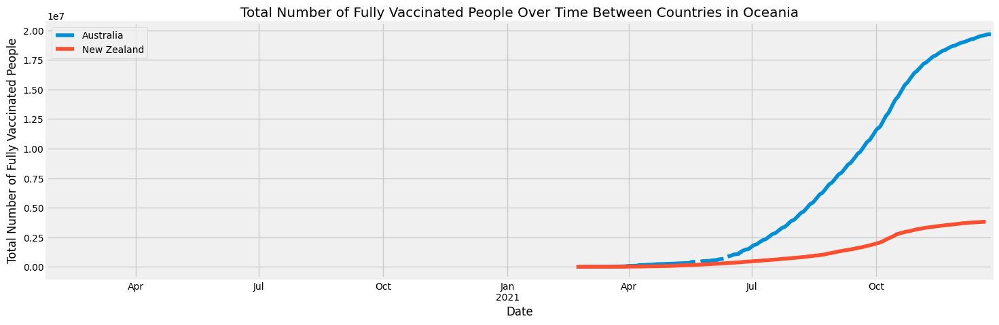

In [148]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['people_fully_vaccinated'].plot(legend='True')
  title = 'Total Number of Fully Vaccinated People Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
  plt.show()

## Cumulative Number of COVID-19 Tests Between Countries

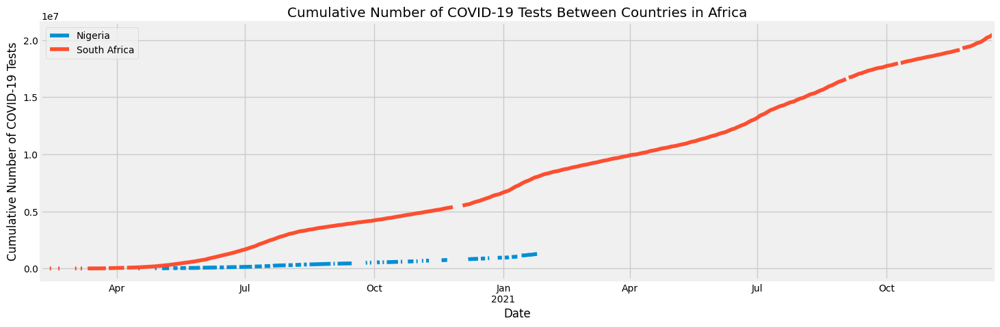

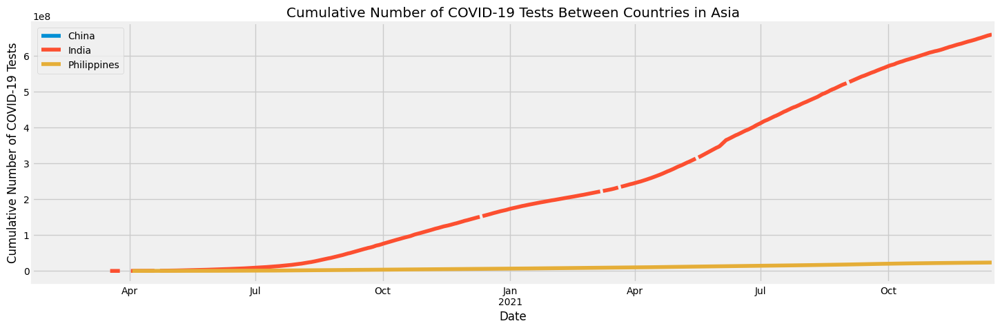

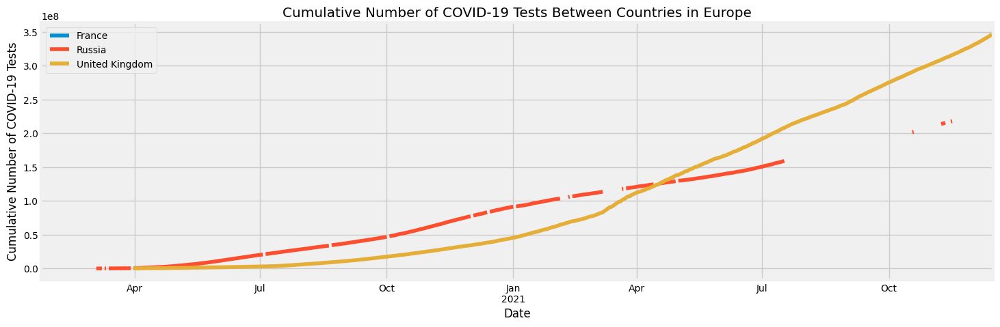

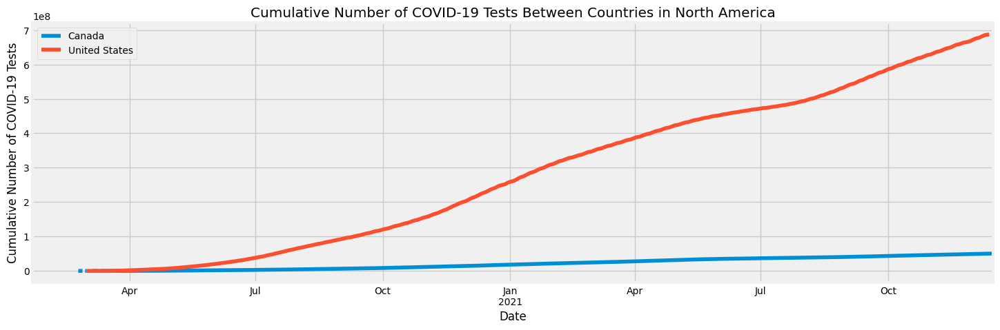

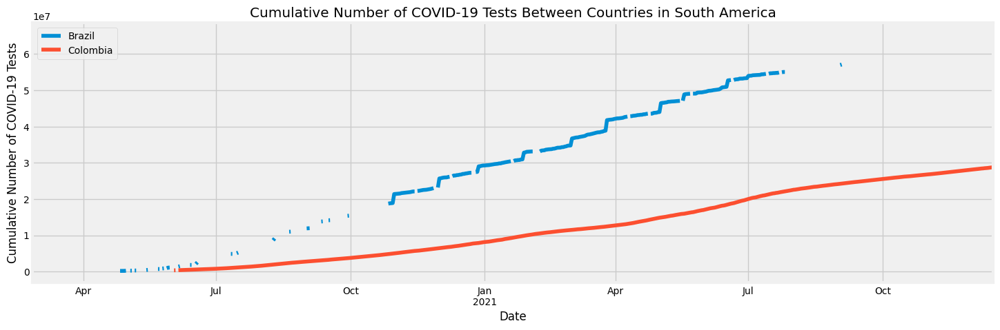

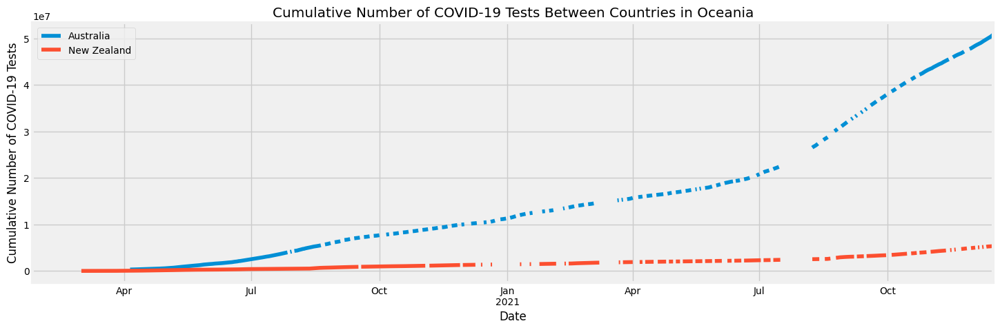

In [ ]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_tests'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Tests Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Tests')
  plt.show()

# Daily New Number of COVID-19 Test Between Countries

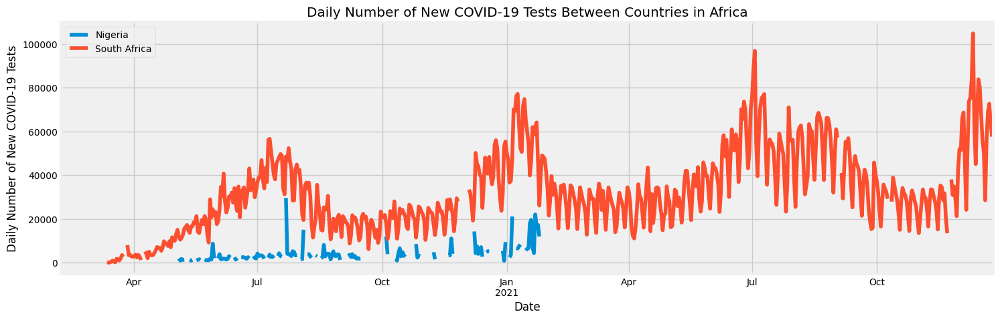

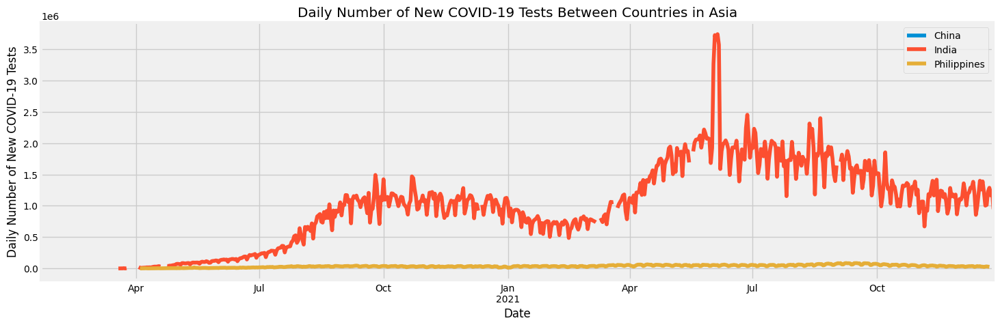

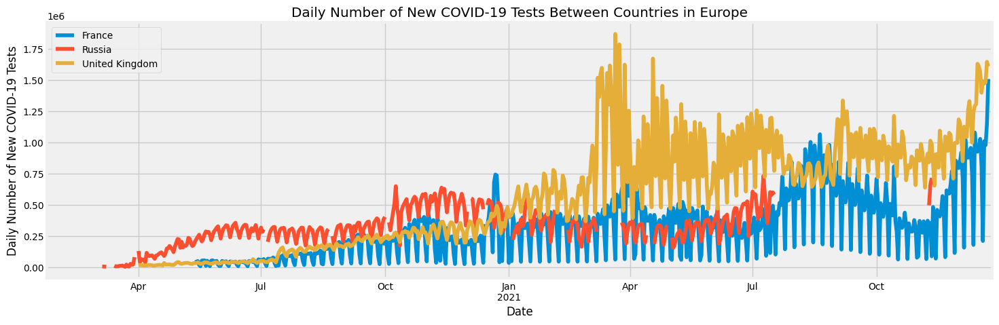

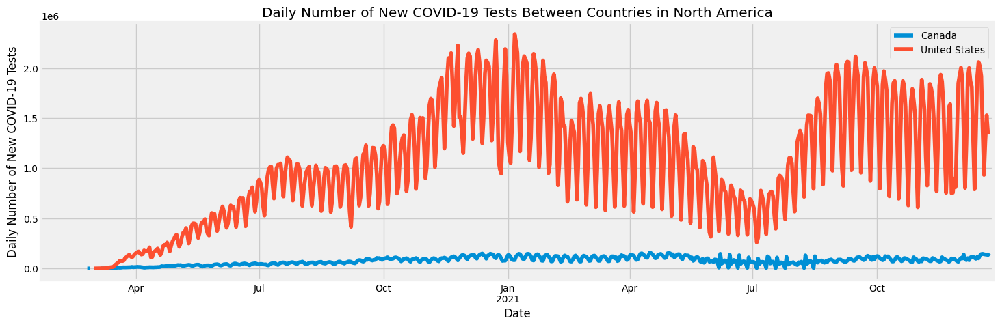

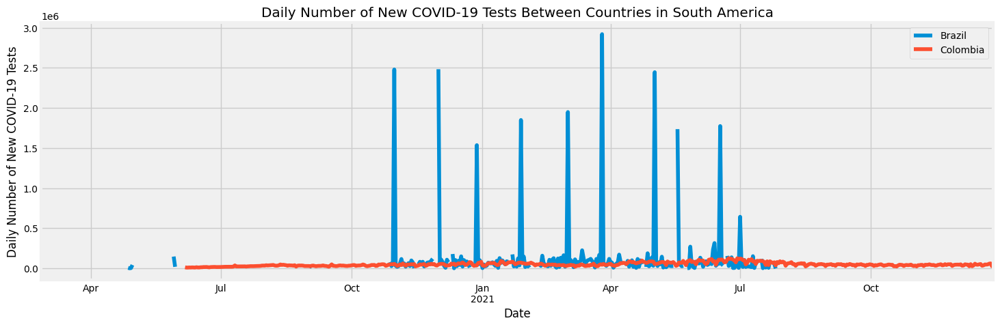

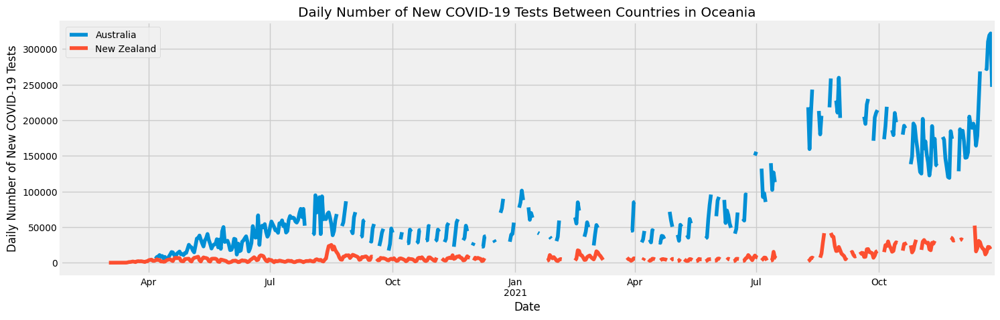

In [149]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_tests'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Tests Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Tests')
  plt.show()

## Percentage of COVID-19 Tests that are Positive Between Countries

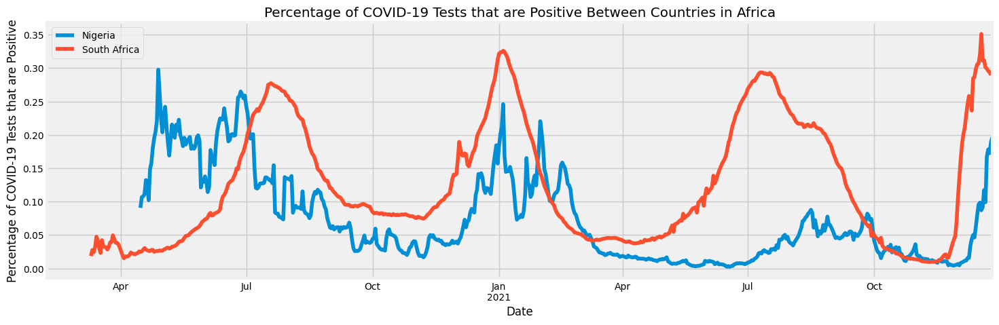

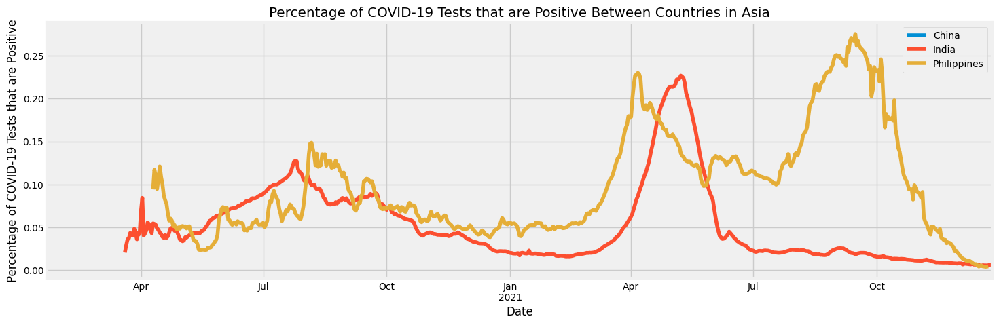

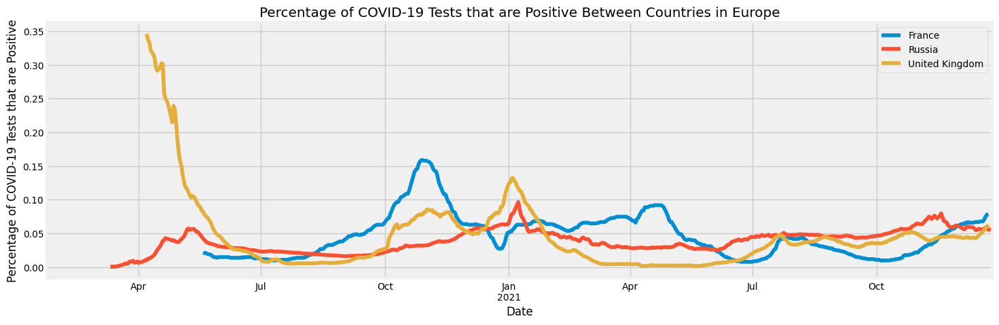

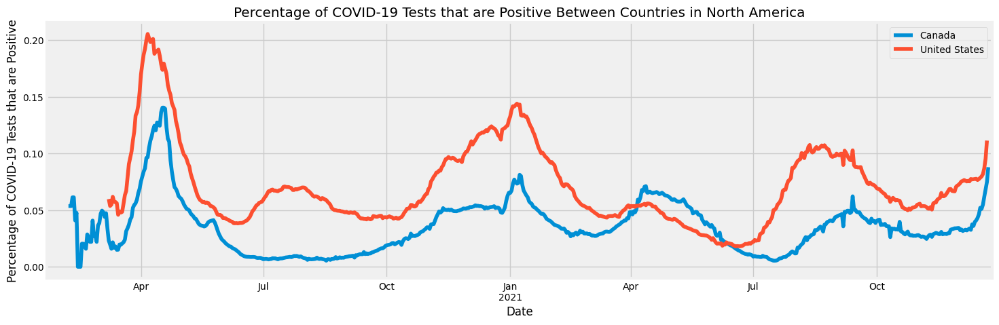

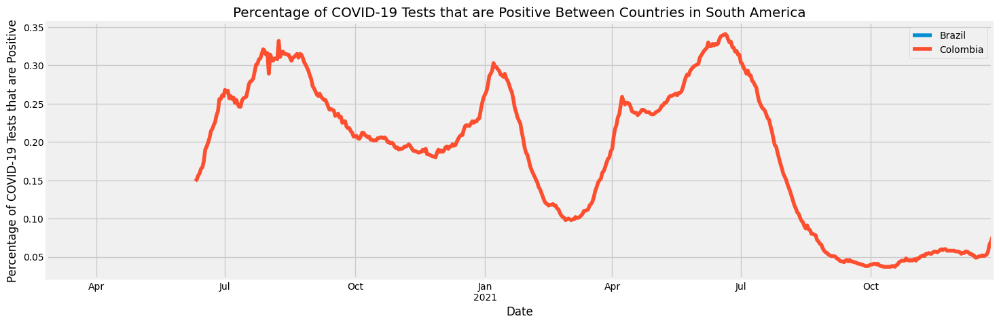

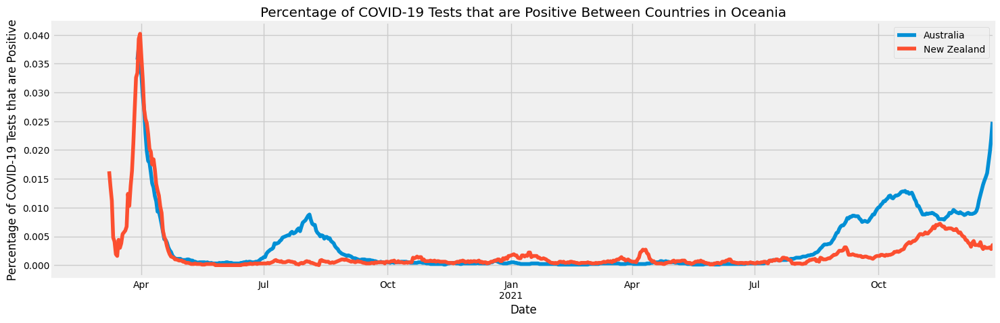

In [150]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['positive_rate'].plot(legend='True')
  title = 'Percentage of COVID-19 Tests that are Positive Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Percentage of COVID-19 Tests that are Positive')
  plt.show()

## Tests per New Confirmed Case of COVID-19 Between Countries

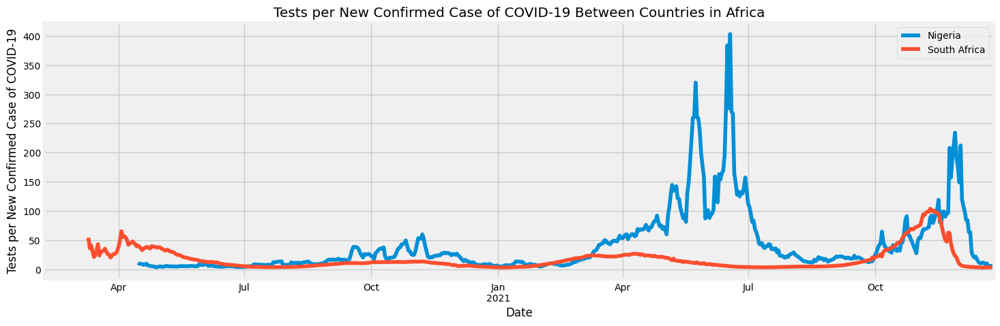

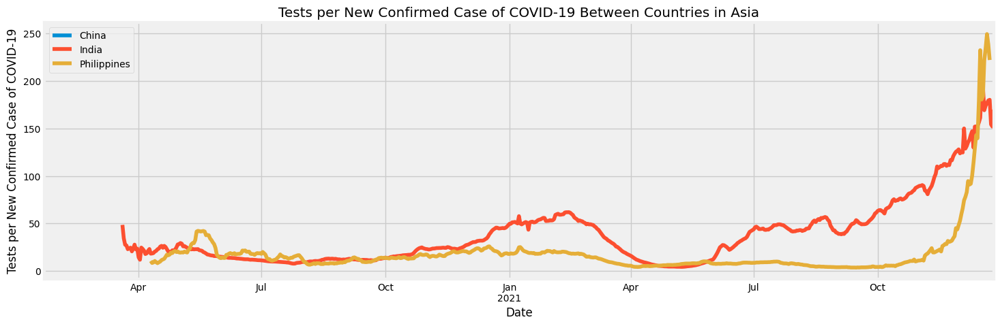

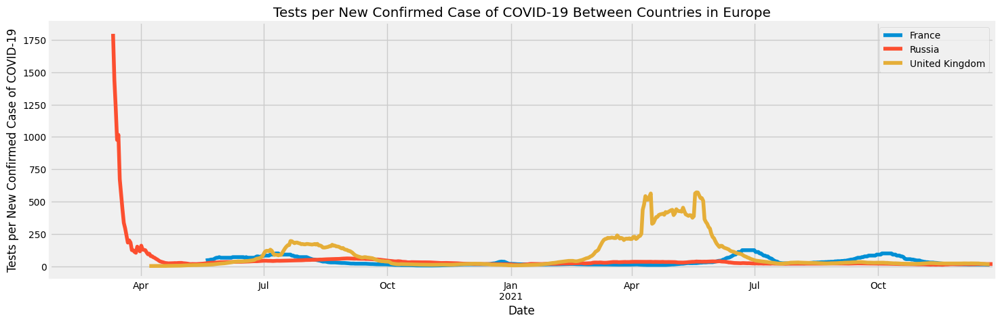

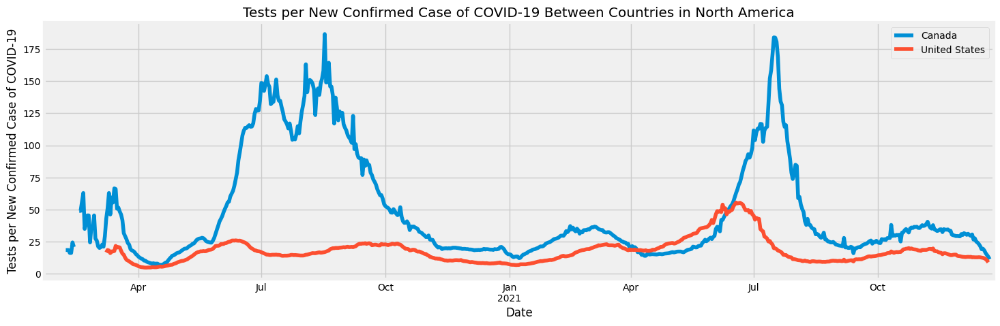

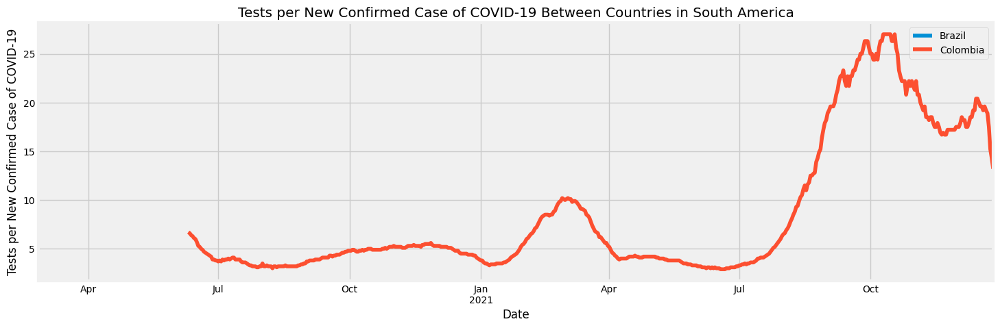

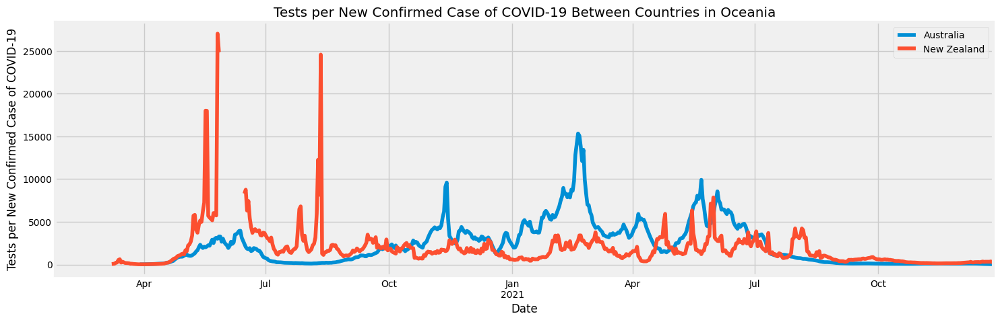

In [151]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['tests_per_case'].plot(legend='True')
  title = 'Tests per New Confirmed Case of COVID-19 Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Tests per New Confirmed Case of COVID-19')
  plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Countries

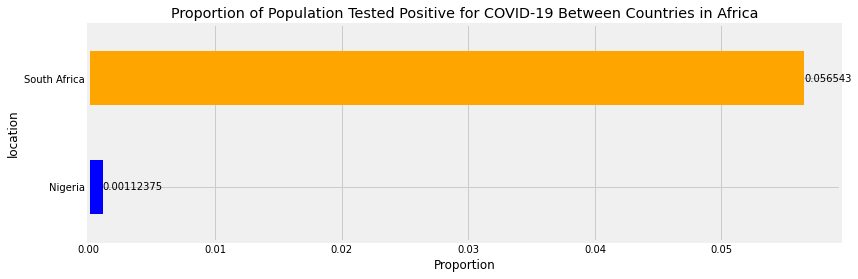

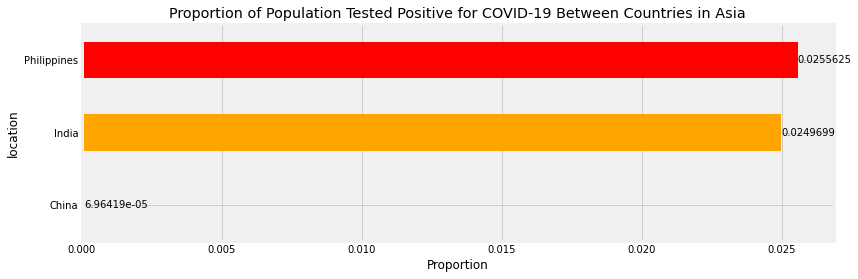

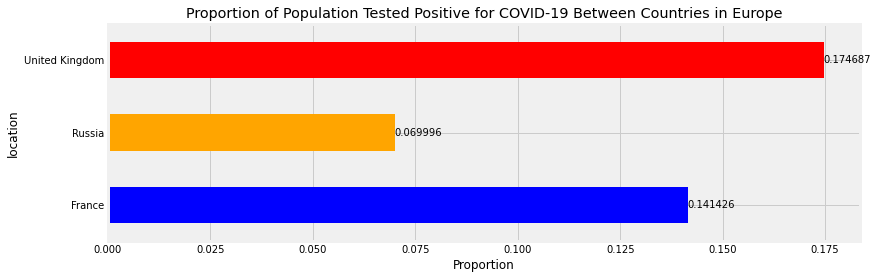

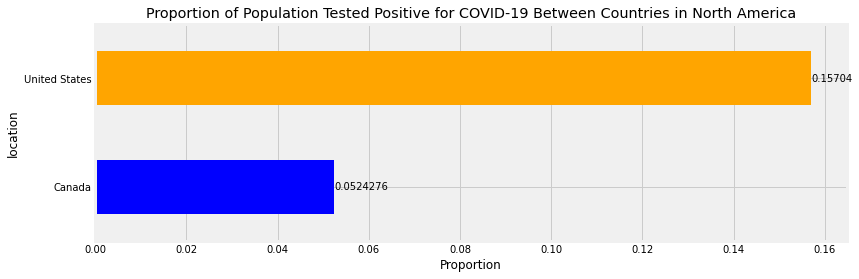

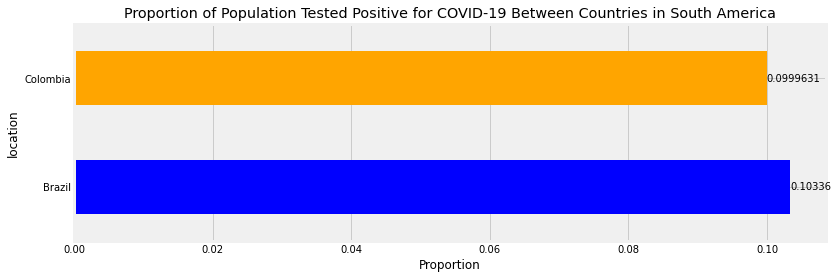

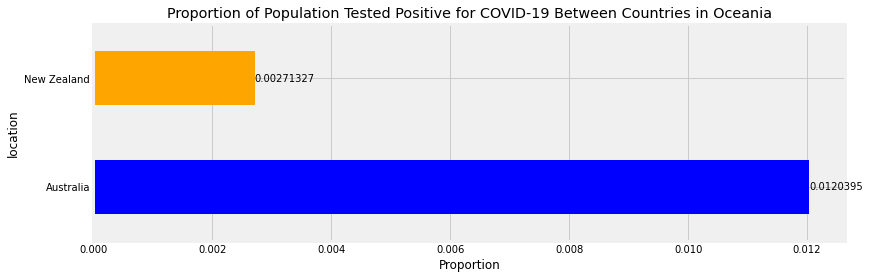

In [152]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].sum() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Population Tested Positive for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

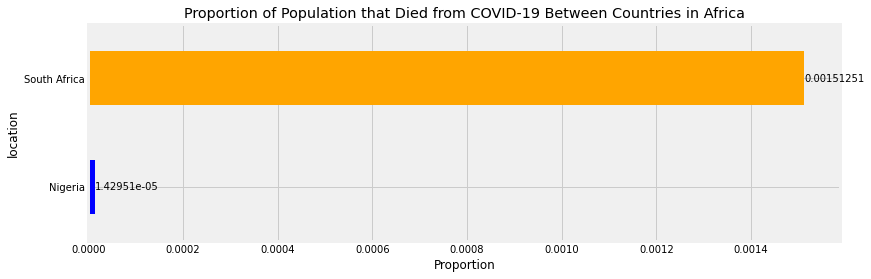

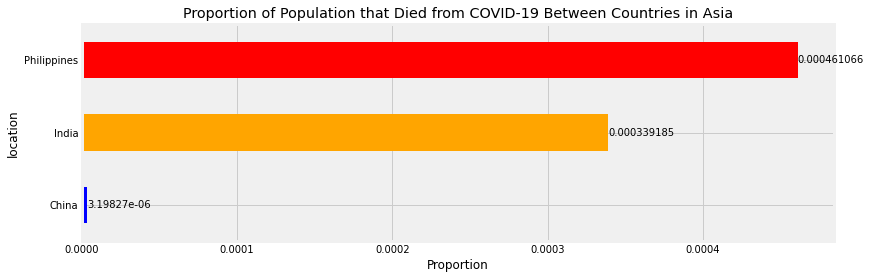

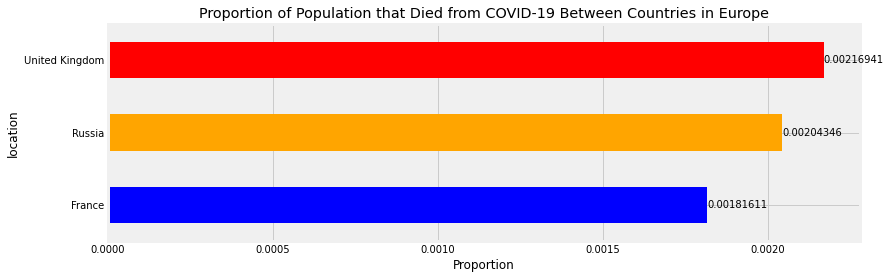

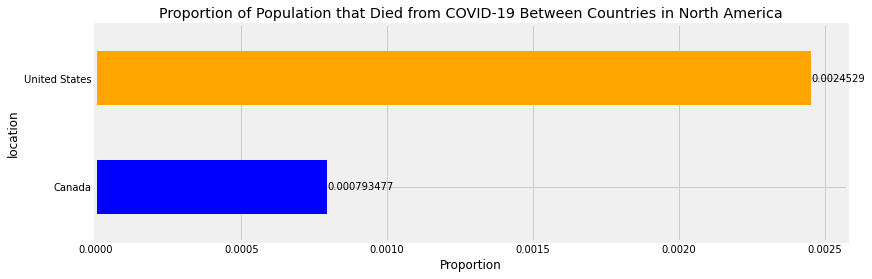

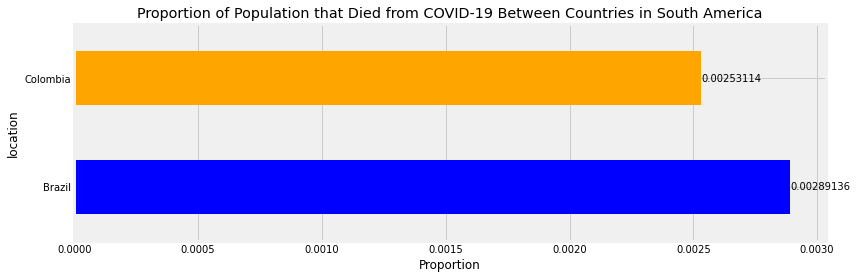

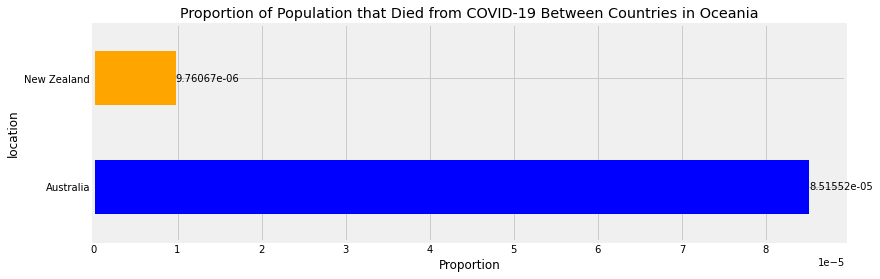

In [153]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  plt.title("Proportion of Population that Died from COVID-19 Between Countries")
  plt.title("Proportion of Population that Died from COVID-19 Between Countries")
  title = "Proportion of Population that Died from COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Countries

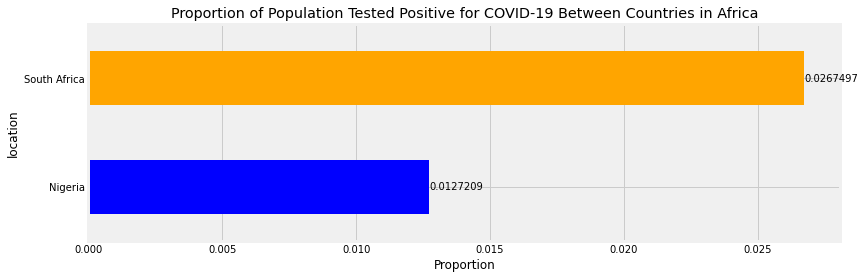

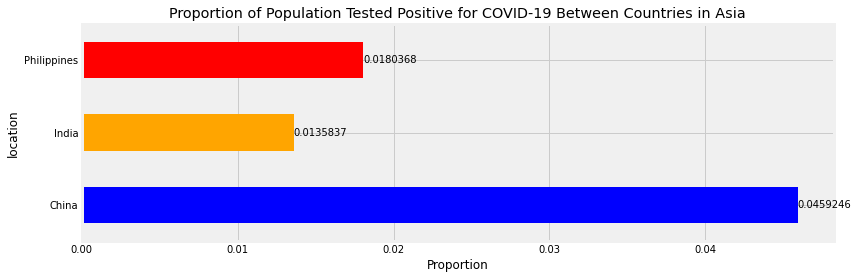

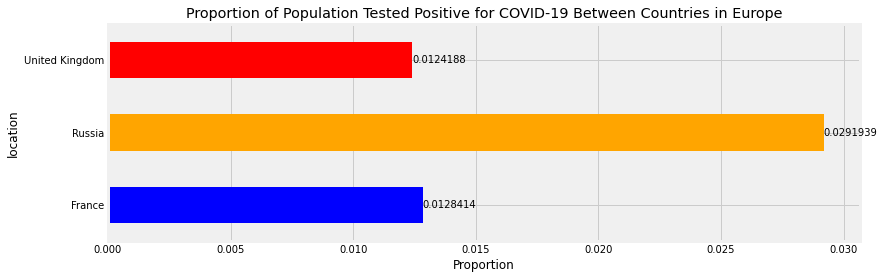

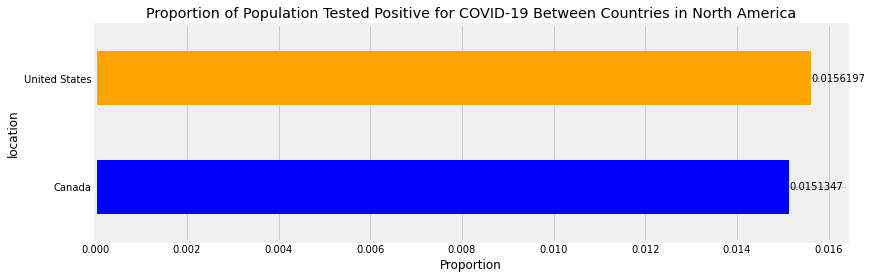

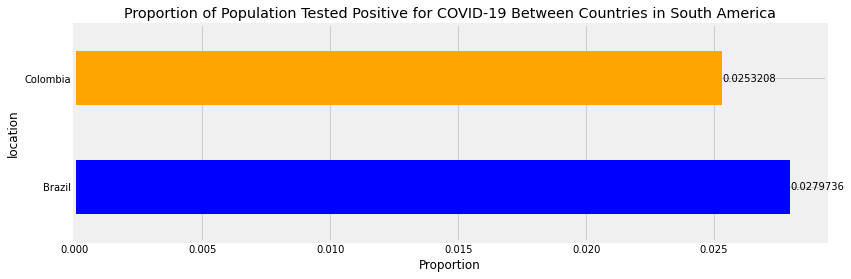

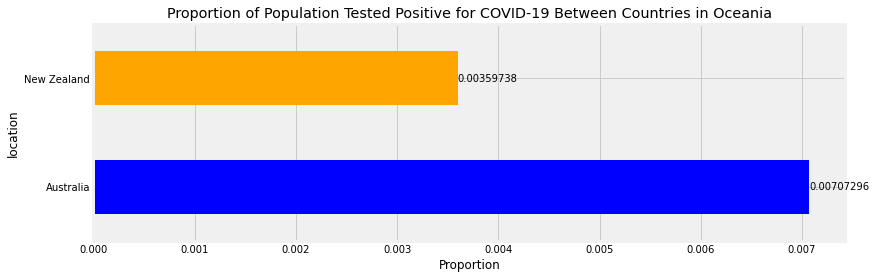

In [154]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum() / continent_countries.groupby("location")["new_cases"].sum()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Population Tested Positive for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Countries


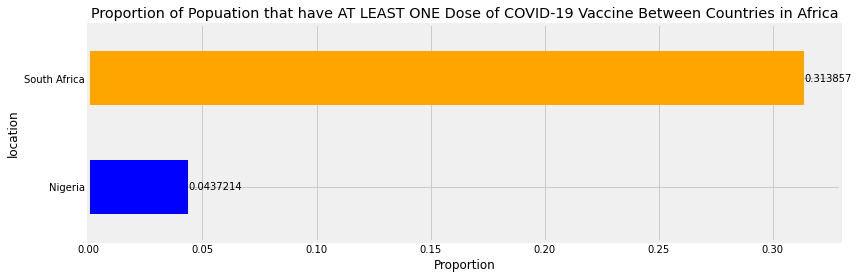

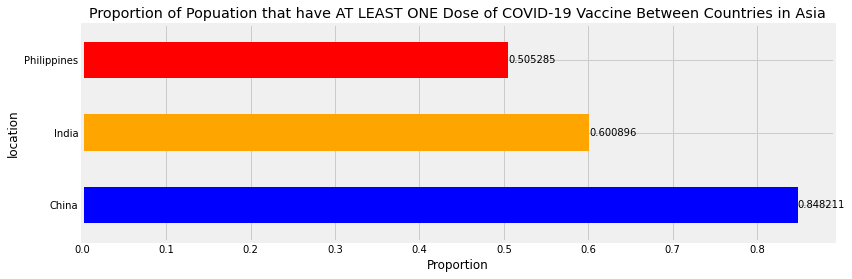

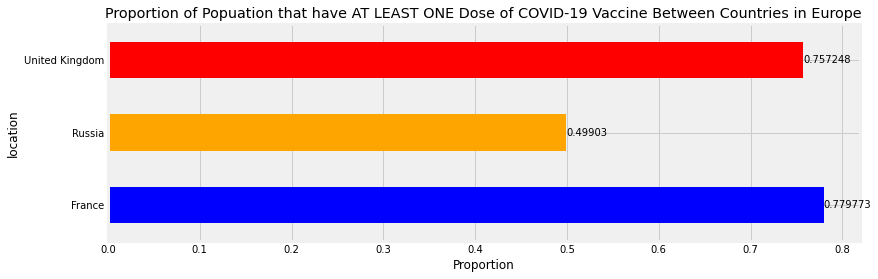

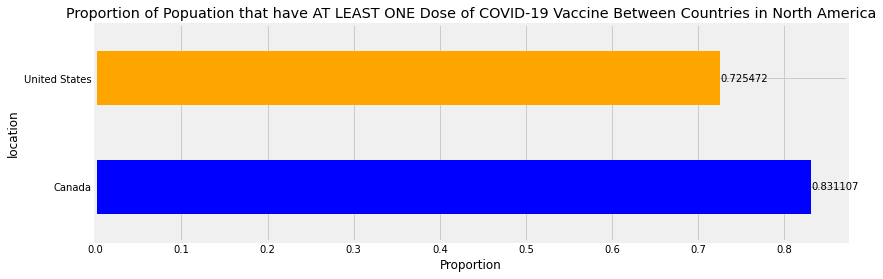

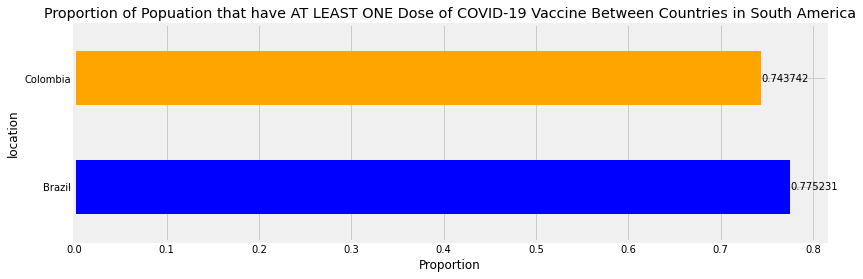

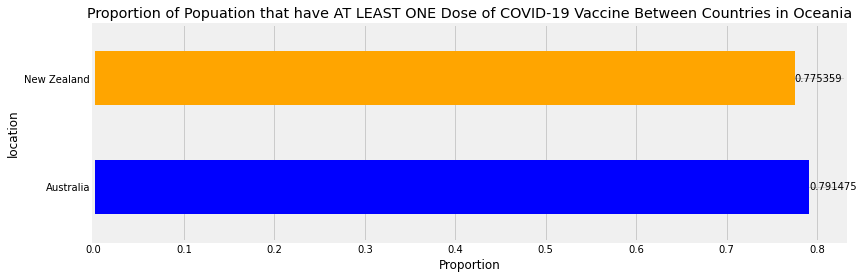

In [155]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_vaccinated"].max() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

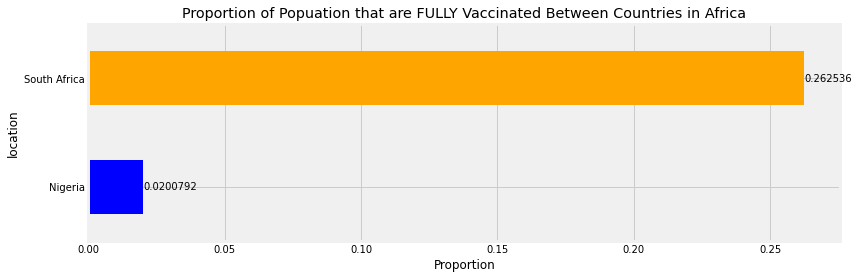

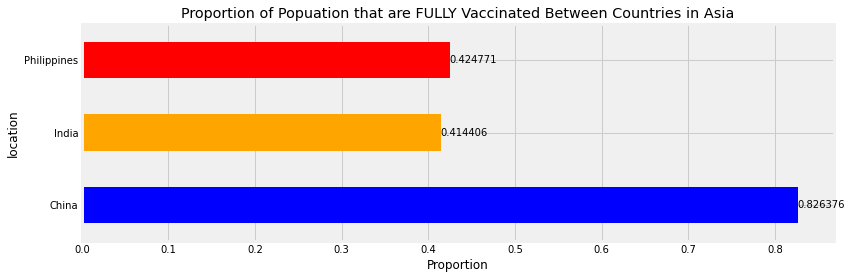

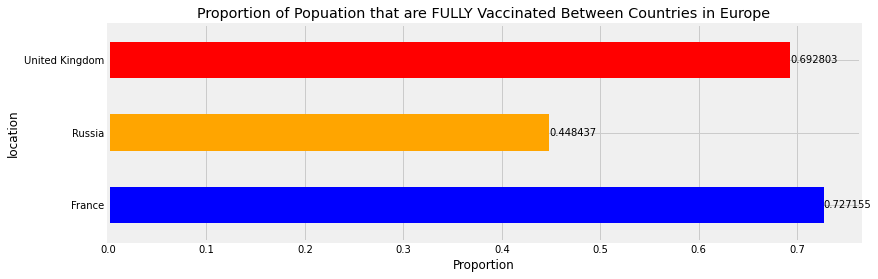

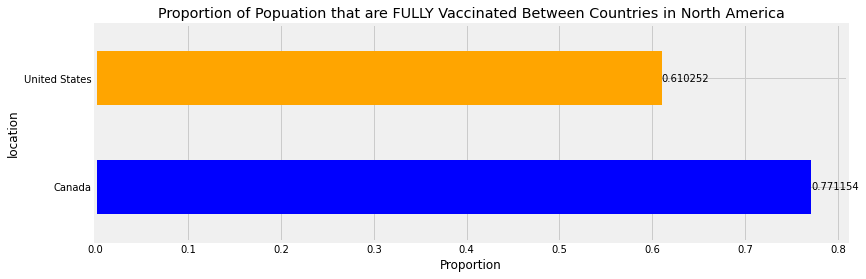

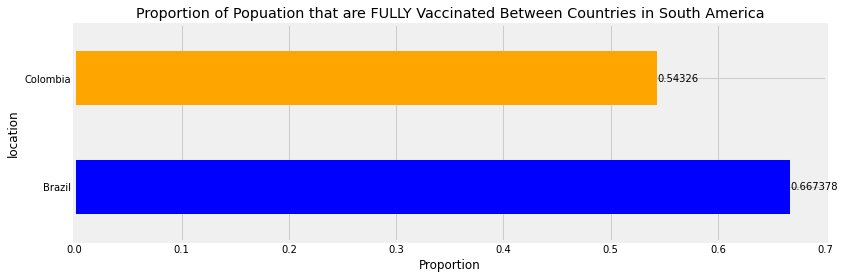

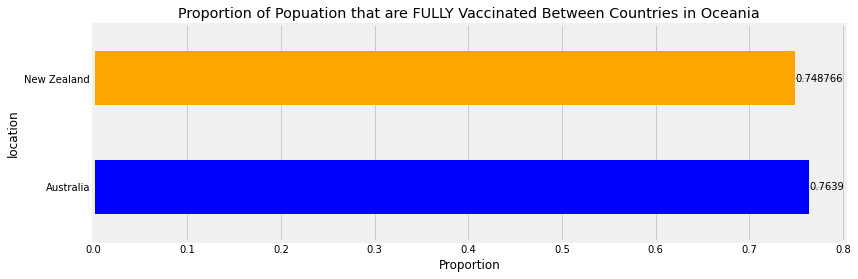

In [156]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_fully_vaccinated"].max() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Popuation that are FULLY Vaccinated Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Countries

In [157]:
for continent_countries in countries_continents_lst:
  continent_countries['Proportion_of_cases_of_population'] = continent_countries['total_cases'] / continent_countries['population']
  continent_countries['Proportion_of_deaths_of_population'] = continent_countries['total_deaths'] / continent_countries['population']
  continent_countries['Proportion_of_deaths_of_pos_cases'] = continent_countries['total_deaths'] / continent_countries['total_cases']
  continent_countries['Proportion_of_vaccinated_of_population'] = continent_countries['people_vaccinated'] / continent_countries['population']
  continent_countries['Proportion_of_fully_vaccinated_of_population'] = continent_countries['people_fully_vaccinated'] / continent_countries['population']

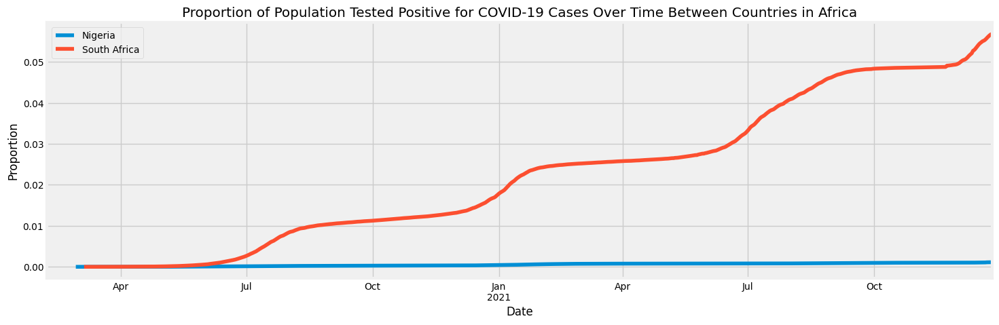

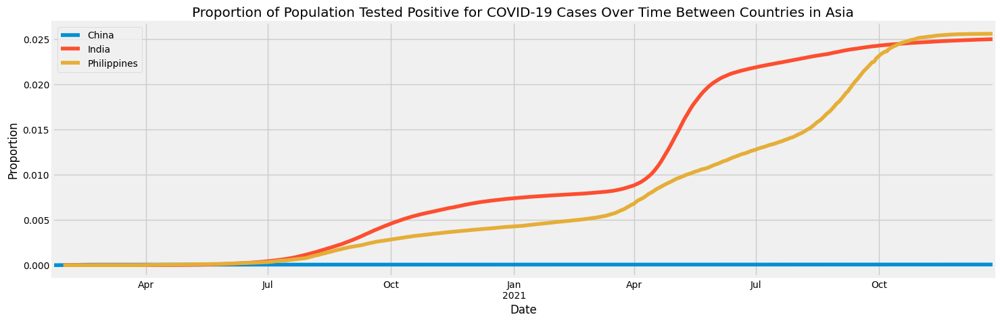

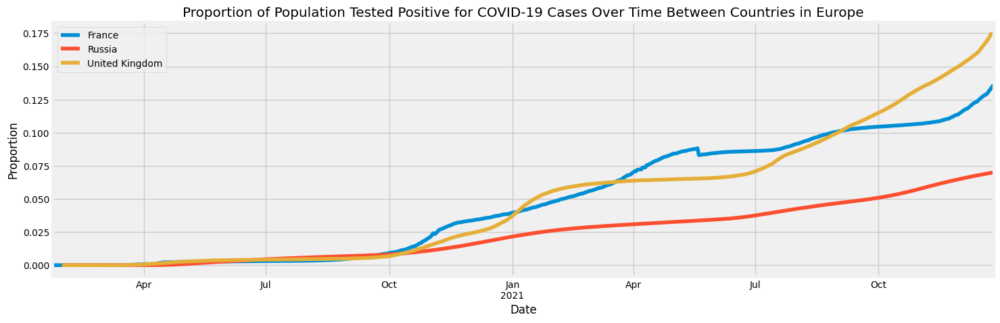

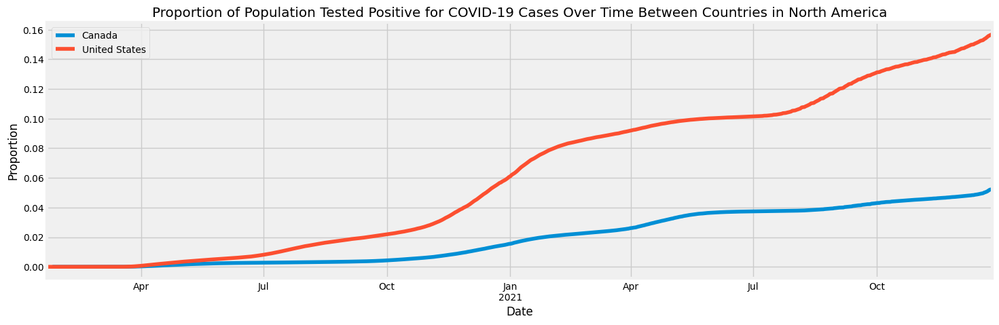

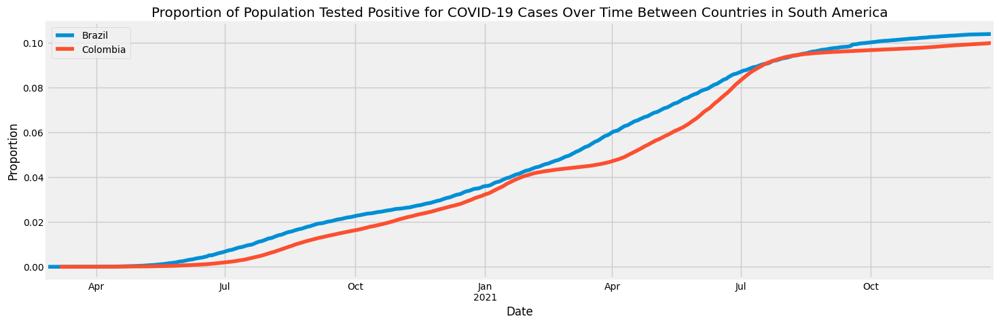

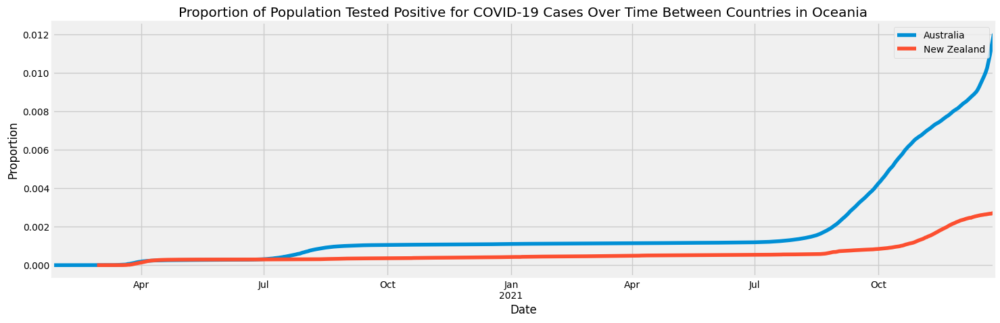

In [158]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
  title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

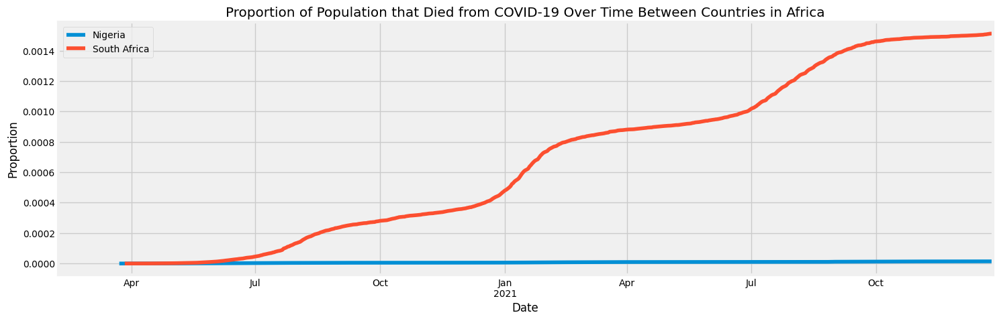

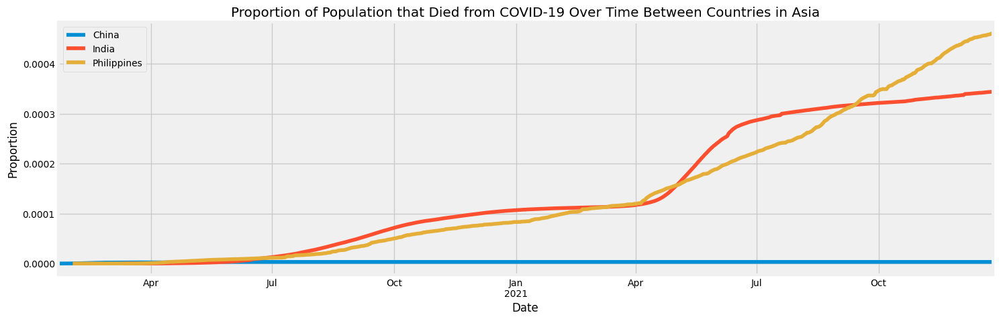

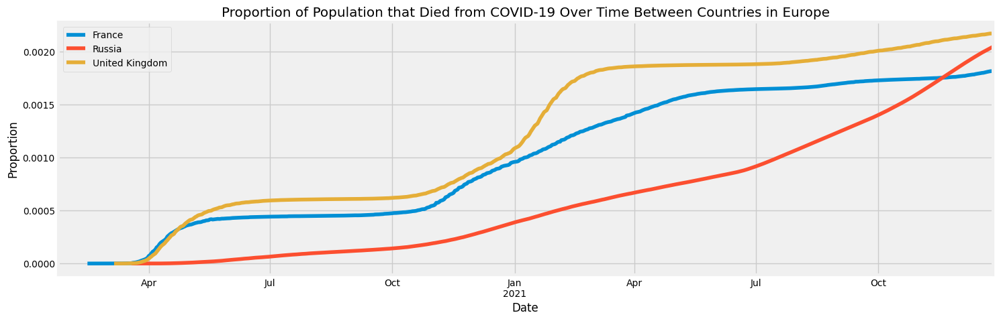

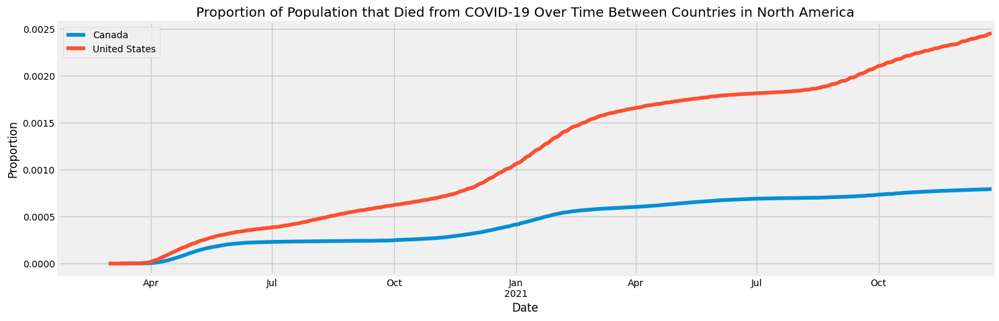

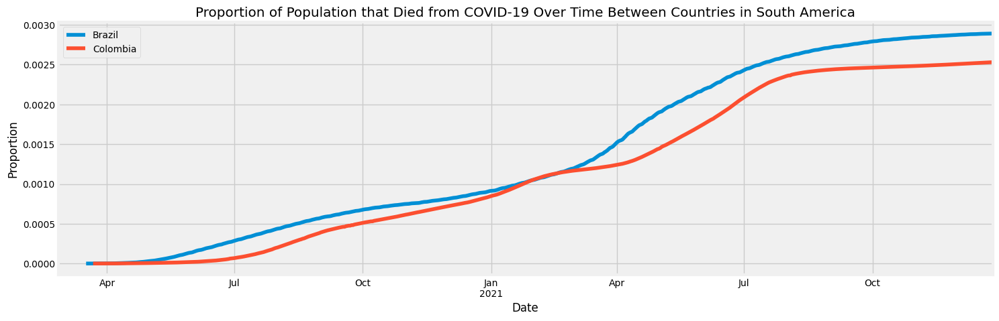

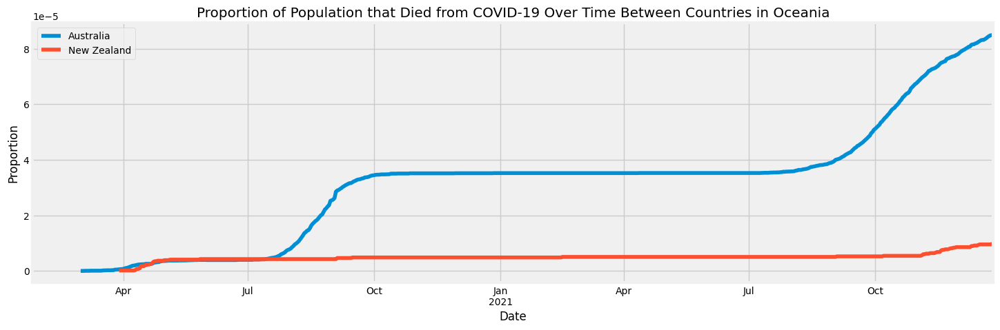

In [159]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
  title = 'Proportion of Population that Died from COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

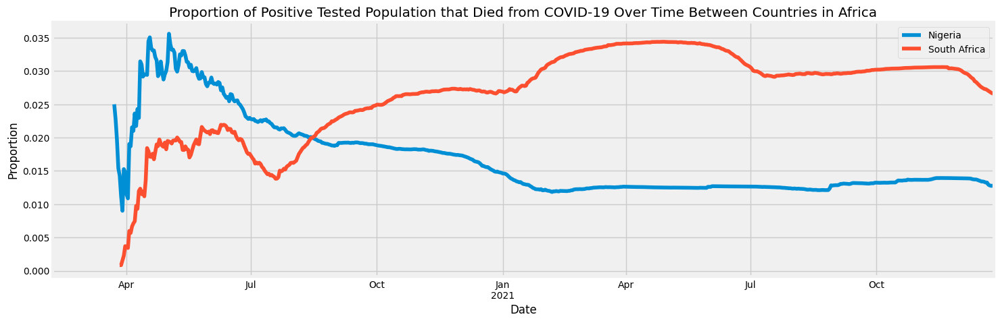

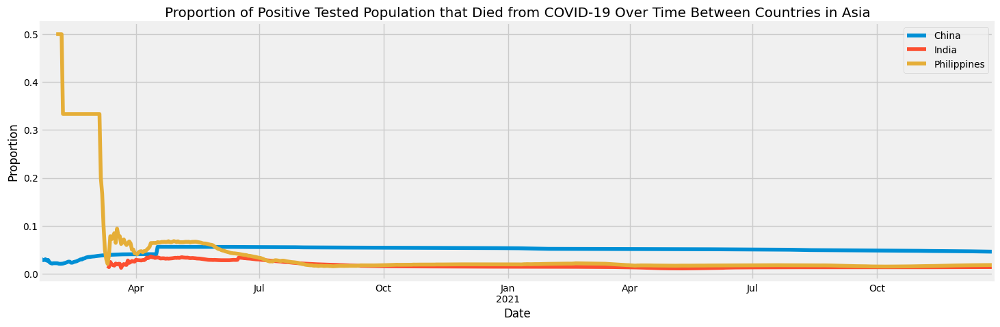

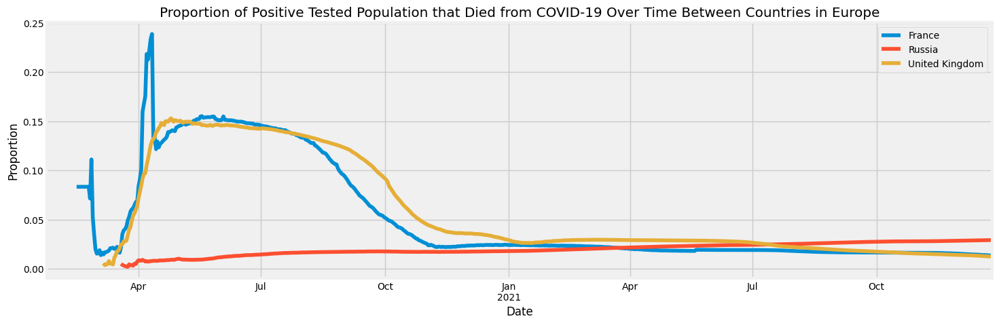

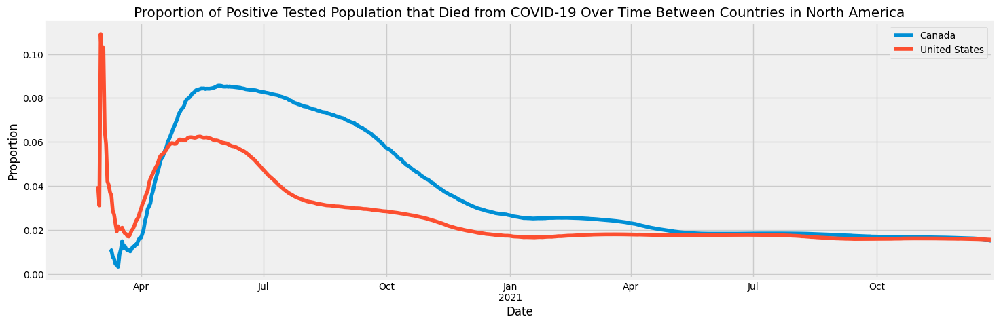

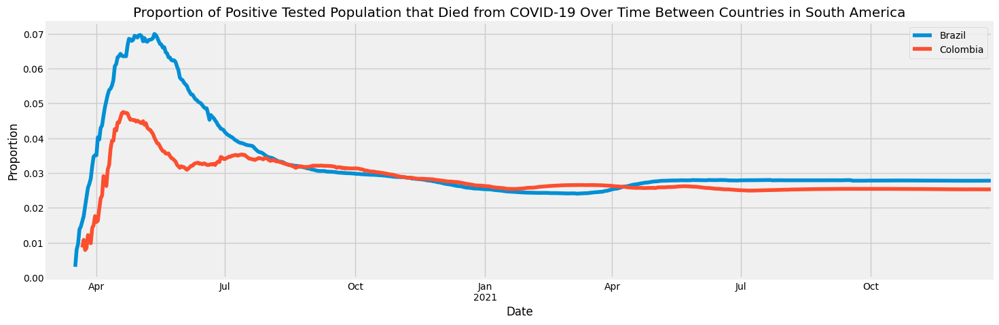

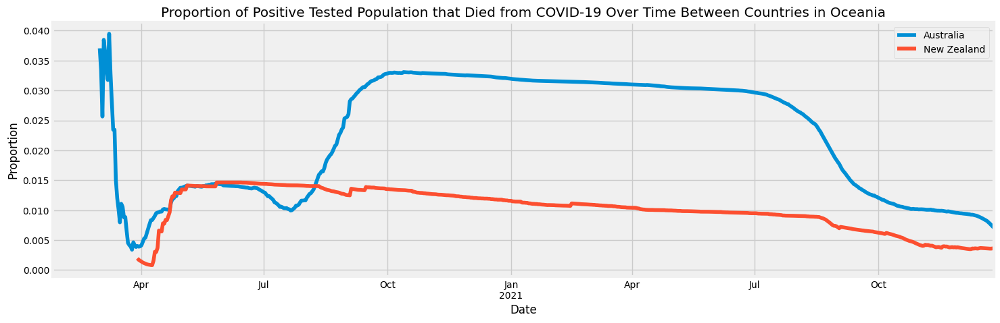

In [160]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
  title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

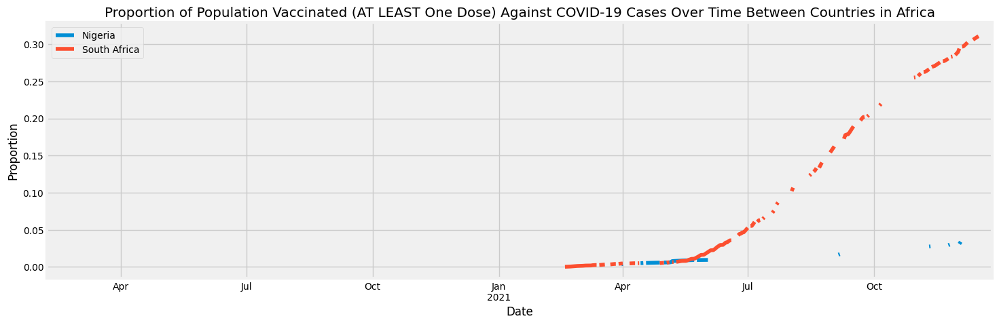

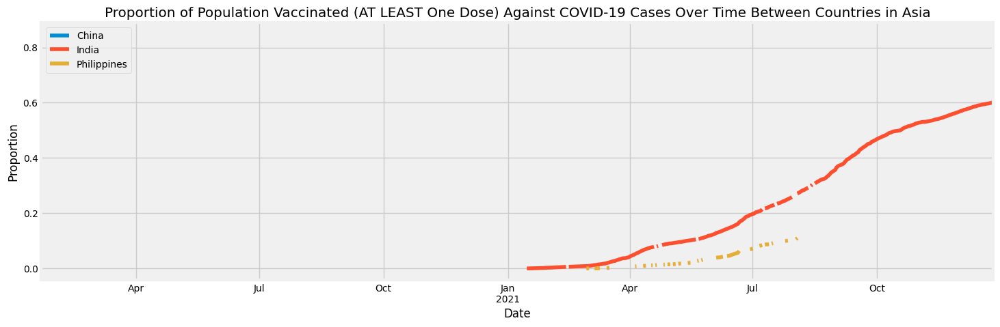

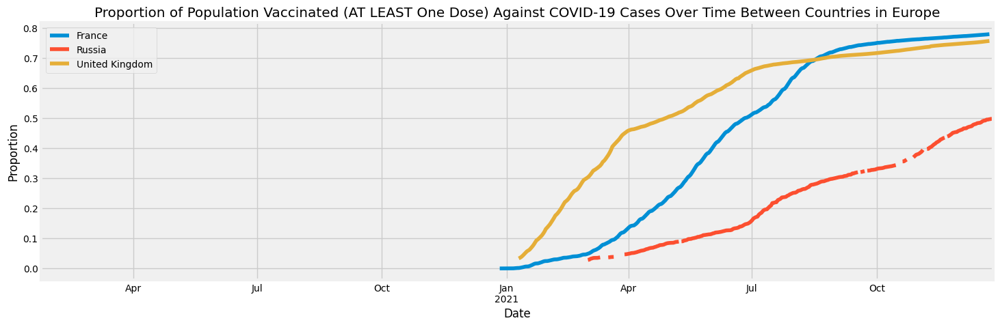

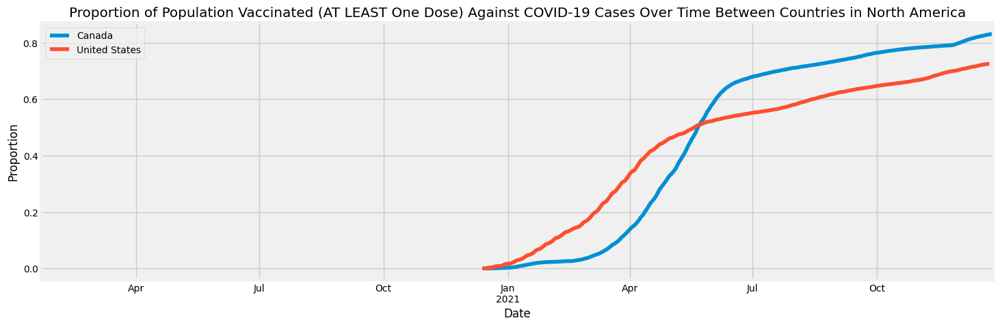

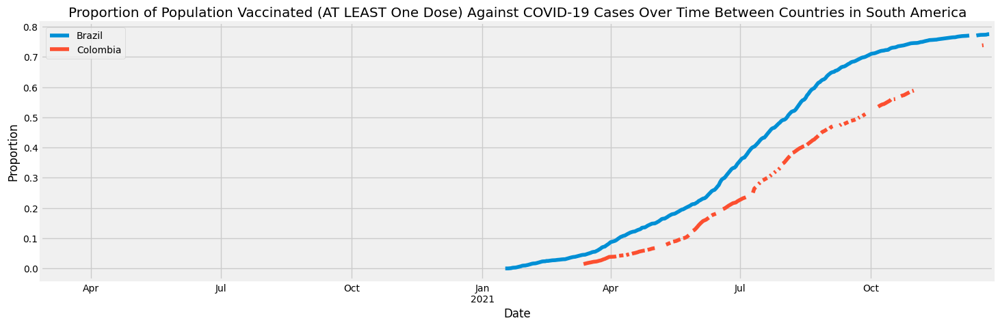

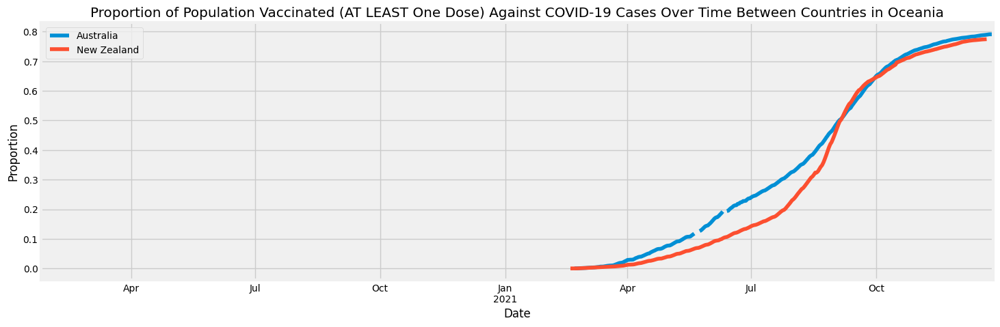

In [161]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
  title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

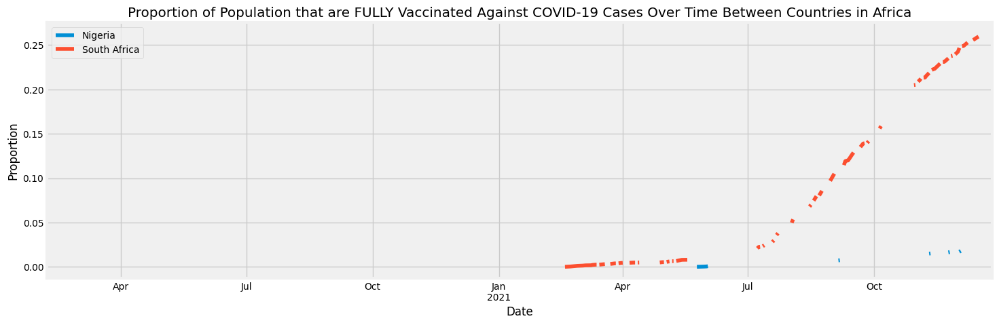

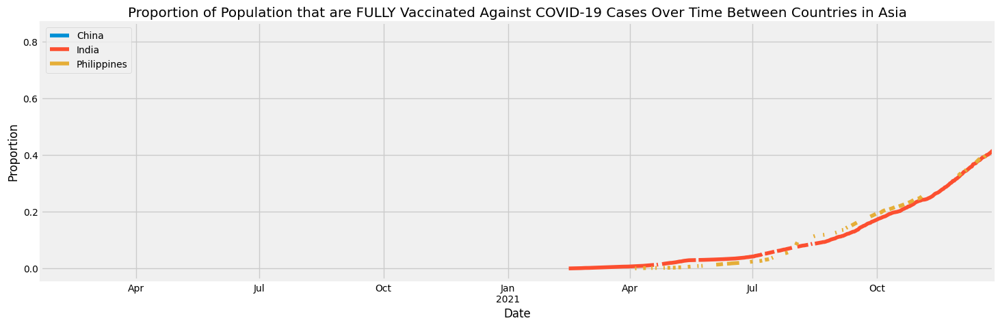

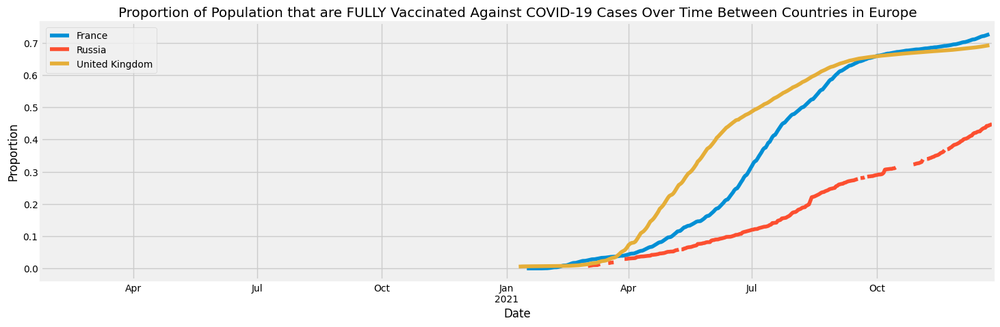

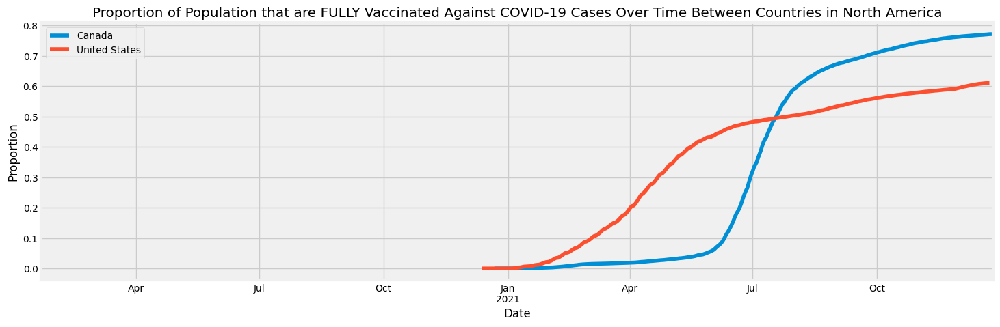

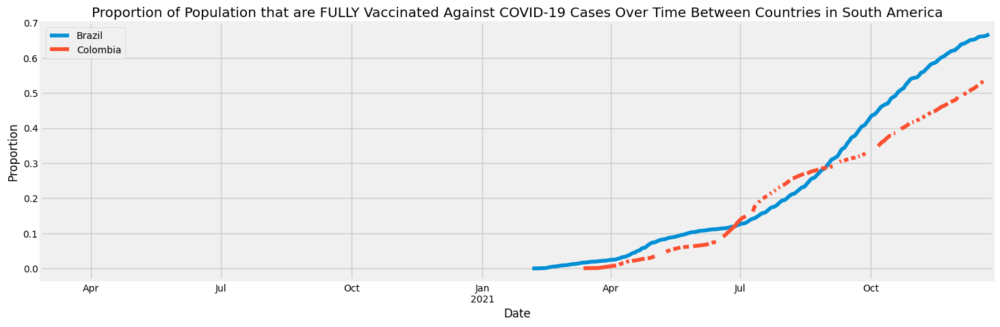

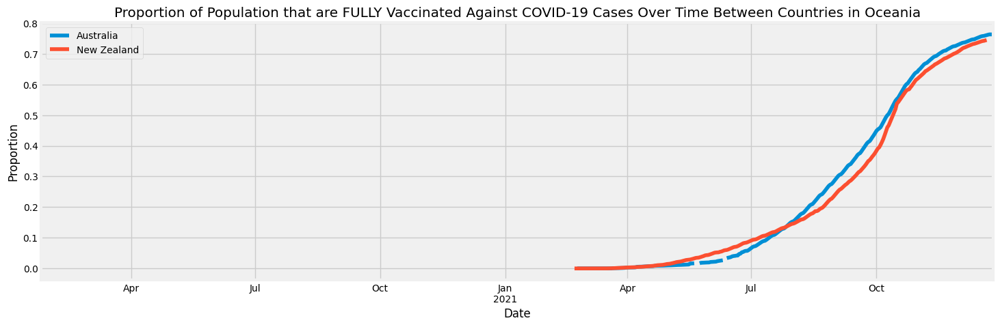

In [162]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
  title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

## Total Number of COVID-19 Cases Between Countries

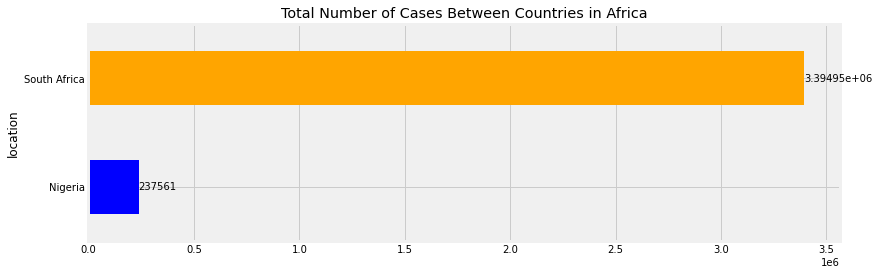

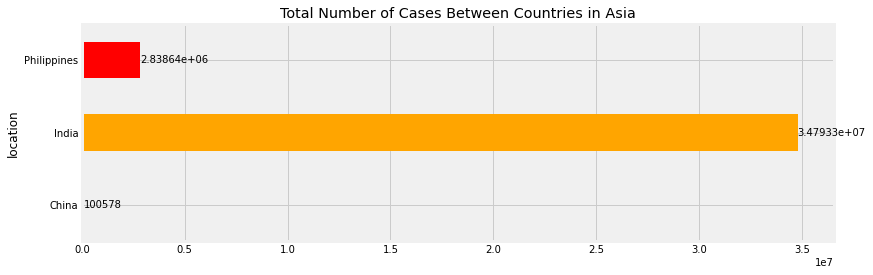

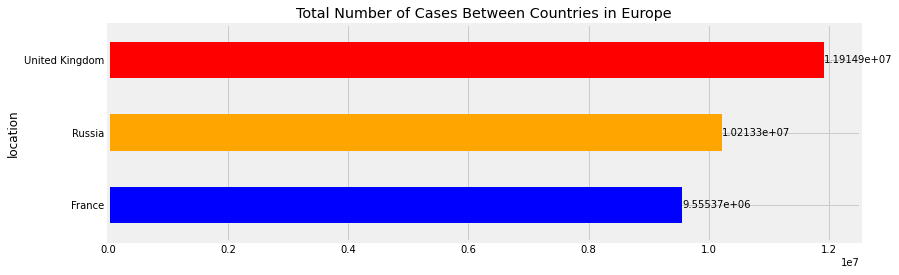

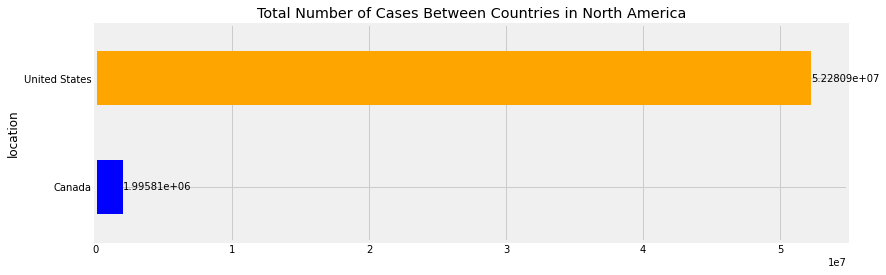

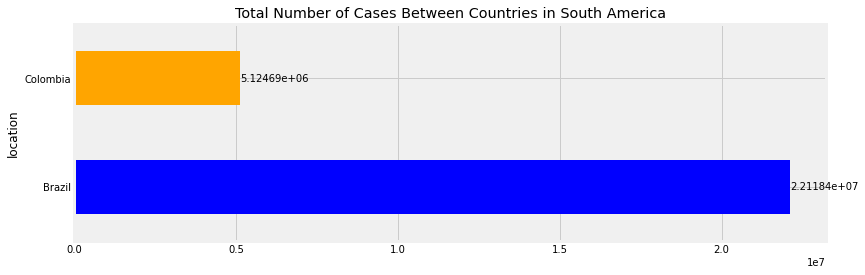

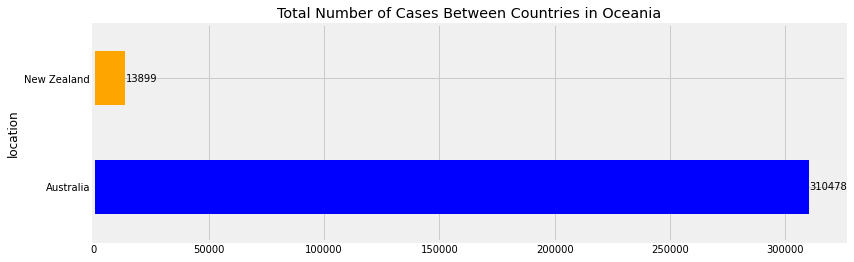

In [163]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].sum()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Total Number of Cases Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Countries

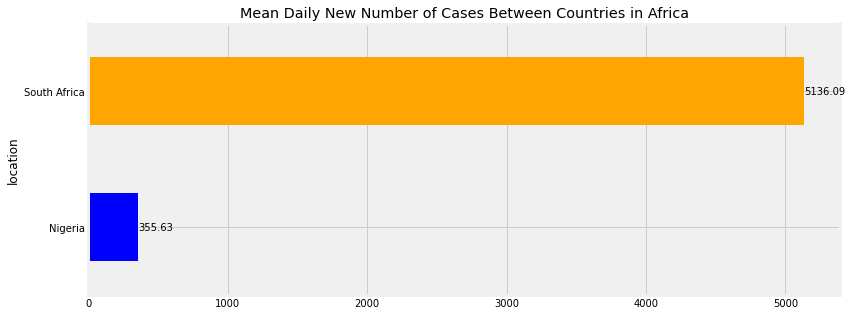

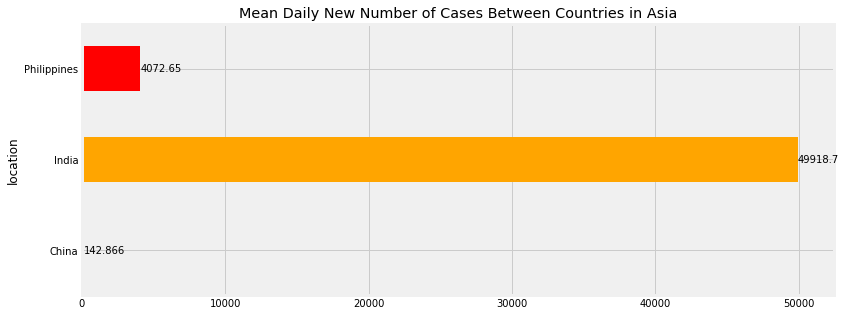

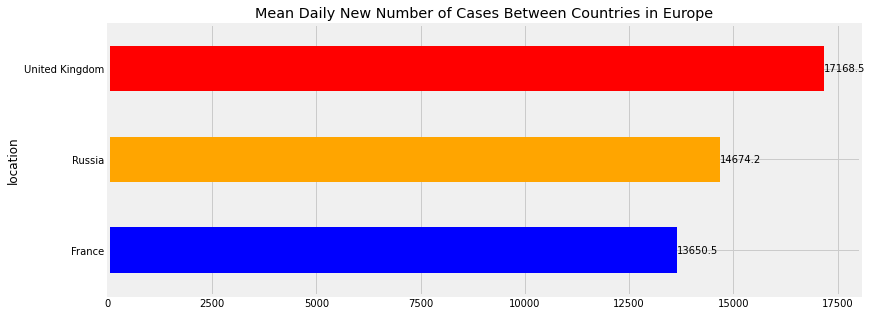

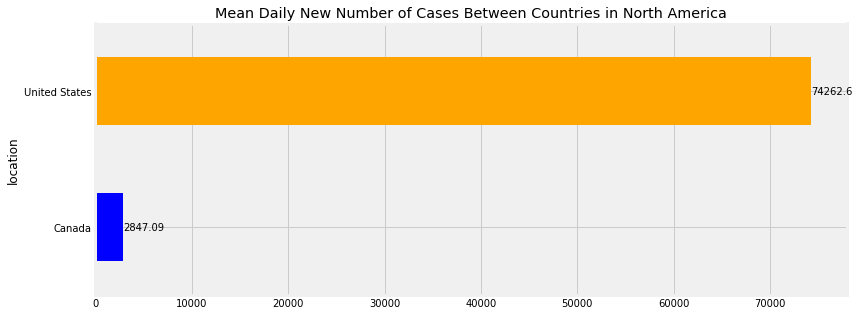

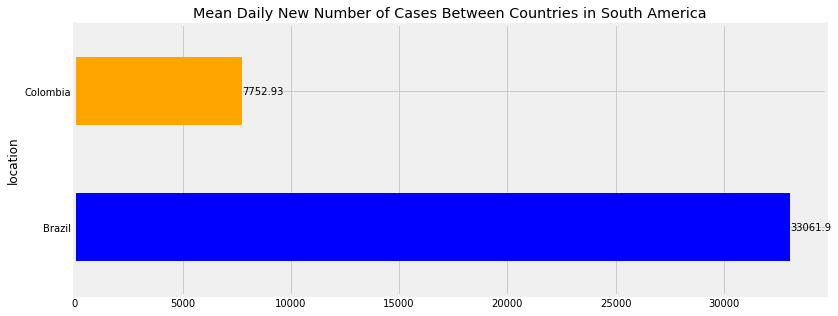

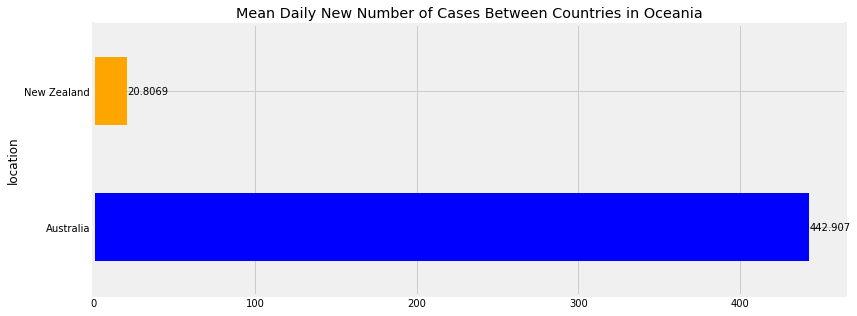

In [164]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of Cases Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Countries

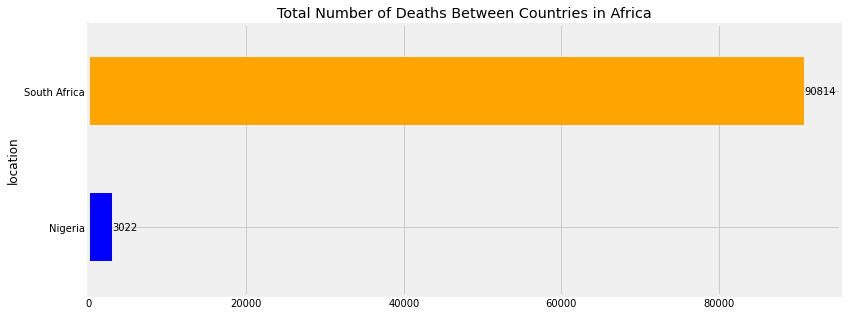

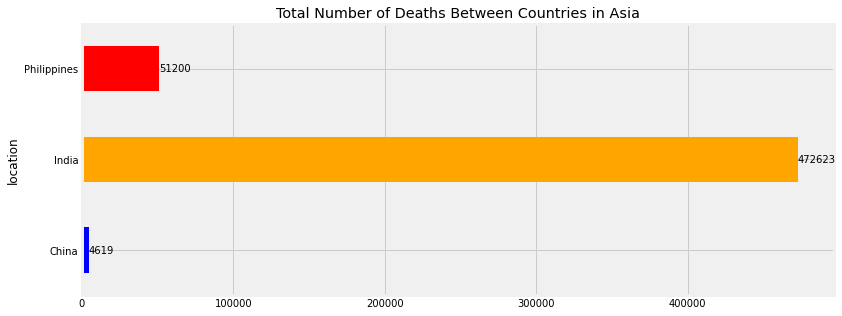

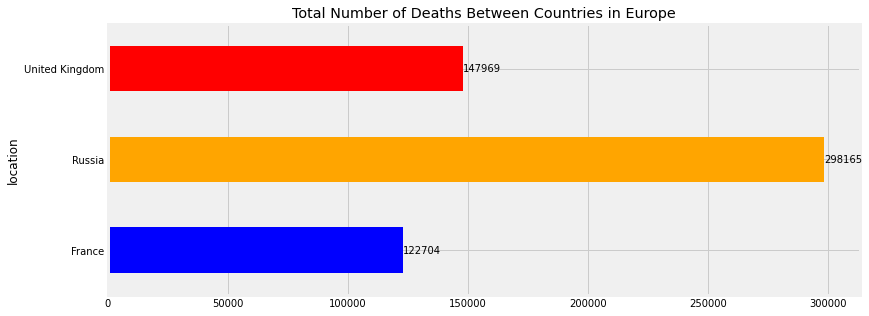

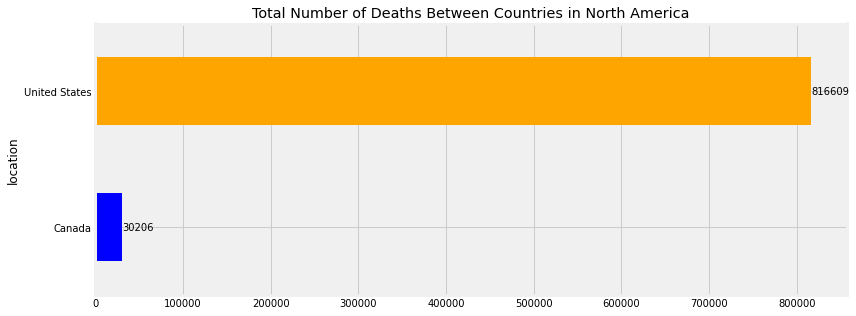

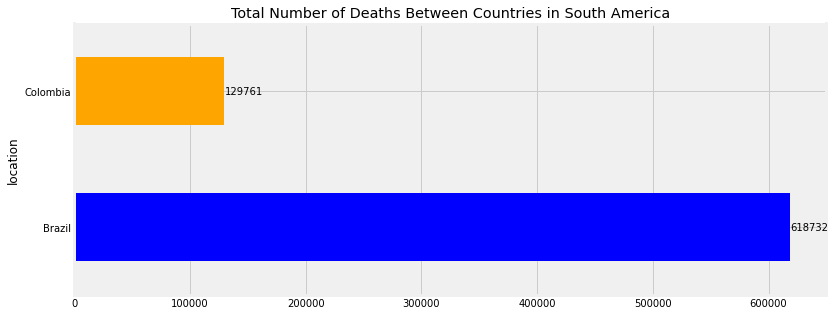

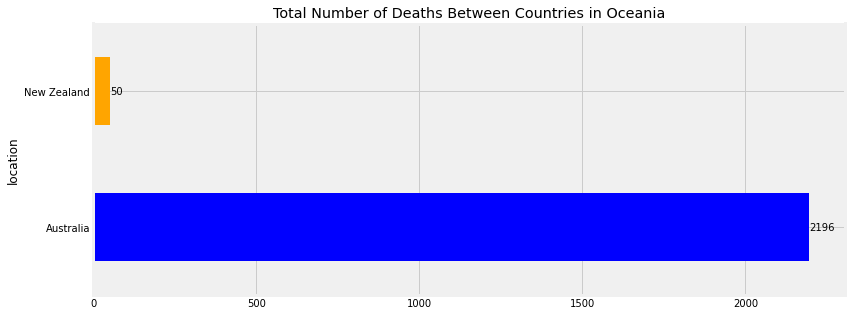

In [165]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Deaths Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Deaths")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Countries

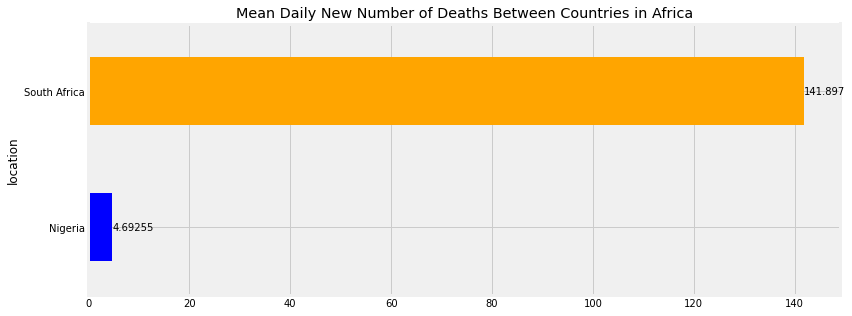

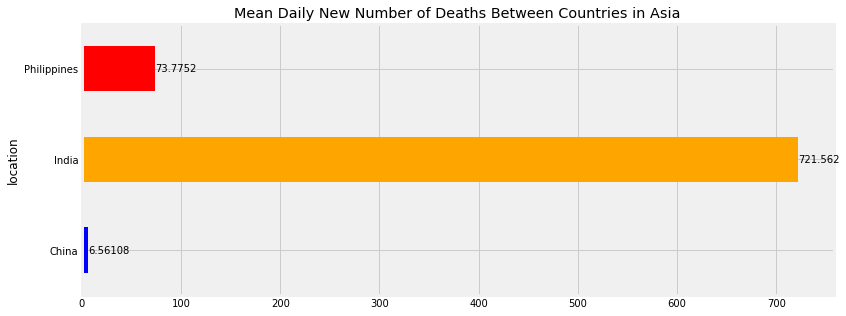

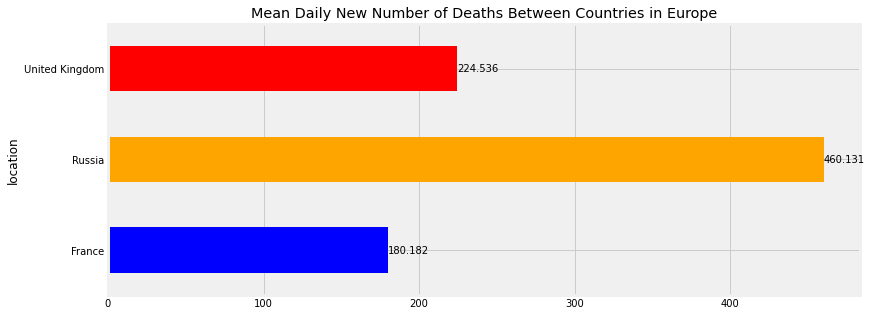

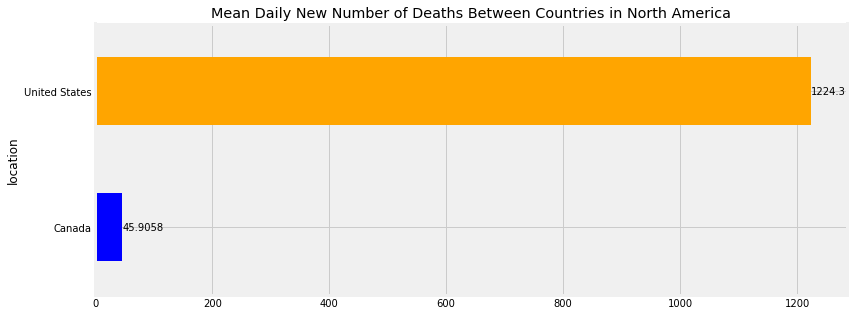

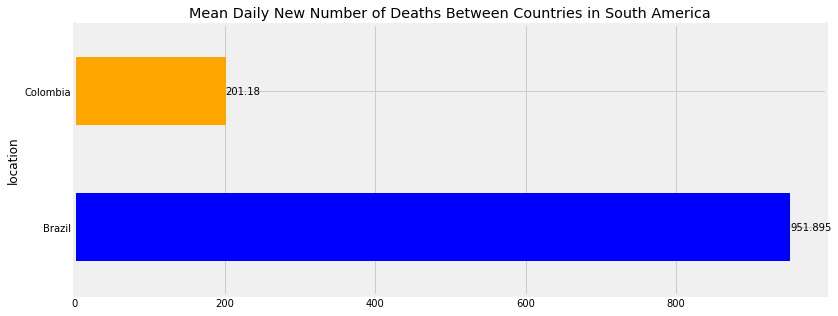

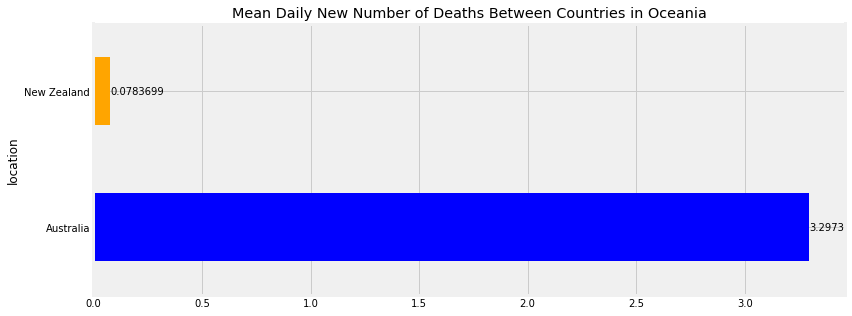

In [166]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of Deaths Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Deaths")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Countries

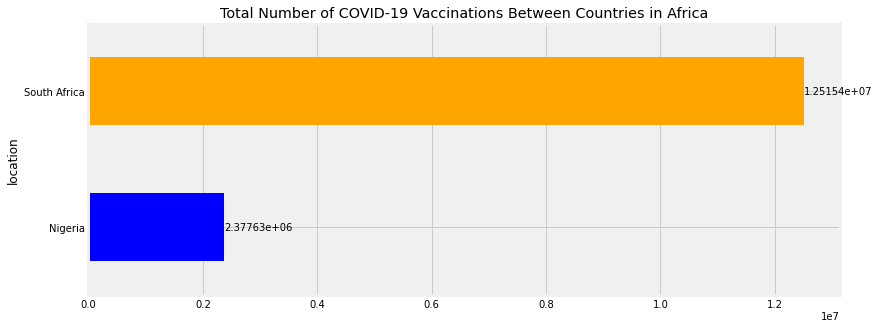

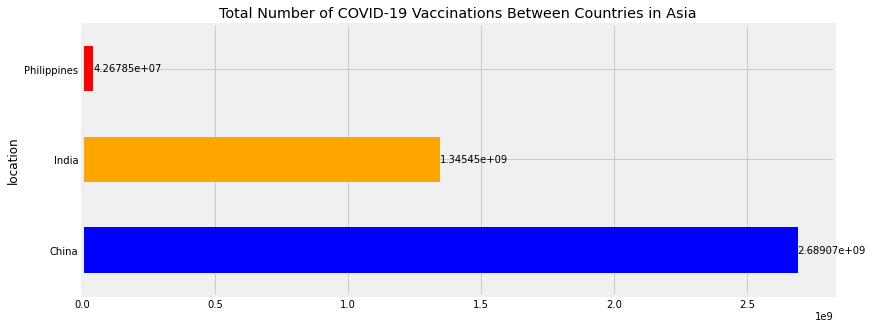

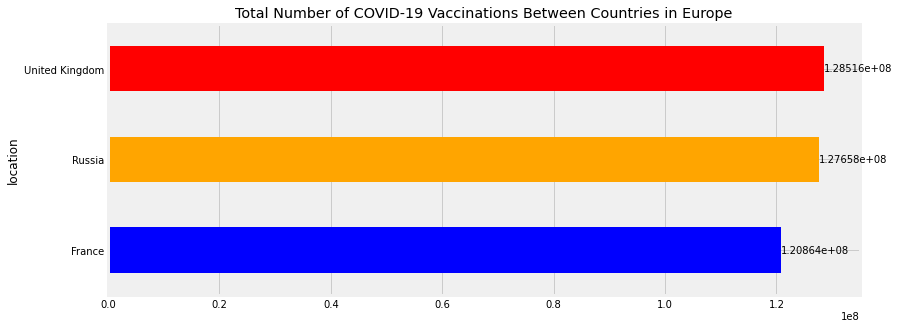

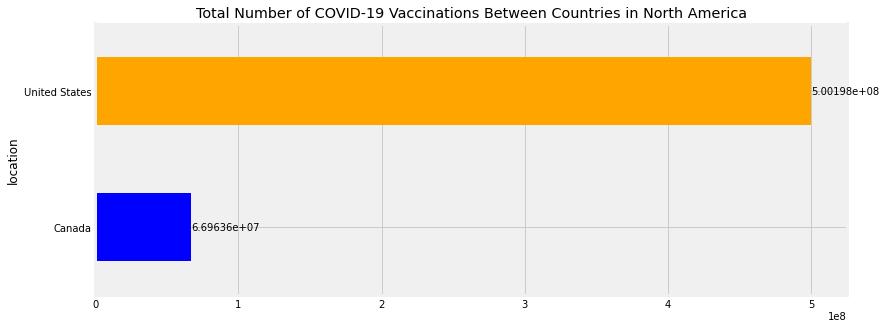

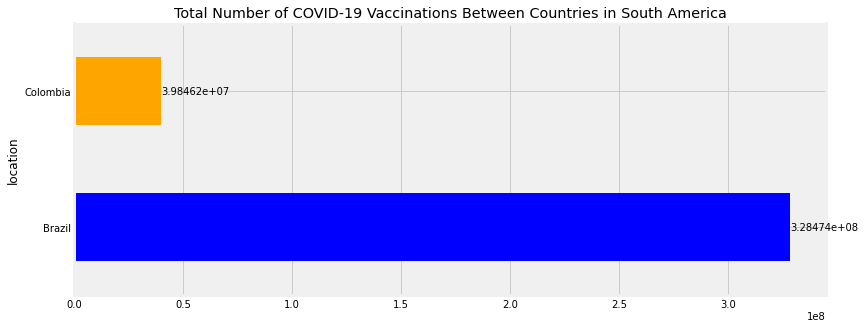

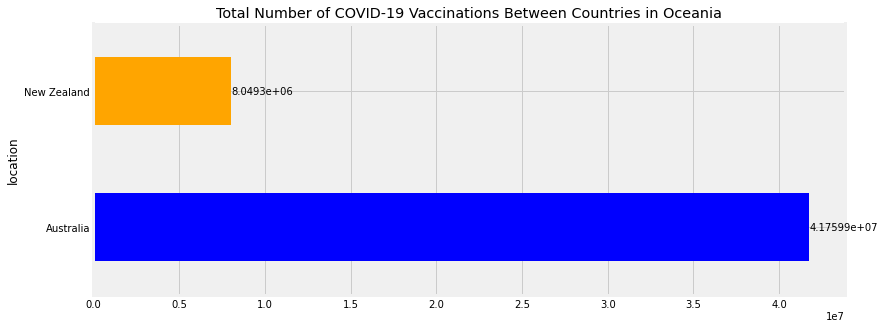

In [167]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_vaccinations"].sum()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of COVID-19 Vaccinations Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Vaccinations")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Countries

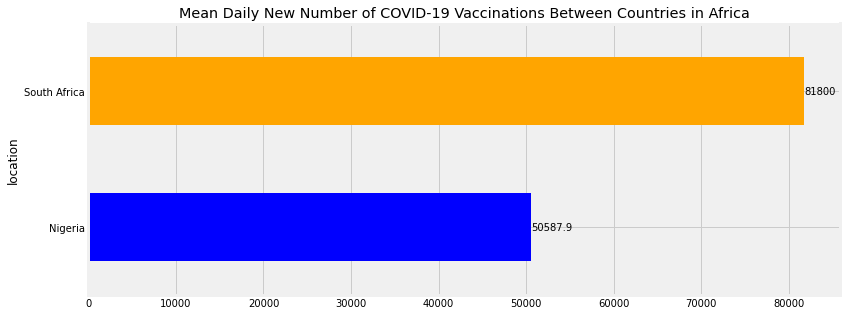

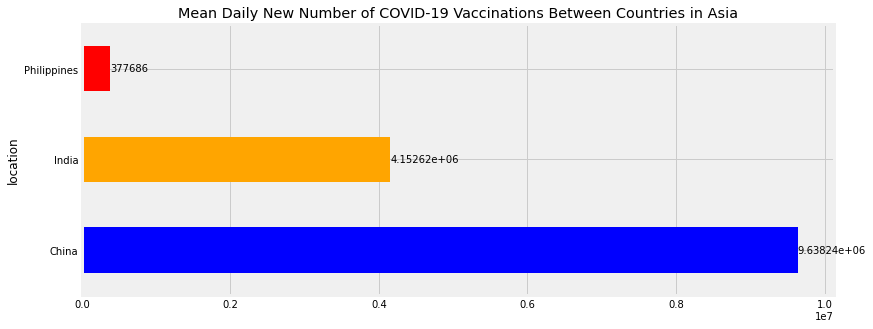

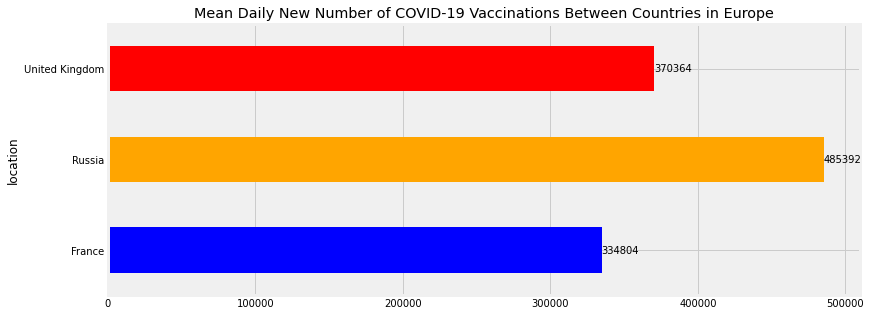

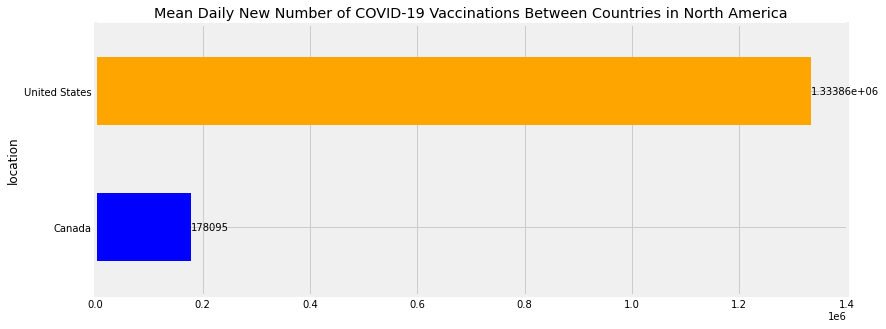

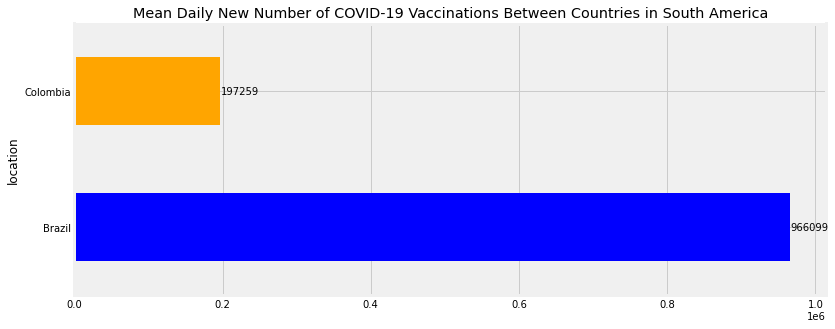

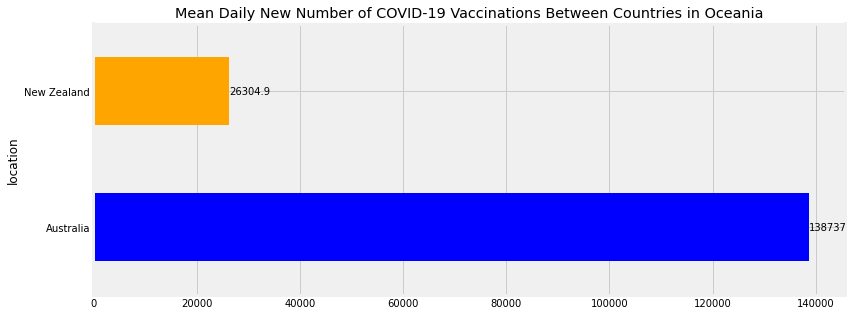

In [168]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_vaccinations"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of COVID-19 Vaccinations Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Vaccinations")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Countries

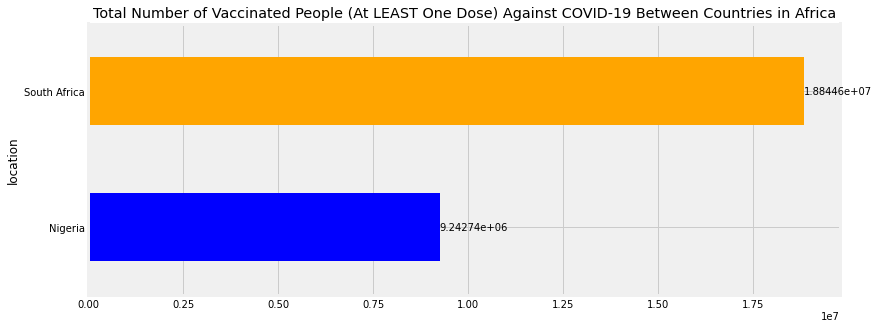

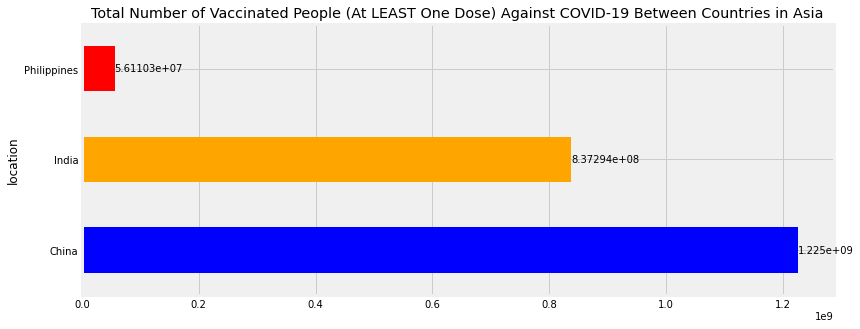

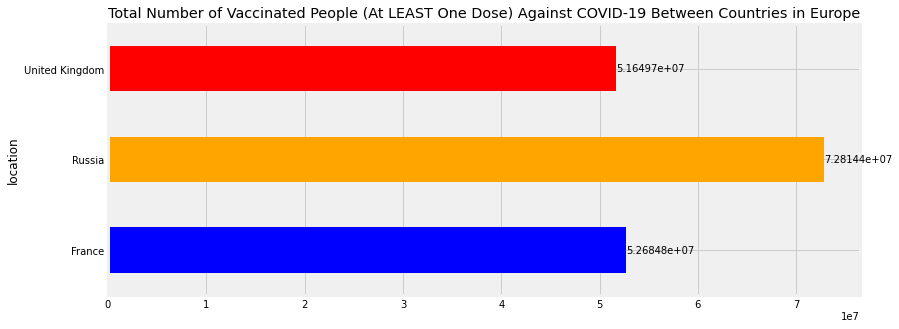

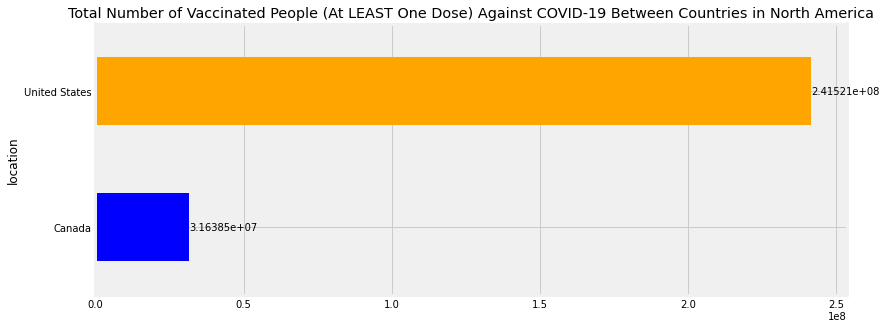

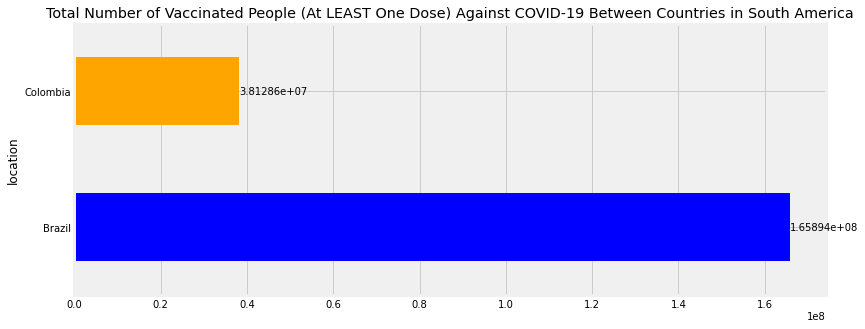

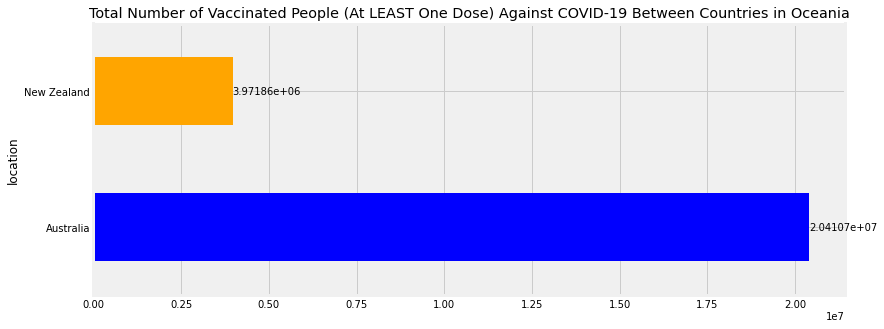

In [169]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_vaccinated"].max()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Countries

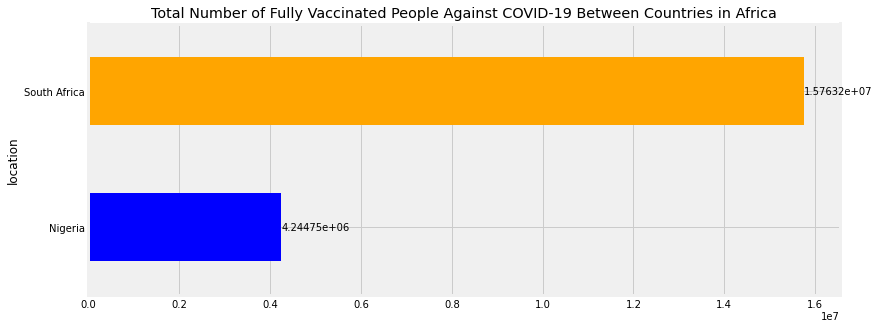

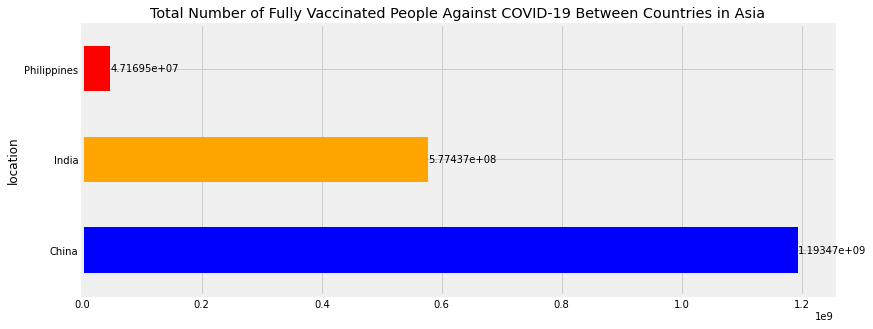

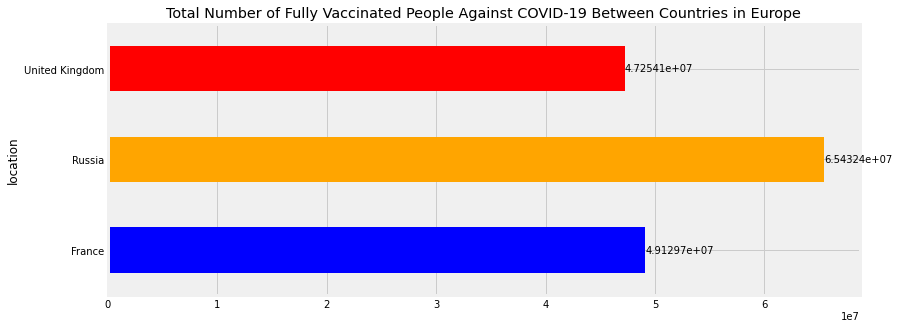

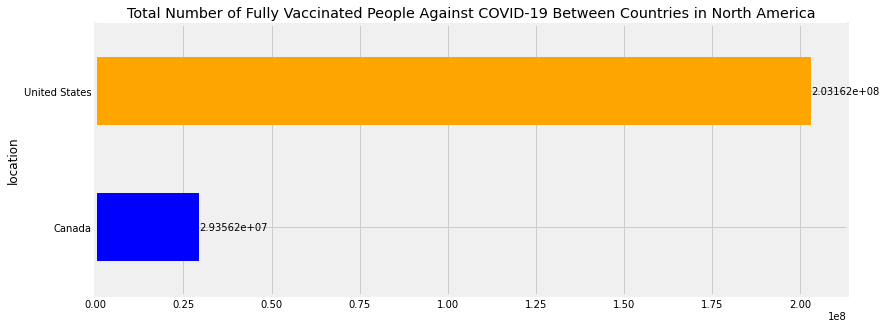

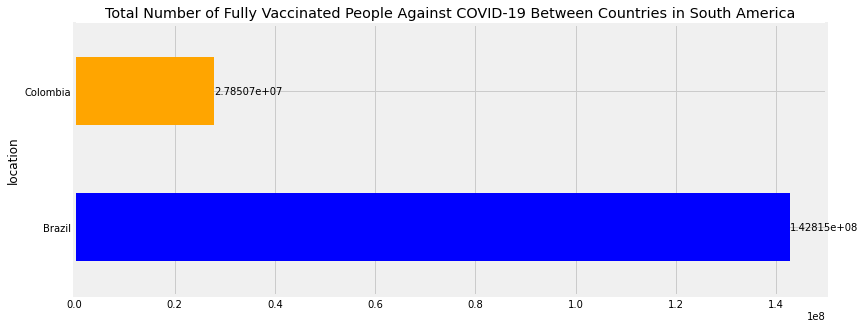

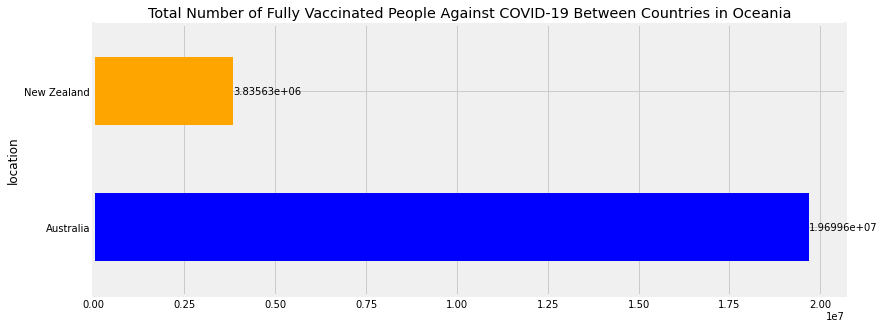

In [170]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_fully_vaccinated"].max()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Fully Vaccinated People Against COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Tests Between Countries

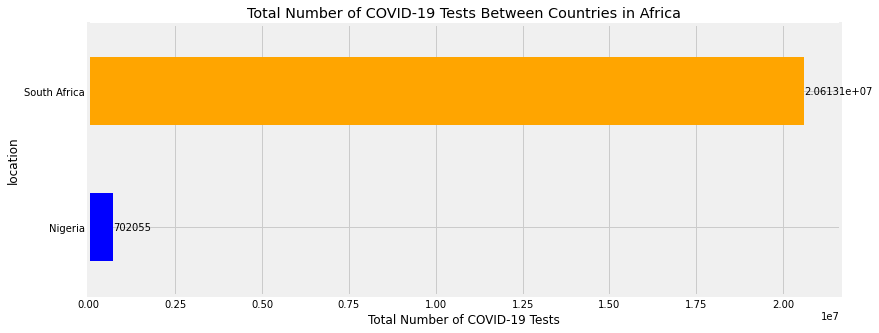

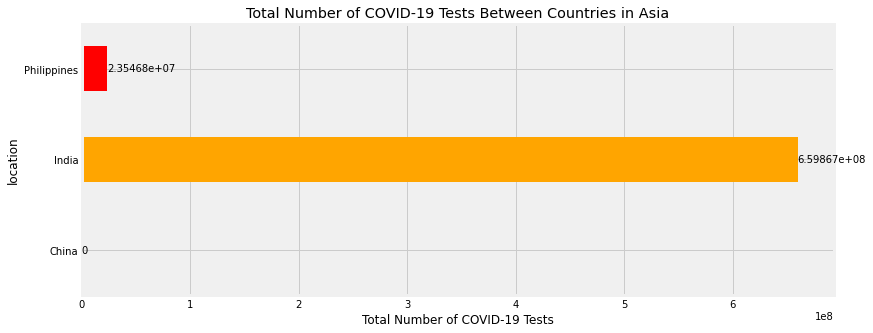

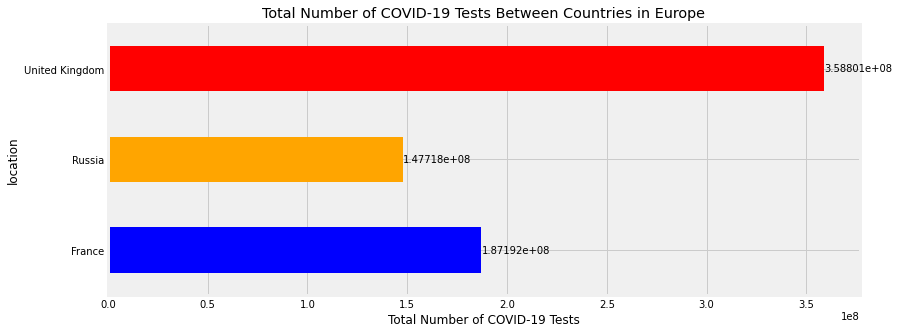

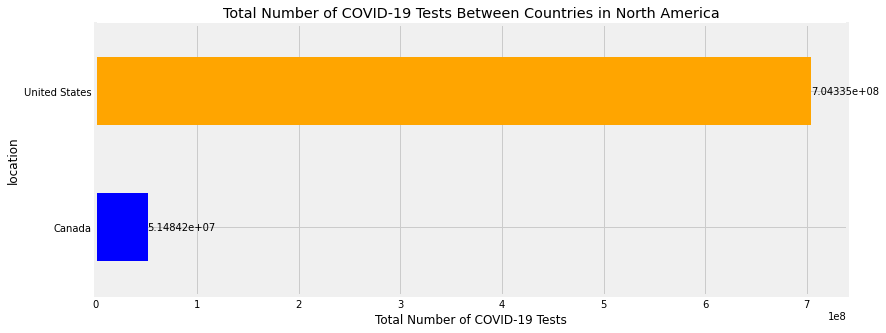

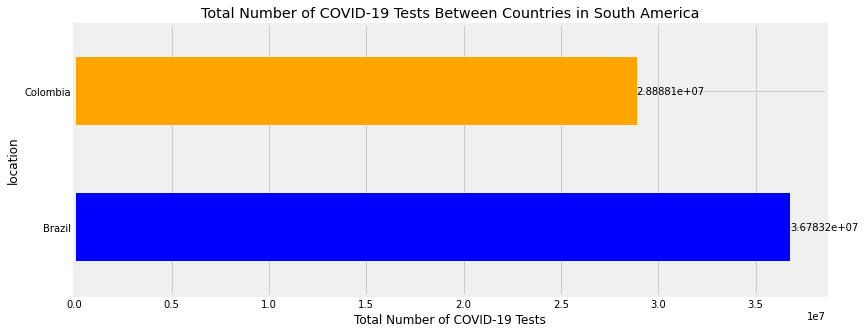

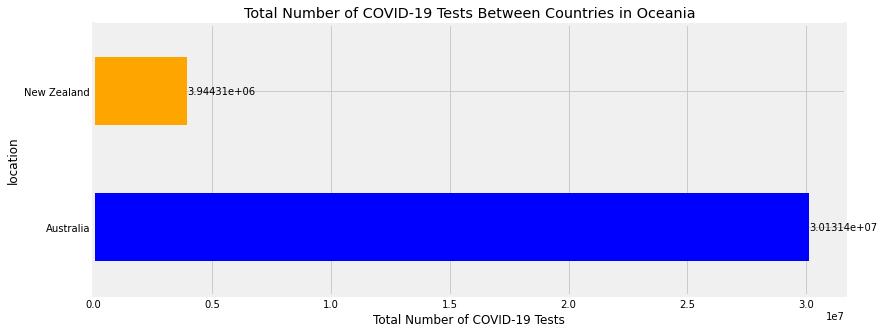

In [171]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_tests"].sum() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of COVID-19 Tests Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Total Number of COVID-19 Tests")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Tests Between Countries

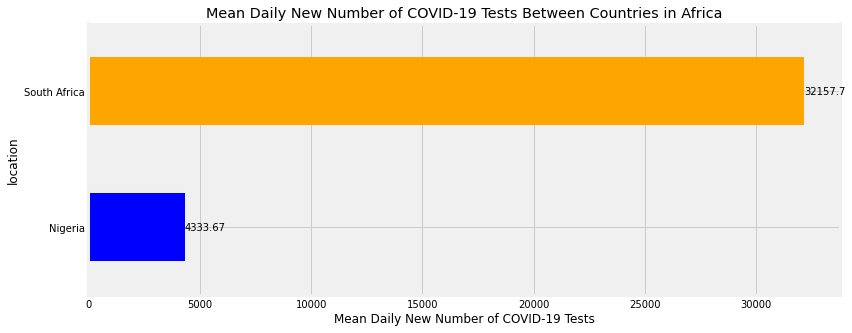

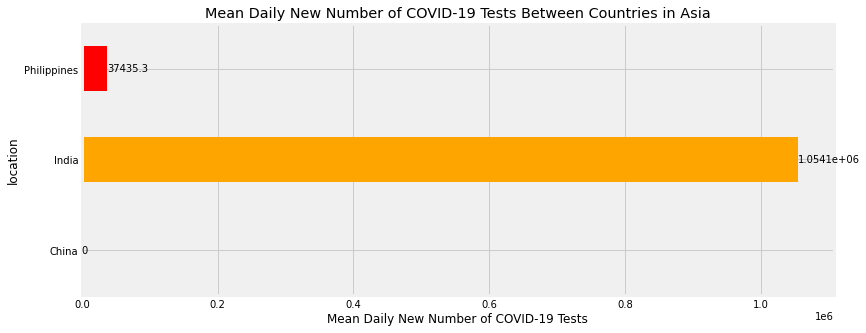

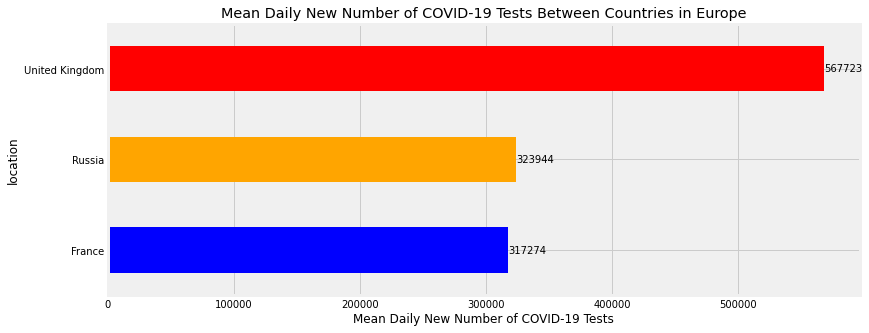

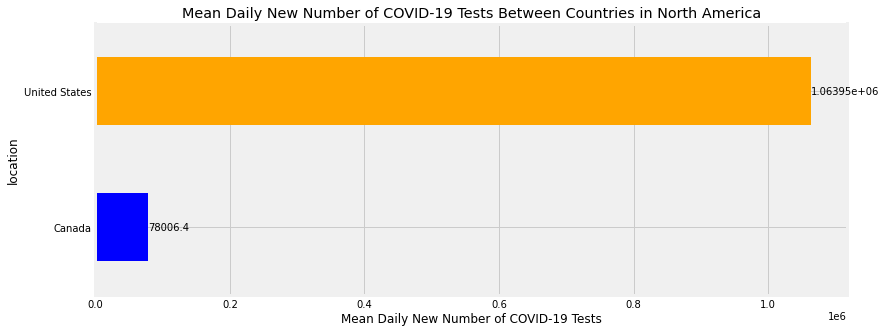

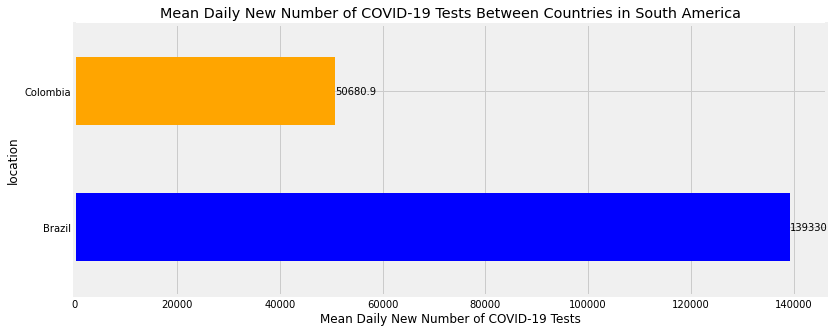

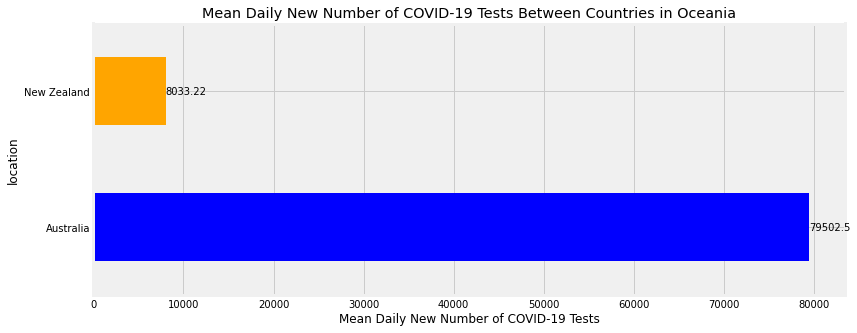

In [172]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_tests"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of COVID-19 Tests Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Mean Daily New Number of COVID-19 Tests")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Percentage of COVID-19 Test Cases that are Positive Between Countries

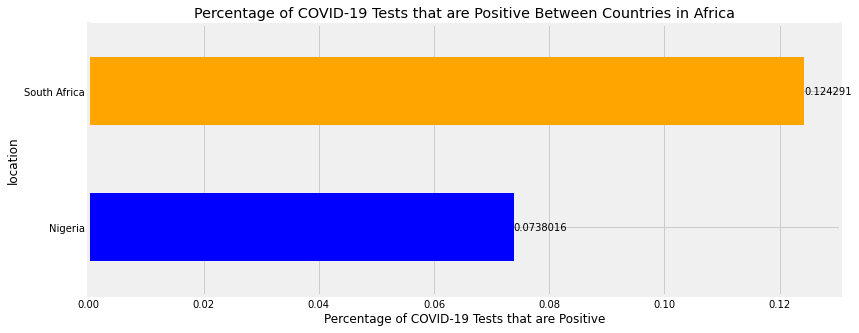

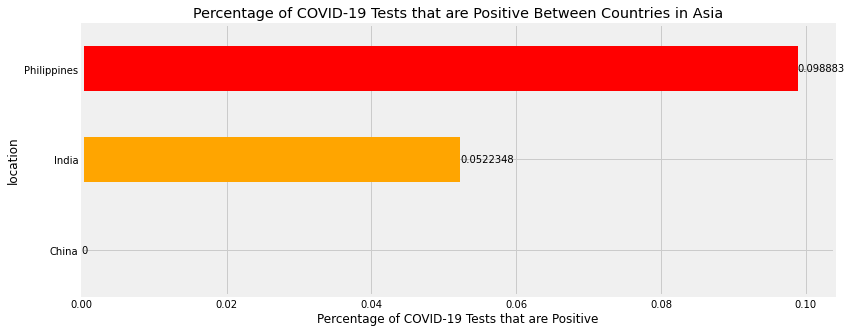

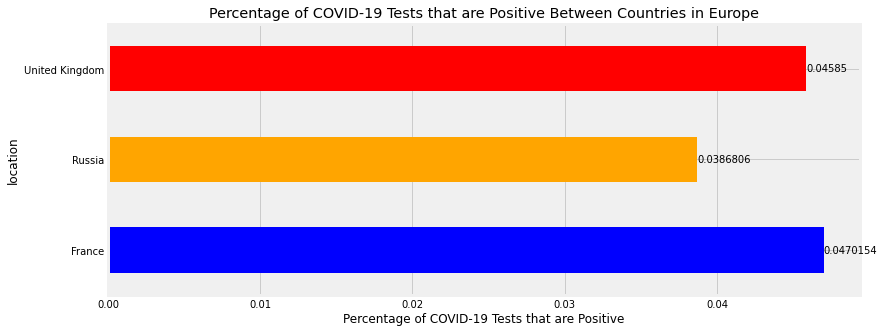

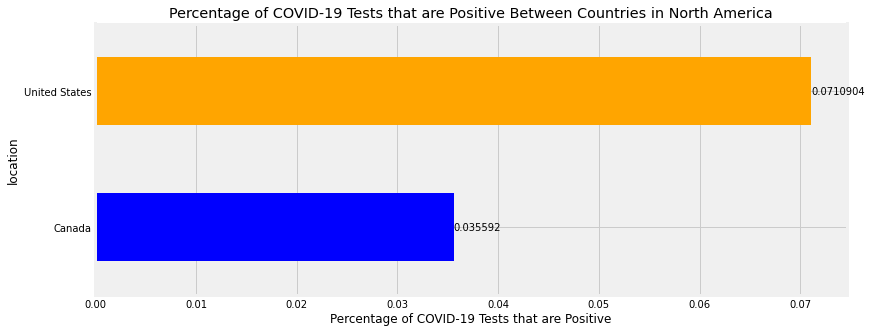

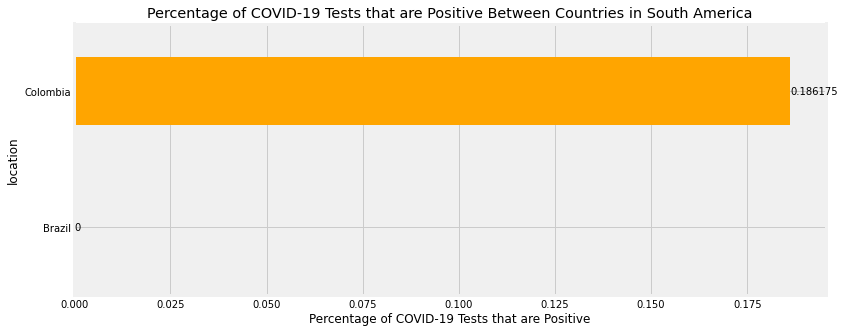

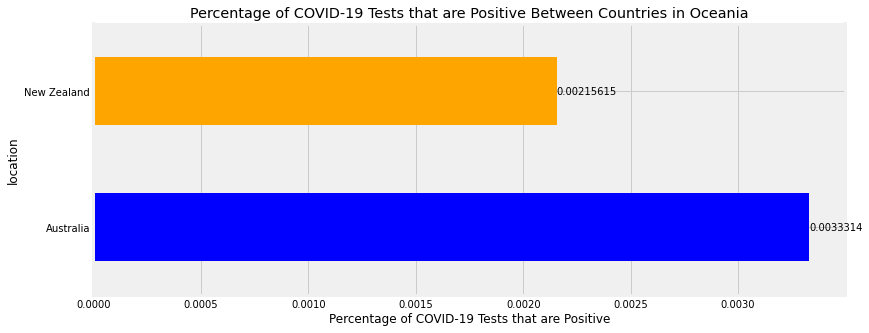

In [173]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["positive_rate"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Percentage of COVID-19 Tests that are Positive Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Percentage of COVID-19 Tests that are Positive")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Tests per New Confirmed Case of COVID-19 Between Countries

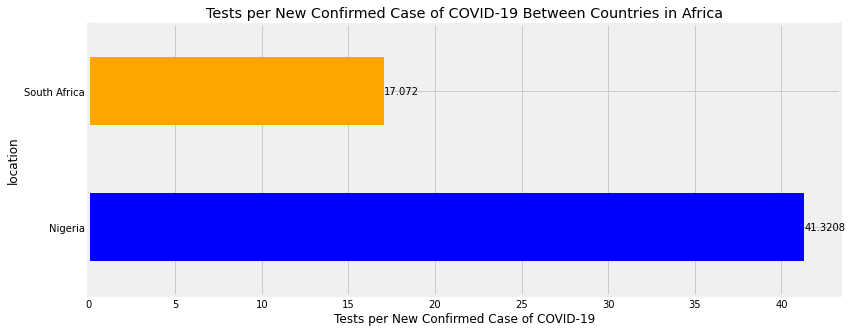

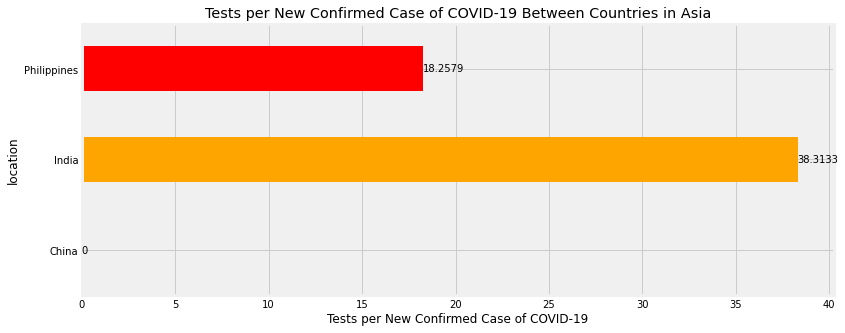

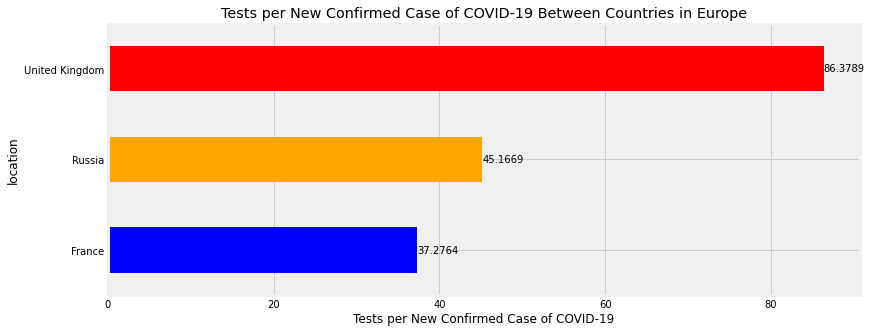

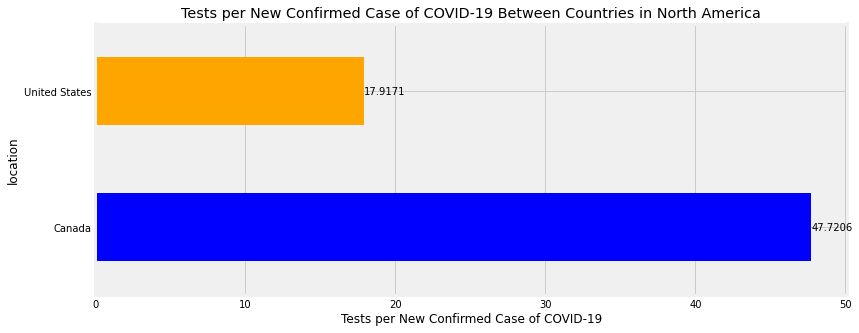

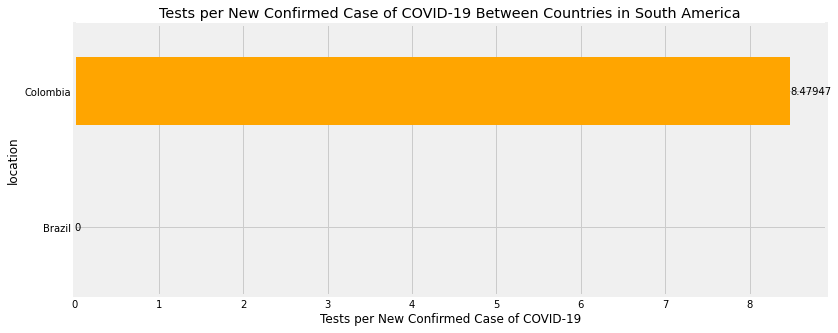

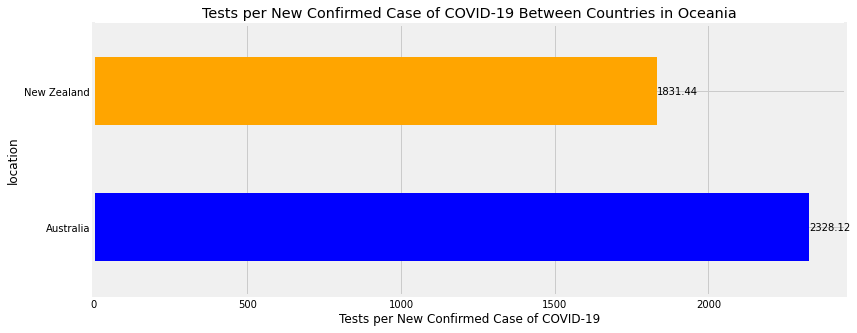

In [174]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["tests_per_case"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Tests per New Confirmed Case of COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Tests per New Confirmed Case of COVID-19")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Policy Responses (Measured by Strictness) due to COVID-19 Between Countries 

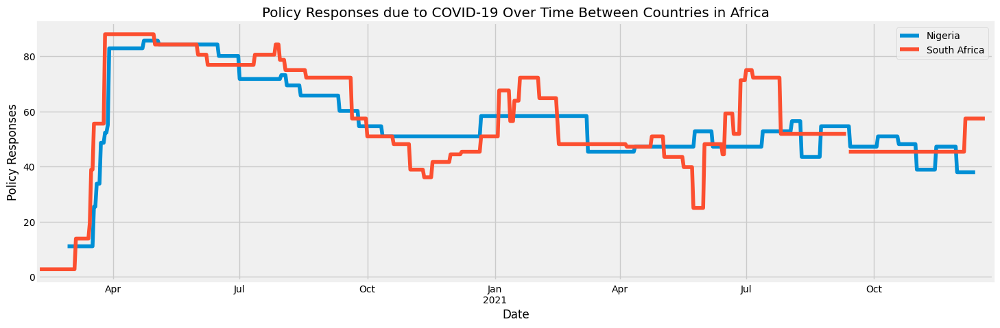

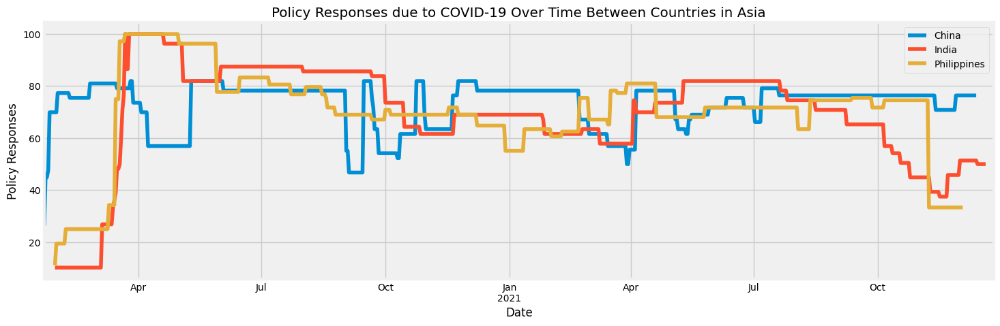

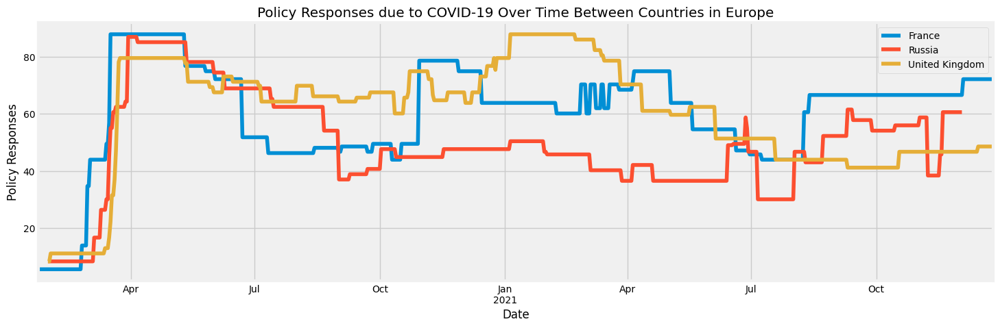

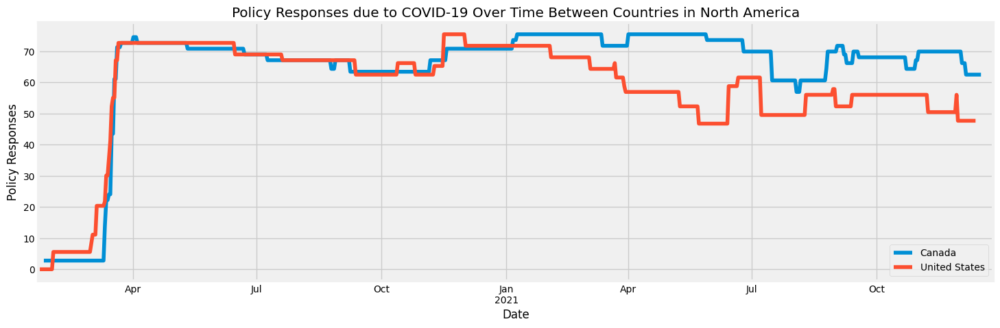

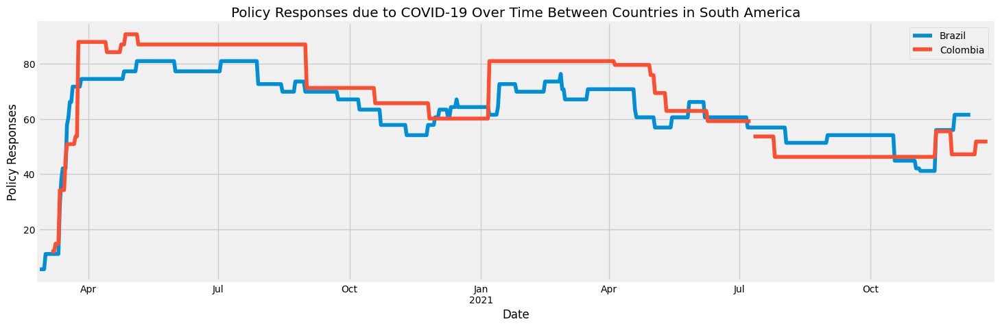

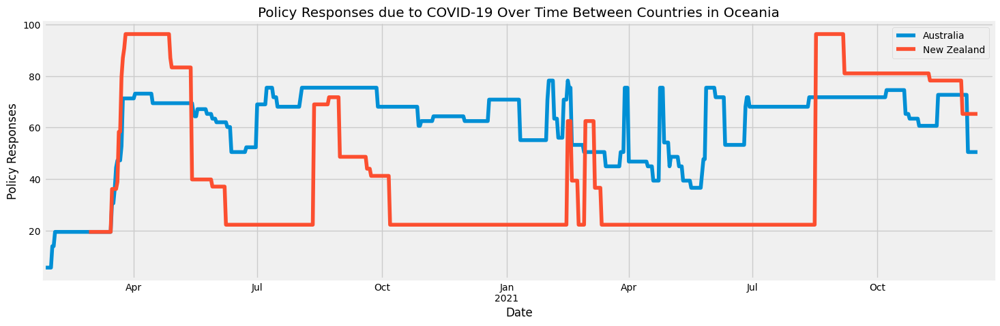

In [175]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['stringency_index'].plot(legend='True')
  title = 'Policy Responses due to COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Policy Responses')
  plt.show()

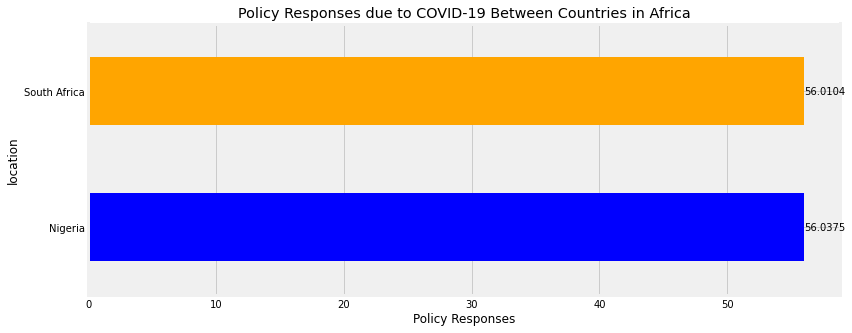

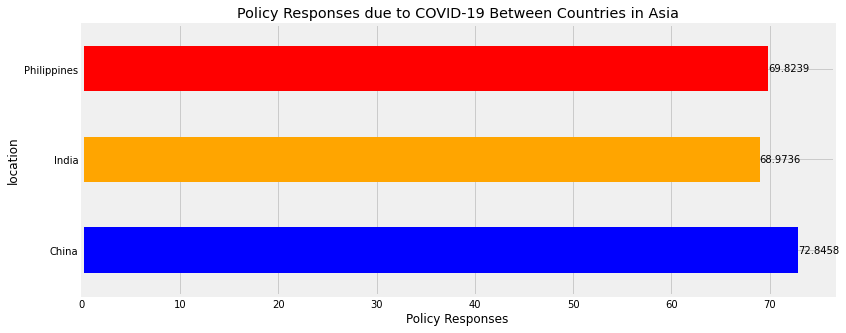

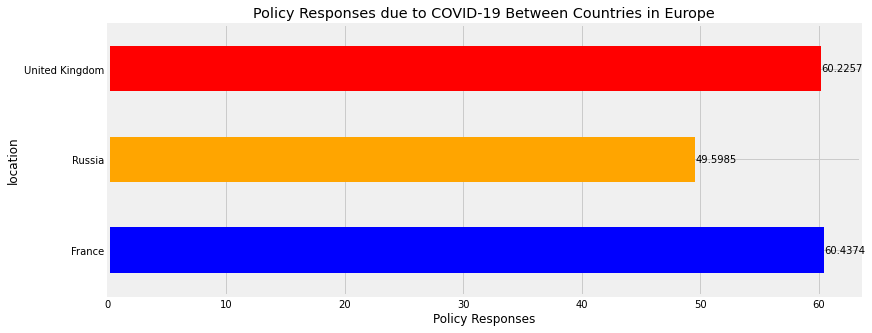

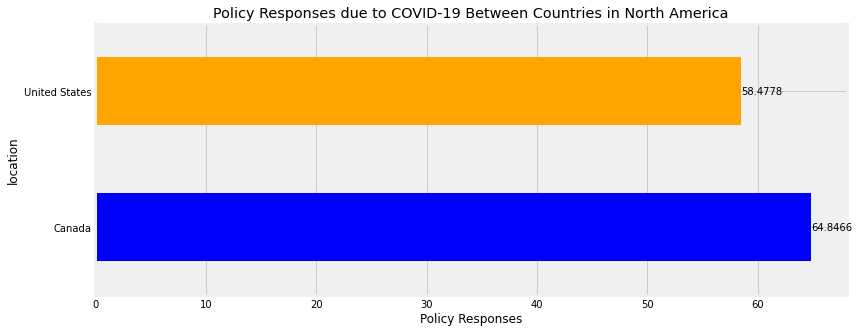

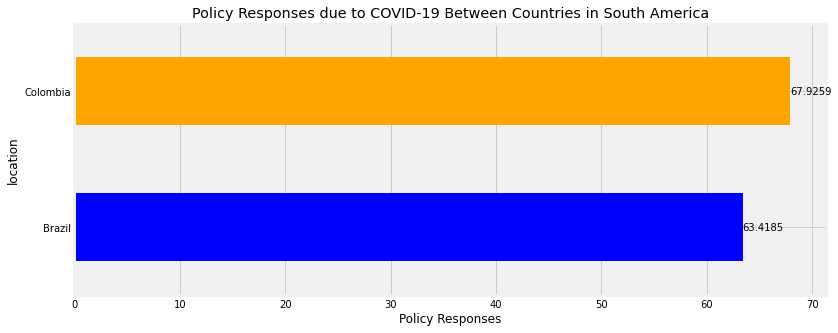

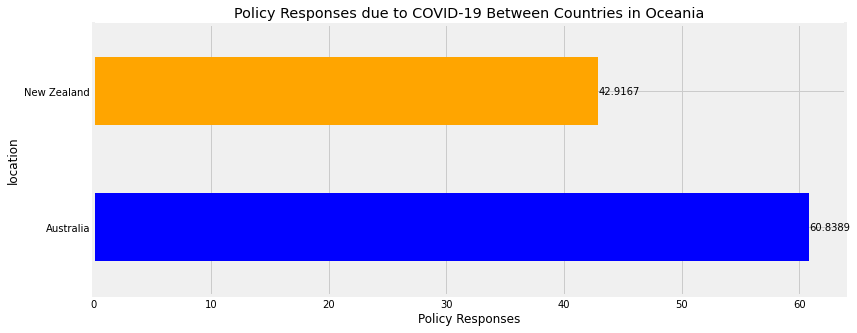

In [176]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["stringency_index"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Policy Responses due to COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Policy Responses")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## ICU Patients due to COVID-19 Between Countries

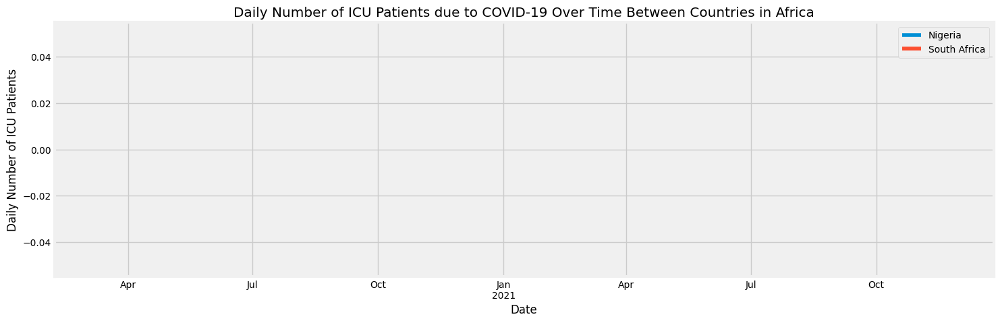

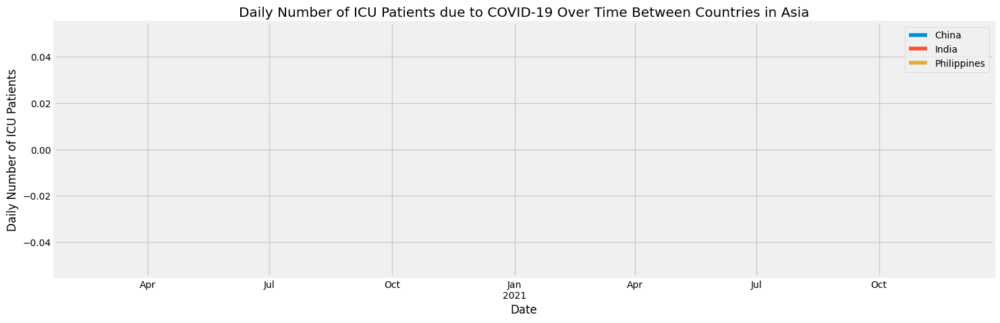

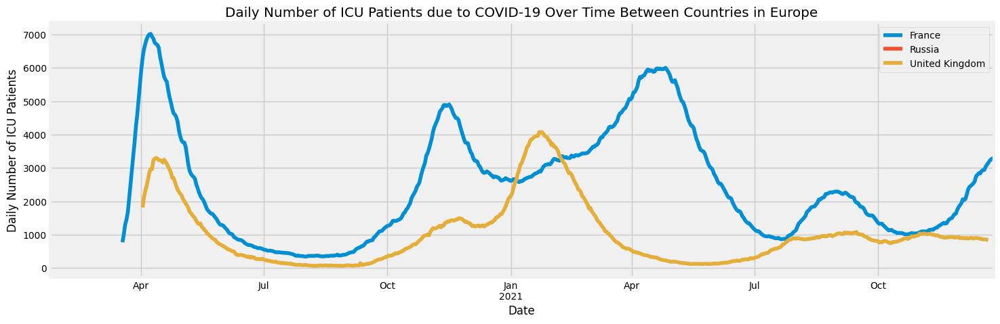

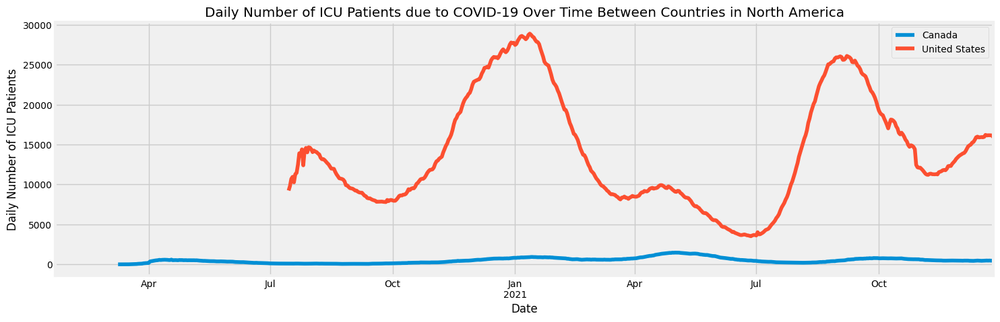

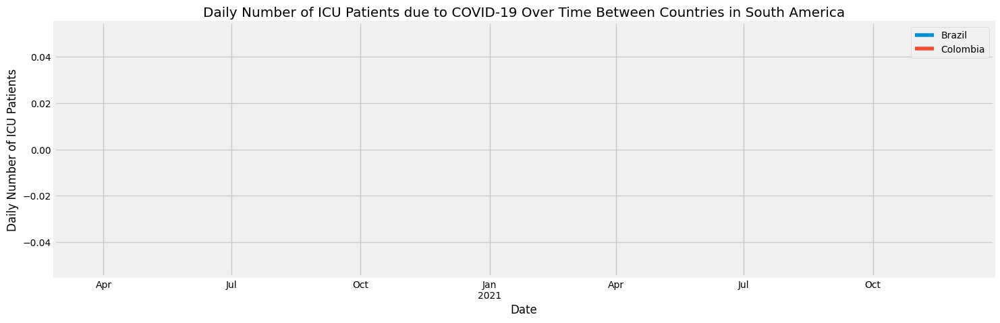

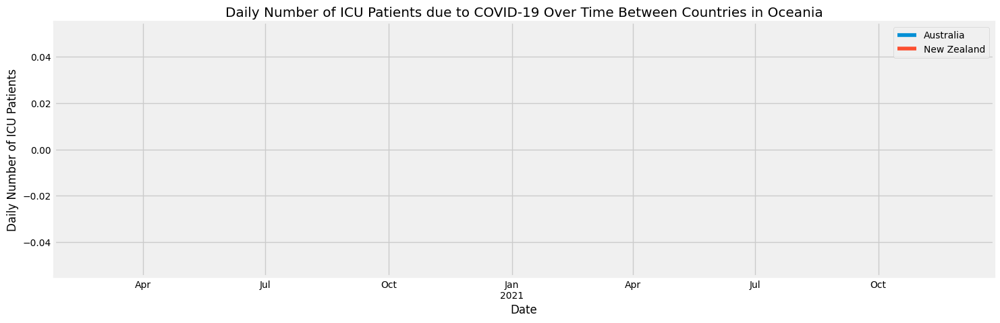

In [182]:
# Note that for some countries no data is reported
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['icu_patients'].plot(legend='True')
  title = 'Daily Number of ICU Patients due to COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of ICU Patients')
  plt.show()

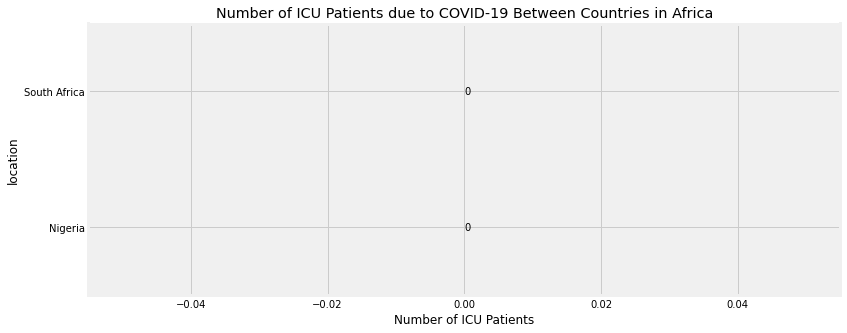

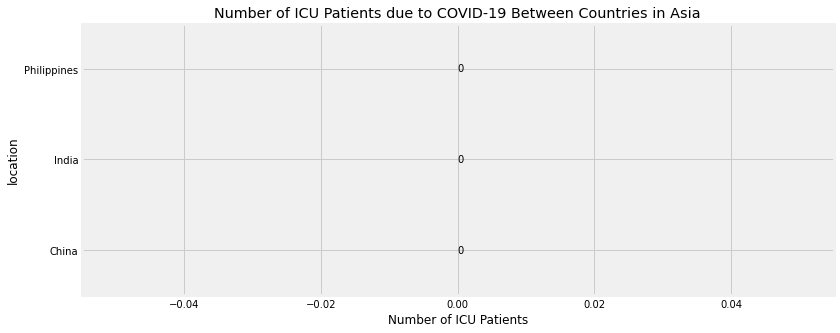

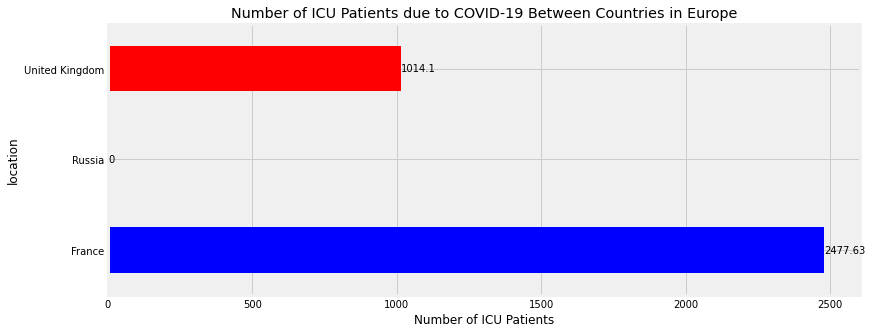

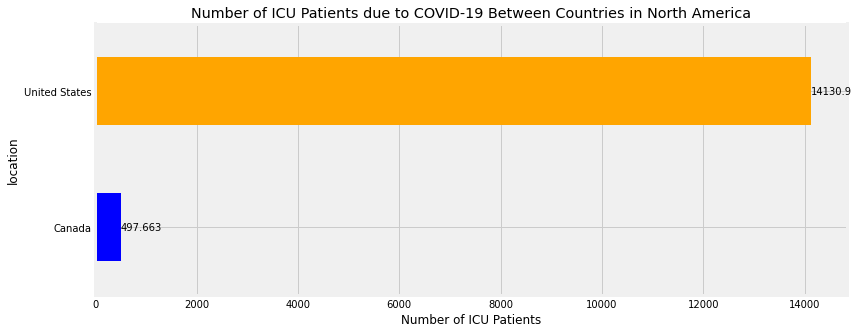

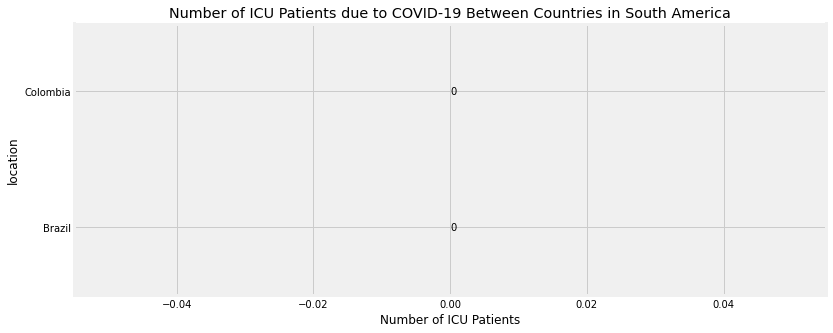

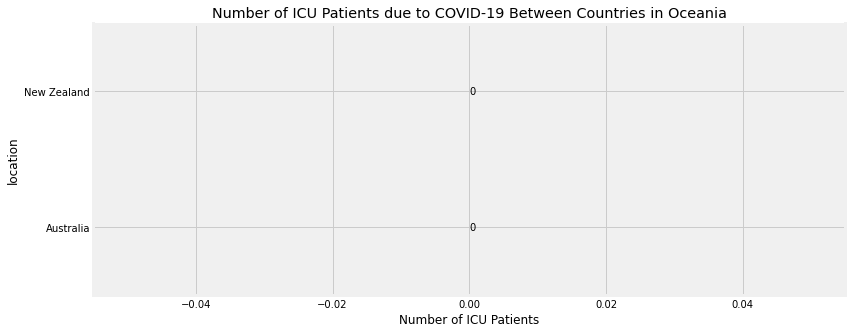

In [180]:
# Note that for some countries no data is reported
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["icu_patients"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Number of ICU Patients due to COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Number of ICU Patients")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Hospital Patients due to COVID-19 Between Countries

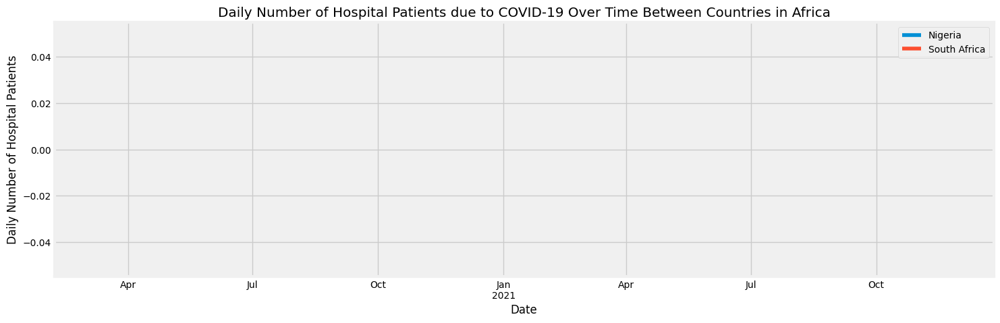

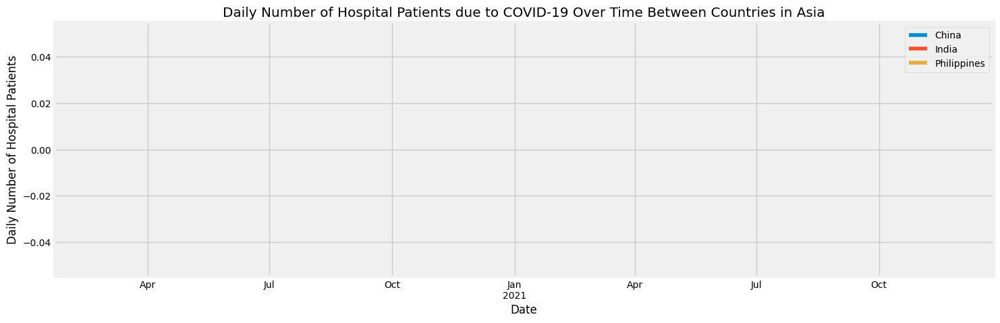

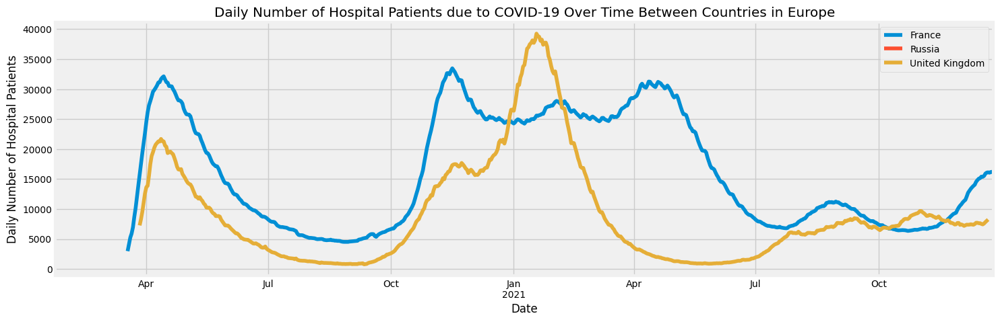

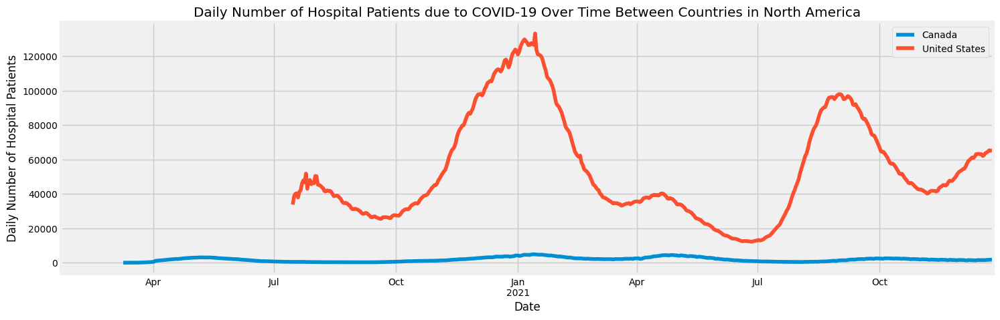

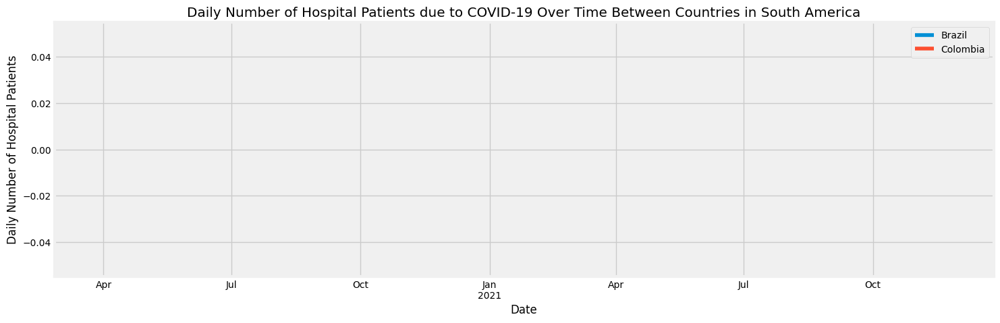

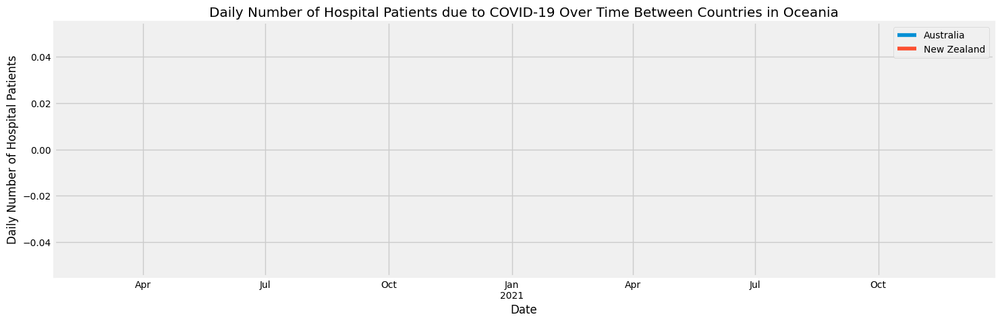

In [183]:
# Note that for some countries no data is reported
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['hosp_patients'].plot(legend='True')
  title = 'Daily Number of Hospital Patients due to COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of Hospital Patients')
  plt.show()

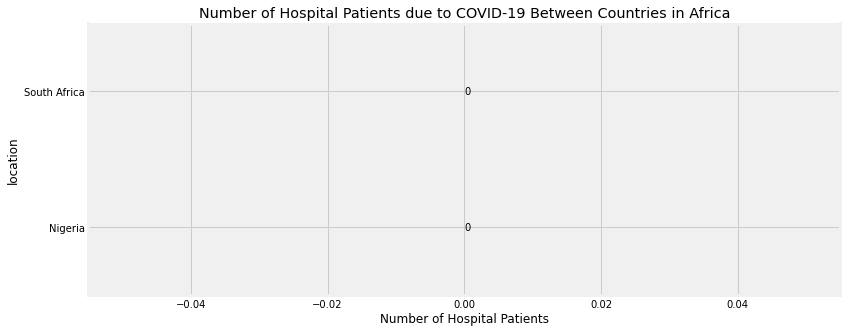

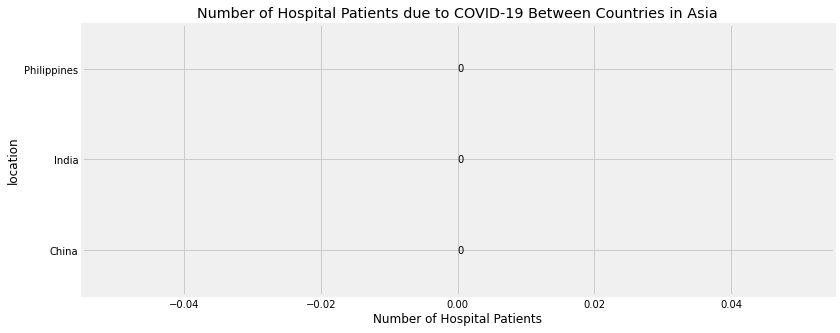

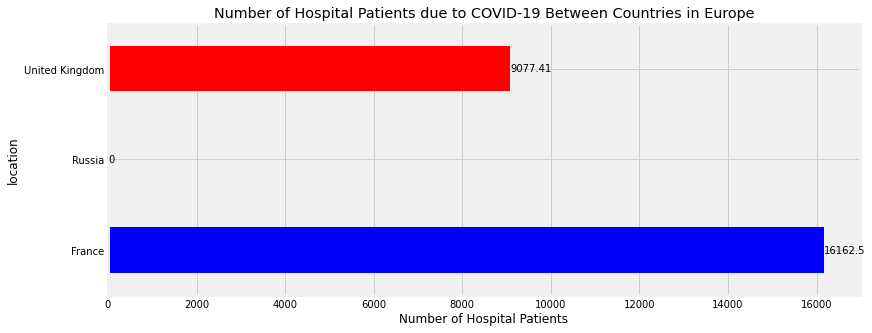

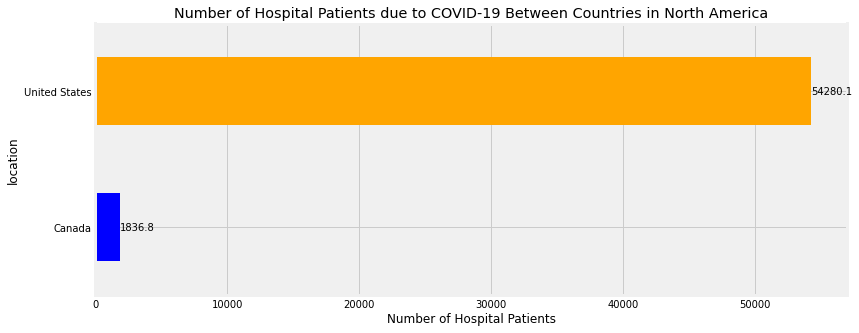

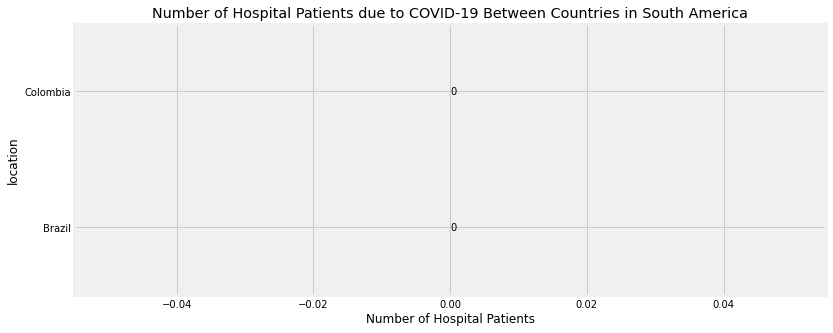

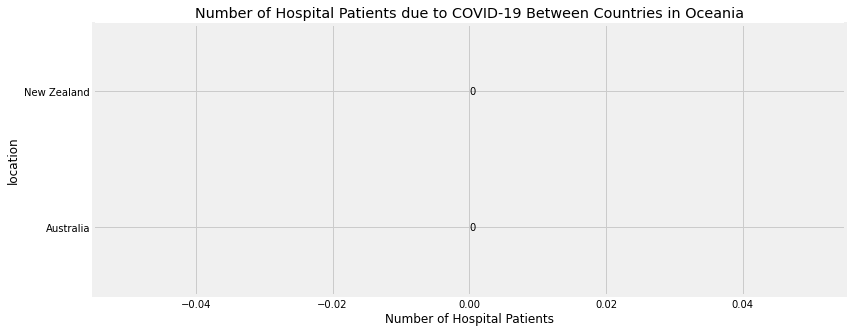

In [184]:
# Note that for some countries no data is reported
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["hosp_patients"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Number of Hospital Patients due to COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Number of Hospital Patients")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Reproduction Rate for COVID-19 Between Countries

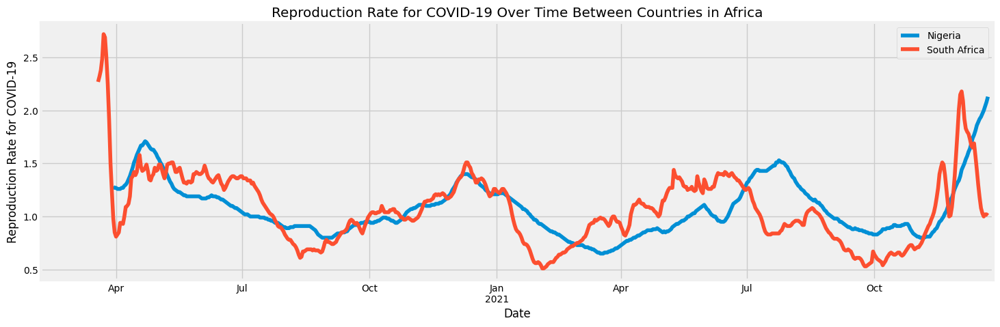

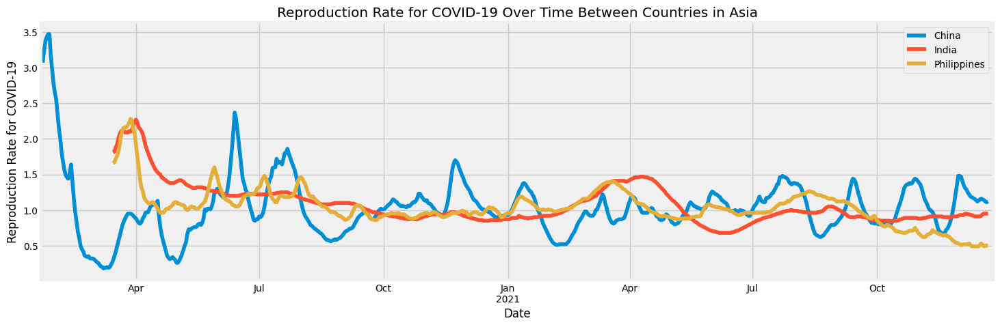

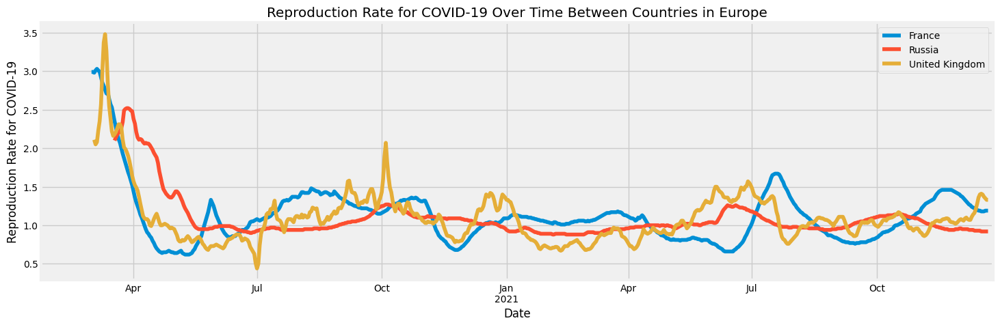

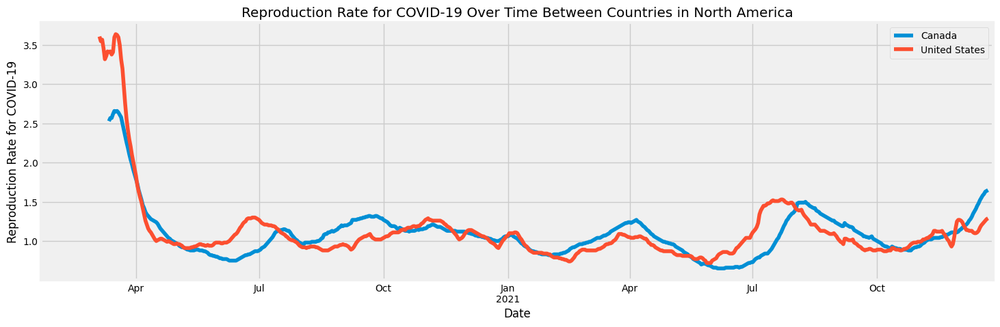

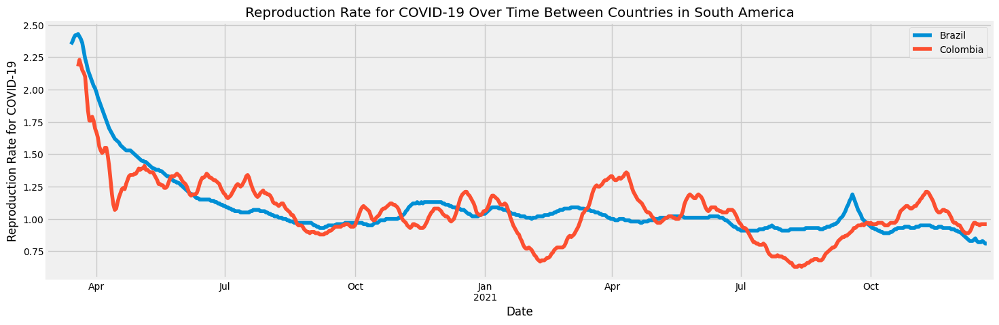

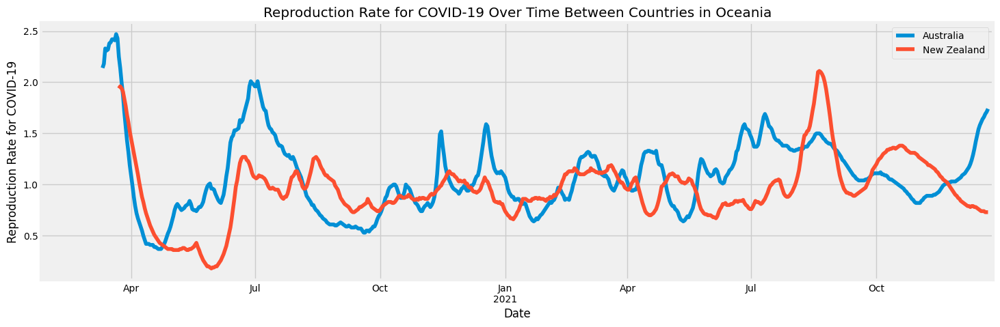

In [177]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['reproduction_rate'].plot(legend='True')
  title = 'Reproduction Rate for COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Reproduction Rate for COVID-19')
  plt.show()

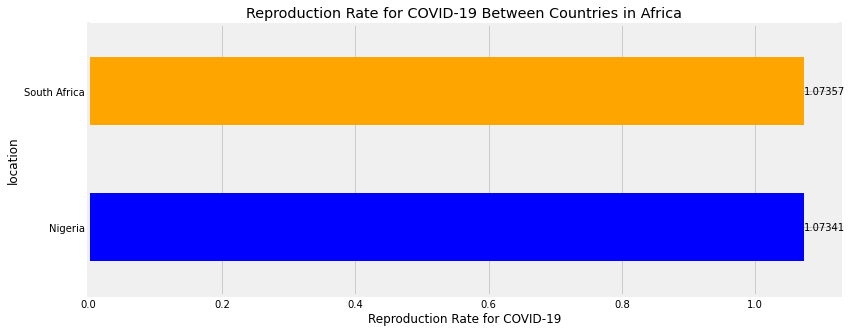

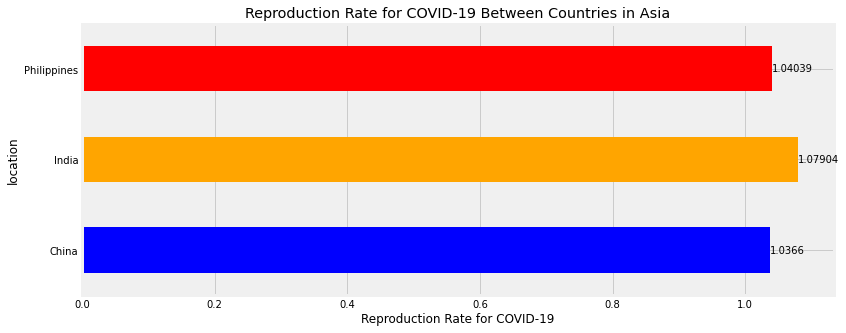

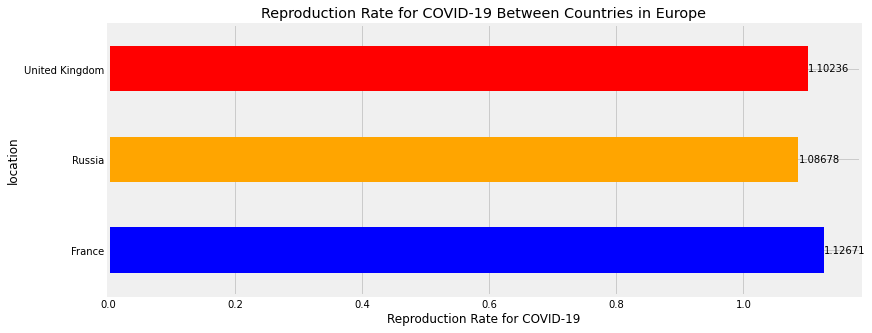

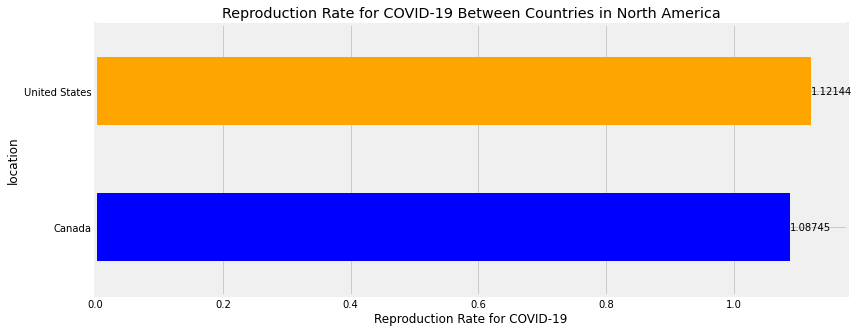

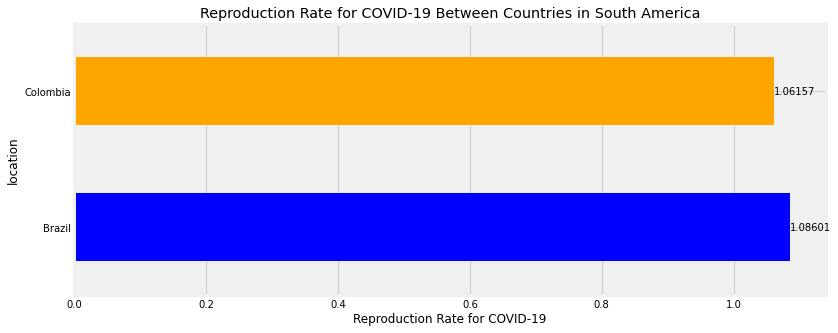

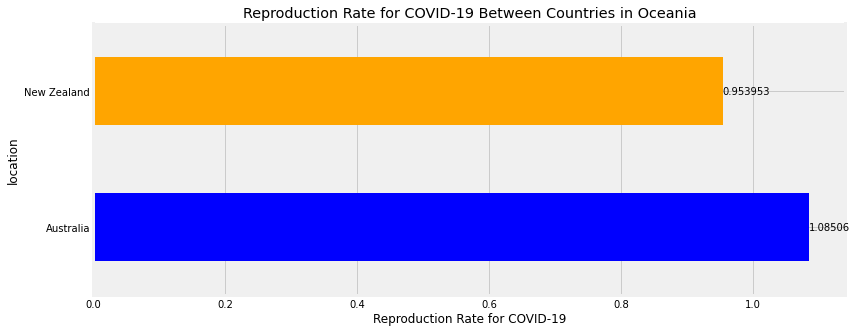

In [178]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["reproduction_rate"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Reproduction Rate for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Reproduction Rate for COVID-19")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

# Income Bracket Data

In [185]:
# Getting data corresponding to Income Brackets around the World
incomes = ['High income', 'Low income', 'Lower middle income', 'Upper middle income']
incomes_covid_data = owid_covid_data[owid_covid_data['location'].isin(incomes)]

In [186]:
# Check first 5 rows of dataframe
incomes_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
59620,OWID_HIC,NaN,High income,2020-01-22,6.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59621,OWID_HIC,NaN,High income,2020-01-23,10.0,4.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59622,OWID_HIC,NaN,High income,2020-01-24,18.0,8.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59623,OWID_HIC,NaN,High income,2020-01-25,22.0,4.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59624,OWID_HIC,NaN,High income,2020-01-26,41.0,19.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
# Check last 5 rows of dataframe
incomes_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
143365,OWID_UMC,NaN,Upper middle income,2021-12-22,85052414.0,112465.0,2244843.0,2157.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.088785e+09,1.929223e+09,1.798520e+09,197334698.0,17352403.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143366,OWID_UMC,NaN,Upper middle income,2021-12-23,85172194.0,119780.0,2247137.0,2294.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.107127e+09,1.930060e+09,1.800340e+09,199916974.0,18341813.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143367,OWID_UMC,NaN,Upper middle income,2021-12-24,85289977.0,117783.0,2249276.0,2139.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.122435e+09,1.930415e+09,1.801006e+09,201087690.0,15308253.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143368,OWID_UMC,NaN,Upper middle income,2021-12-25,85374713.0,84736.0,2250850.0,1574.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.135766e+09,1.930689e+09,1.801402e+09,201532853.0,13331056.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
143369,OWID_UMC,NaN,Upper middle income,2021-12-26,85480046.0,105333.0,2252565.0,1715.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.147657e+09,1.930732e+09,1.801462e+09,201883691.0,11890652.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [188]:
# Shape of incomes_covid_data
incomes_covid_data.shape

(2788, 43)

In [189]:
# Number of Null Values in Each Column
incomes_covid_data.isnull().sum()

iso_code                                      0
continent                                  2788
location                                      0
date                                          0
total_cases                                   2
new_cases                                     0
total_deaths                                 43
new_deaths                                    0
reproduction_rate                          2788
icu_patients                               2788
hosp_patients                              2788
weekly_icu_admissions                      2788
weekly_hosp_admissions                     2788
new_tests                                  2788
total_tests                                2788
positive_rate                              2788
tests_per_case                             2788
tests_units                                2788
total_vaccinations                         1386
people_vaccinated                          1386
people_fully_vaccinated                 

In [190]:
# Check to see unique Income Brackets
incomes_covid_data['location'].unique()

array(['High income', 'Low income', 'Lower middle income',
       'Upper middle income'], dtype=object)

In [191]:
# Set Index to Date
incomes_covid_data.set_index('date', inplace=True)

## Population Between Income Types

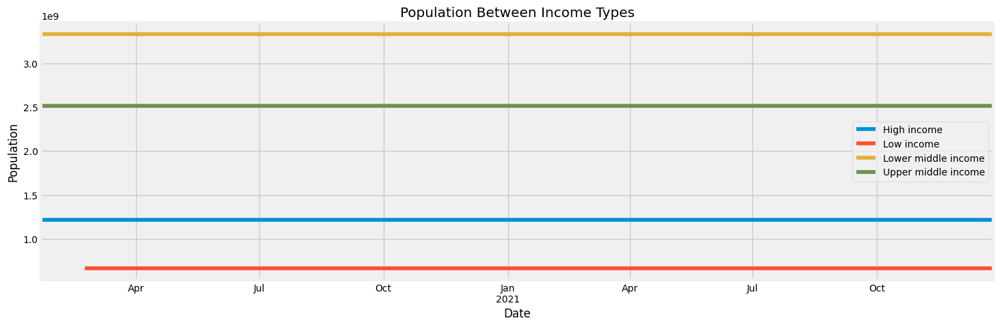

In [192]:
# Note that Population Between Income Brackets Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['population'].plot(legend='True')
title = 'Population Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [193]:
group = incomes_covid_data.groupby("location")["population"].max()
print("Population Between Income Types")
print("                   ")
group

Population Between Income Types
                   


location
High income            1.214930e+09
Low income             6.651490e+08
Lower middle income    3.330653e+09
Upper middle income    2.513673e+09
Name: population, dtype: float64

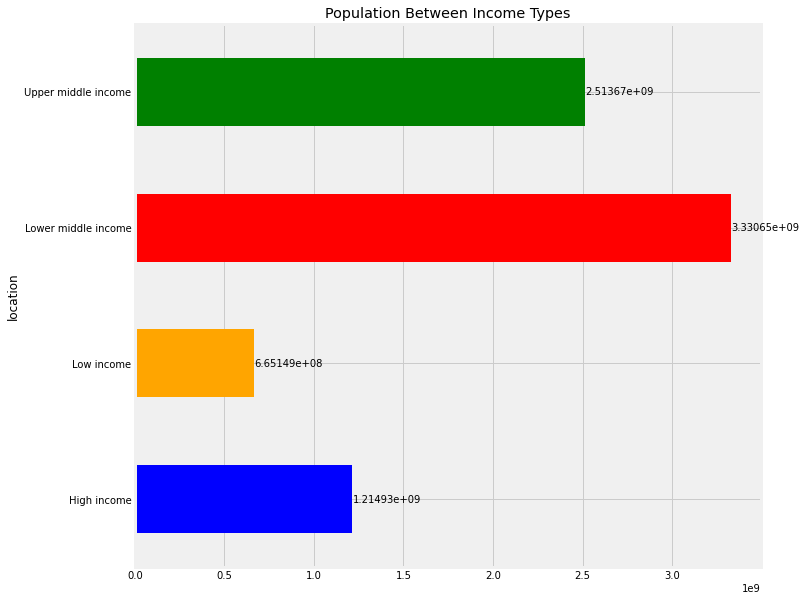

In [194]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Population Between Income Types")
plt.ylabel("Population")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Income Types

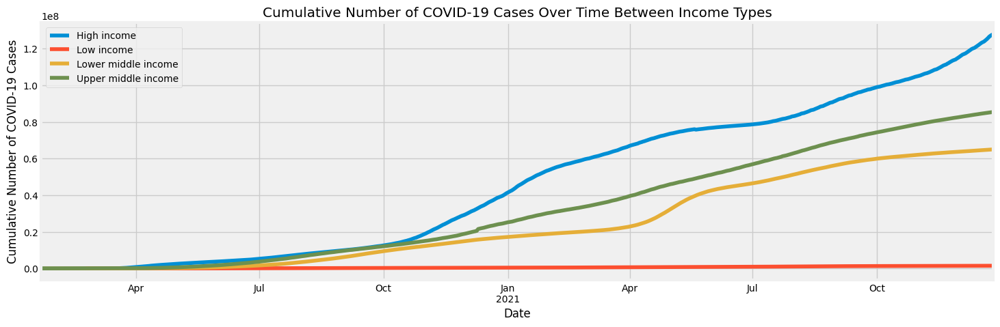

In [195]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_cases'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
plt.show()

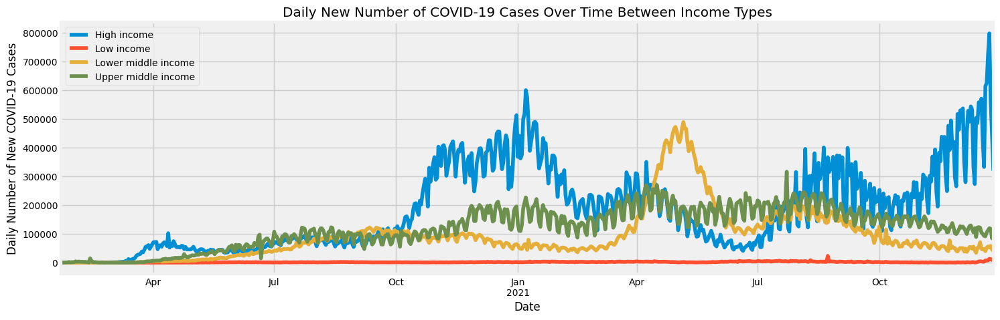

In [196]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_cases'].plot(legend='True')
title = 'Daily New Number of COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Income Types

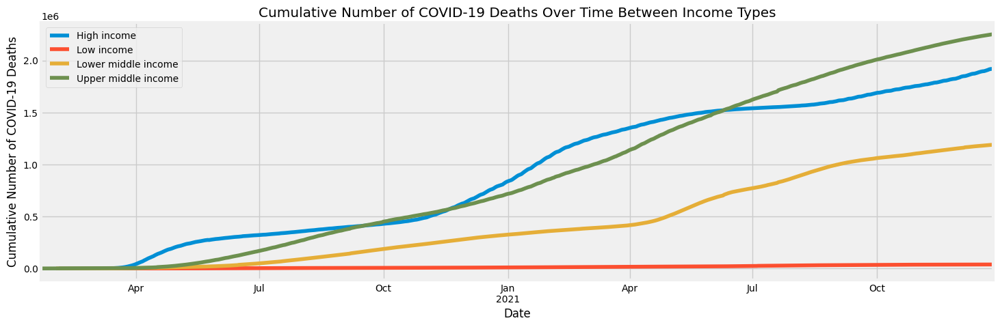

In [197]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_deaths'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Deaths Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
plt.show()

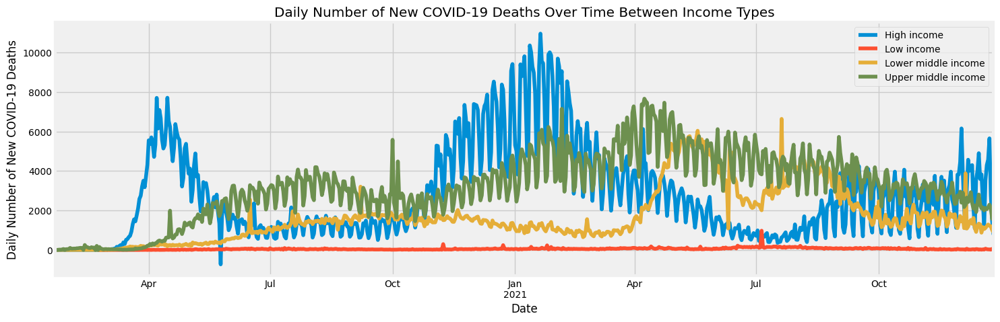

In [198]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_deaths'].plot(legend='True')
title = 'Daily Number of New COVID-19 Deaths Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Over Time Between Income Types

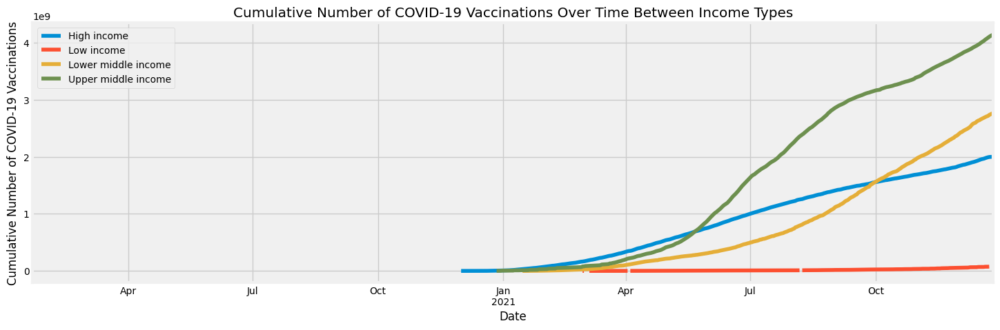

In [199]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_vaccinations'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
plt.show()

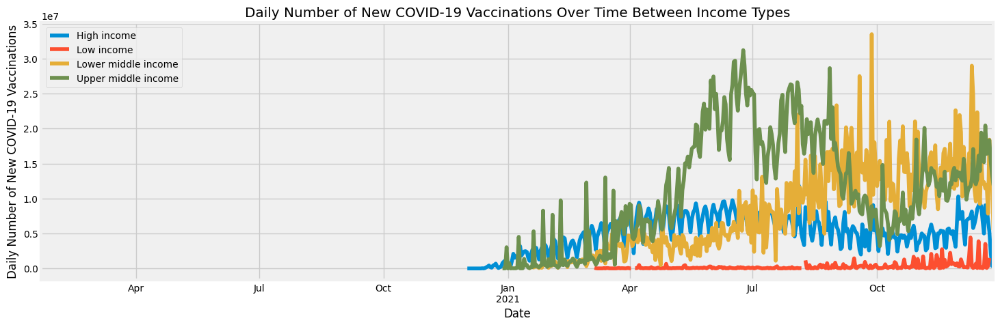

In [200]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_vaccinations'].plot(legend='True')
title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Between Income Types

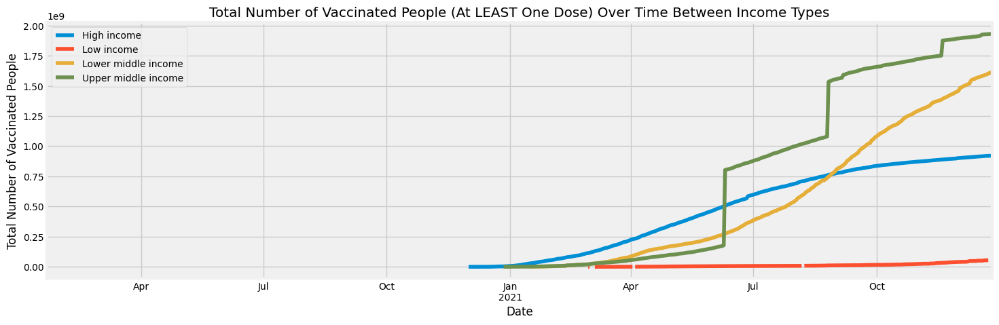

In [201]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['people_vaccinated'].plot(legend='True')
title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Vaccinated People')
plt.show()

## Total Number of FULLY Vaccinated People Between Income Types

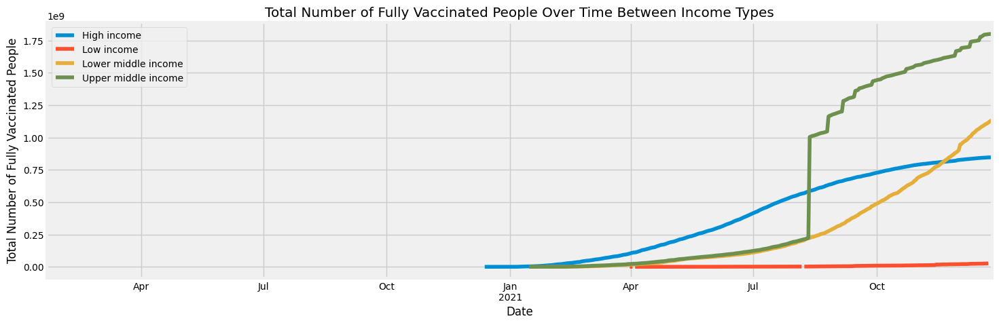

In [202]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['people_fully_vaccinated'].plot(legend='True')
title = 'Total Number of Fully Vaccinated People Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Income Types

In [203]:
group = incomes_covid_data.groupby("location")["new_cases"].sum() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Between Income Types")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Between Income Types
                   


location
High income            0.105673
Low income             0.002233
Lower middle income    0.019522
Upper middle income    0.033621
dtype: float64

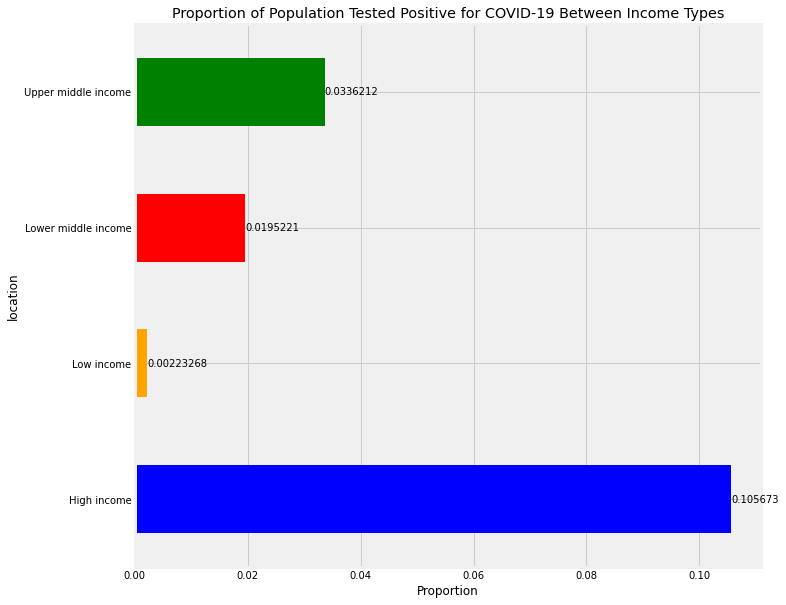

In [204]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population Tested Positive for COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [205]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Between Income Types")
print("                   ")
group

Proportion of Population that Died from COVID-19 Between Income Types
                   


location
High income            0.001580
Low income             0.000057
Lower middle income    0.000355
Upper middle income    0.000889
dtype: float64

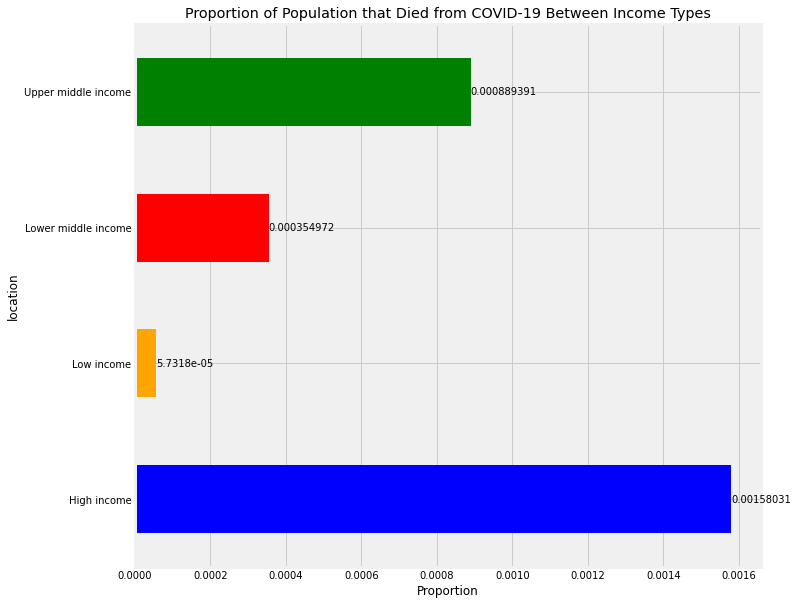

In [206]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population that Died from COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Income Types

In [207]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum() / incomes_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Between Income Types")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Between Income Types
                   


location
High income            0.014955
Low income             0.025672
Lower middle income    0.018183
Upper middle income    0.026453
dtype: float64

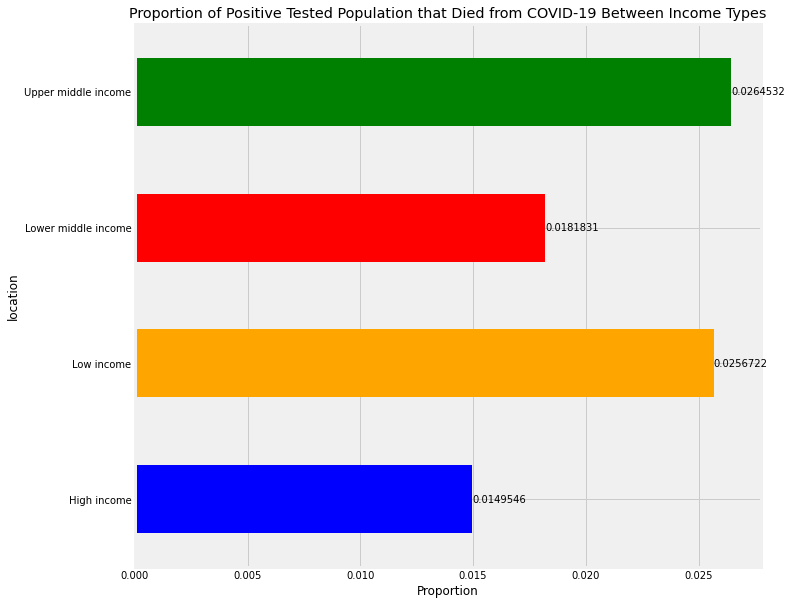

In [208]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Positive Tested Population that Died from COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Income Types


In [209]:
group = incomes_covid_data.groupby("location")["people_vaccinated"].max() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types
                   


location
High income            0.757683
Low income             0.082626
Lower middle income    0.483828
Upper middle income    0.768092
dtype: float64

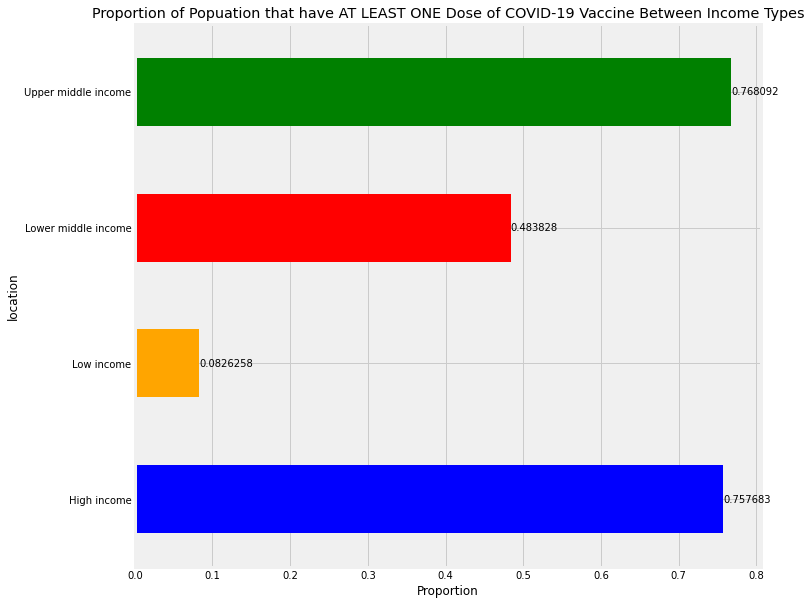

In [210]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [211]:
group = incomes_covid_data.groupby("location")["people_fully_vaccinated"].max() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Between Income Types")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Between Income Types
                   


location
High income            0.696901
Low income             0.039818
Lower middle income    0.340640
Upper middle income    0.716665
dtype: float64

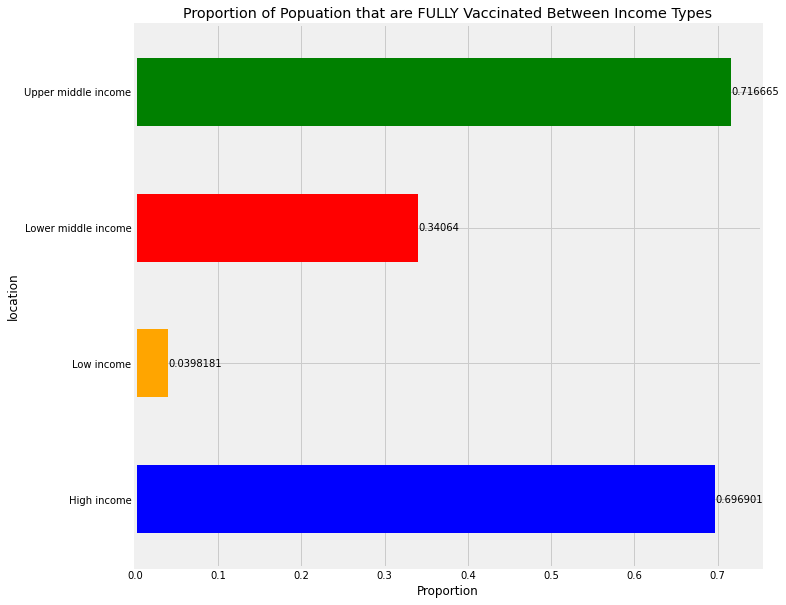

In [212]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that are FULLY Vaccinated Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Income Types 

In [213]:
incomes_covid_data['Proportion_of_cases_of_population'] = incomes_covid_data['total_cases'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_deaths_of_population'] = incomes_covid_data['total_deaths'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_deaths_of_pos_cases'] = incomes_covid_data['total_deaths'] / incomes_covid_data['total_cases']
incomes_covid_data['Proportion_of_vaccinated_of_population'] = incomes_covid_data['people_vaccinated'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_fully_vaccinated_of_population'] = incomes_covid_data['people_fully_vaccinated'] / incomes_covid_data['population']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

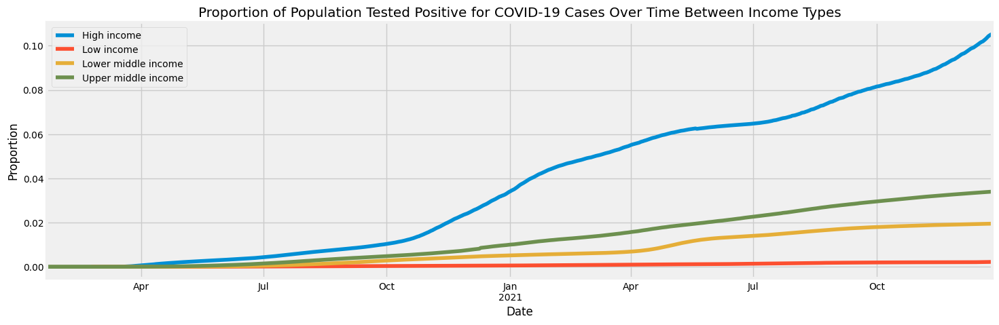

In [214]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

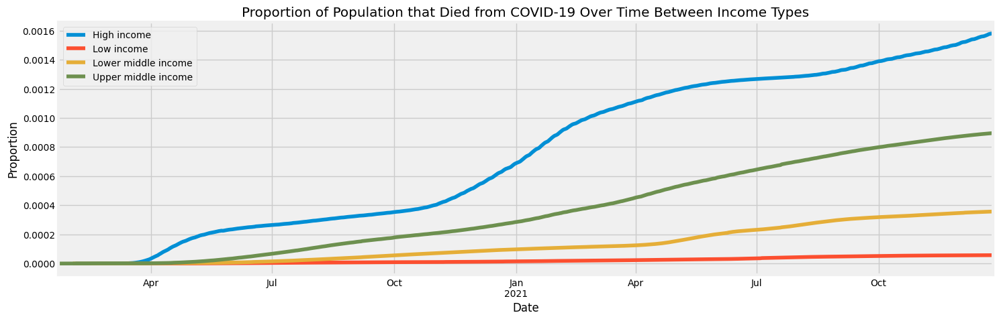

In [215]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
title = 'Proportion of Population that Died from COVID-19 Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

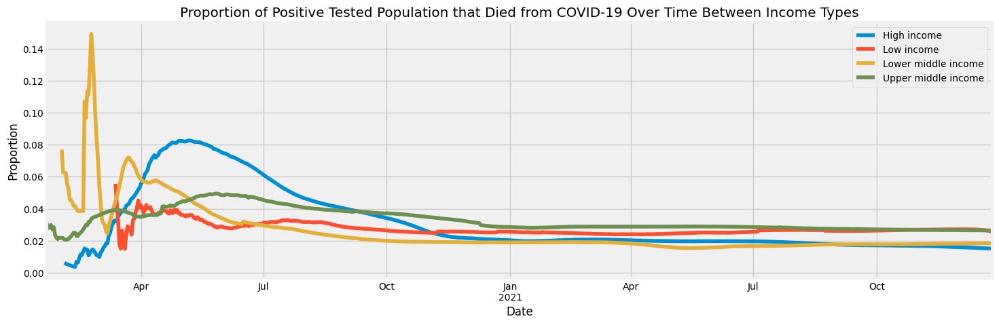

In [216]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

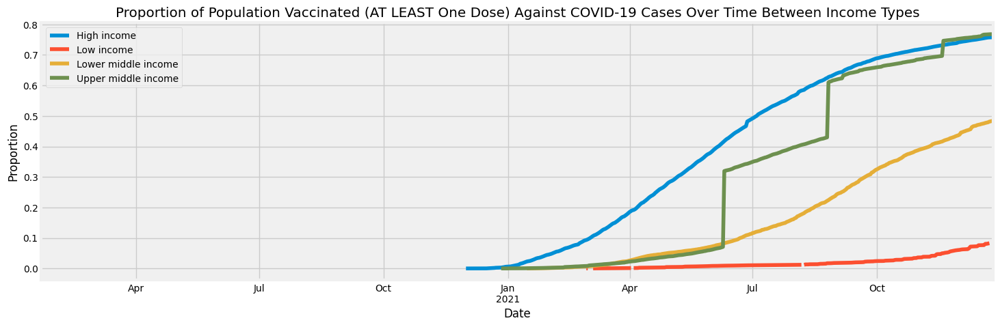

In [217]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

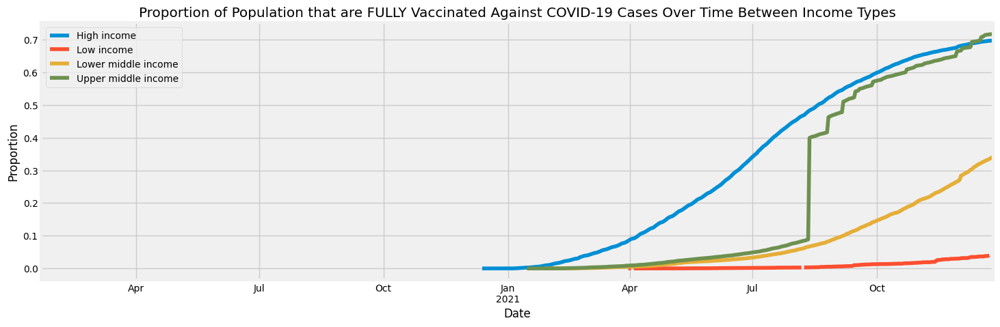

In [218]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Total Number of COVID-Cases Between Income Types

In [219]:
group = incomes_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Between Income Types")
print("                   ")
group

Total Number of COVID-19 Cases Between Income Types
                   


location
High income            128385697.0
Low income               1485067.0
Lower middle income     65021192.0
Upper middle income     84512806.0
Name: new_cases, dtype: float64

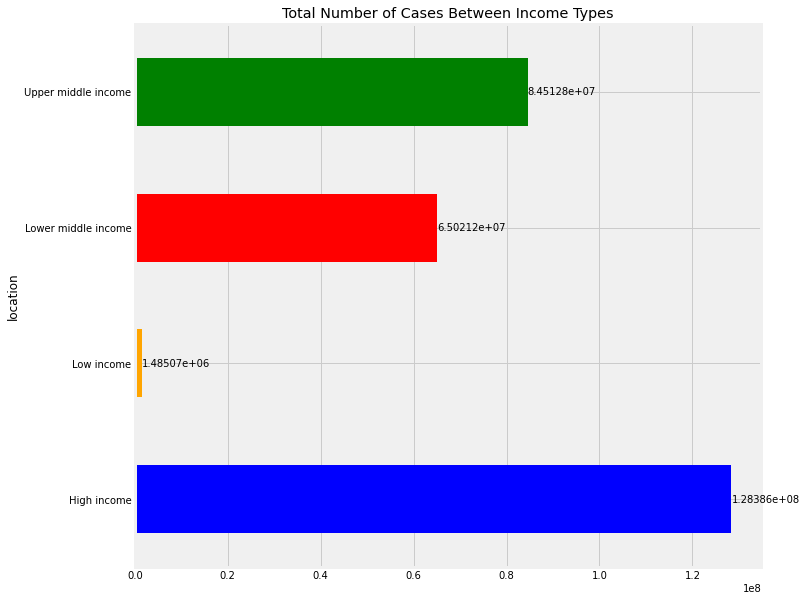

In [220]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Cases Between Income Types")
plt.ylabel("Total Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Income Types

In [221]:
group = incomes_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Between Income Types
                   


location
High income            182107.371631
Low income               2206.637444
Lower middle income     92228.641135
Upper middle income    119876.320567
Name: new_cases, dtype: float64

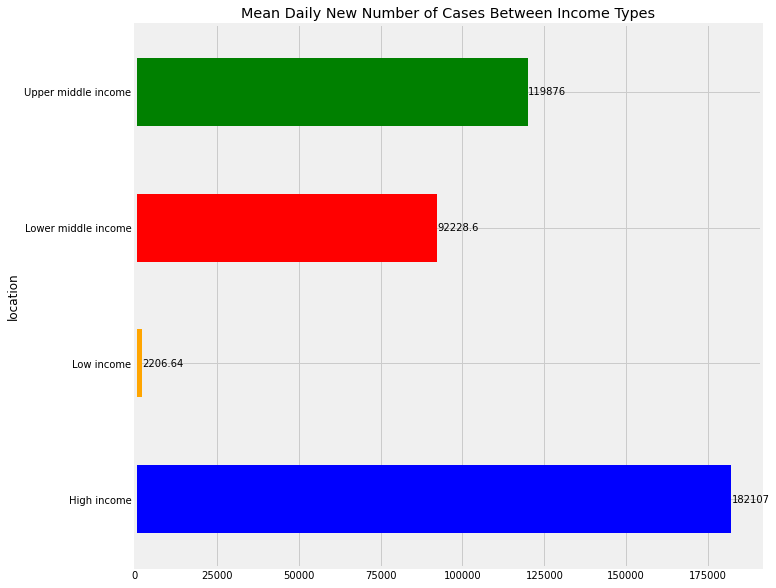

In [222]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Cases Between Income Types")
plt.ylabel("Mean Daily New Number of Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Income Types

In [223]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Between Income Types")
print("                   ")
group

Total Number of COVID-19 Deaths Between Income Types
                   


location
High income            1919961.0
Low income               38125.0
Lower middle income    1182288.0
Upper middle income    2235638.0
Name: new_deaths, dtype: float64

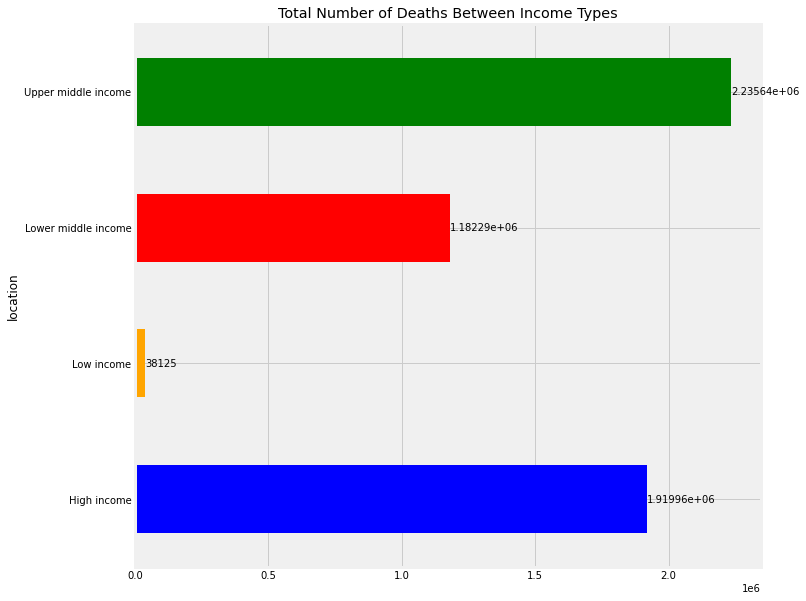

In [224]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Deaths Between Income Types")
plt.ylabel("Total Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Income Types

In [225]:
group = incomes_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Between Income Types
                   


location
High income            2723.348936
Low income               56.649331
Lower middle income    1677.004255
Upper middle income    3171.117730
Name: new_deaths, dtype: float64

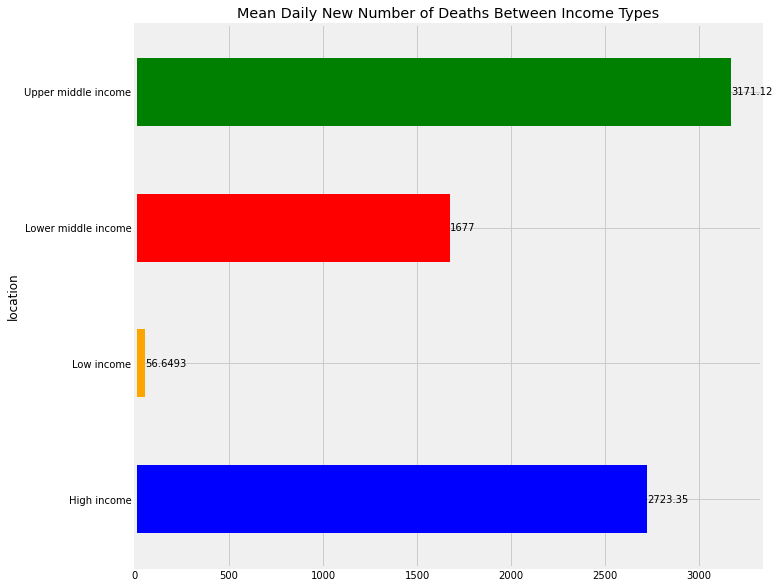

In [226]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Deaths Between Income Types")
plt.ylabel("Mean Daily New Number of Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Income Types

In [227]:
group = incomes_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Between Income Types")
print("                   ")
group

Total Number of COVID-19 Vaccinations Between Income Types
                   


location
High income            2.001453e+09
Low income             7.499719e+07
Lower middle income    2.765733e+09
Upper middle income    4.146097e+09
Name: new_vaccinations, dtype: float64

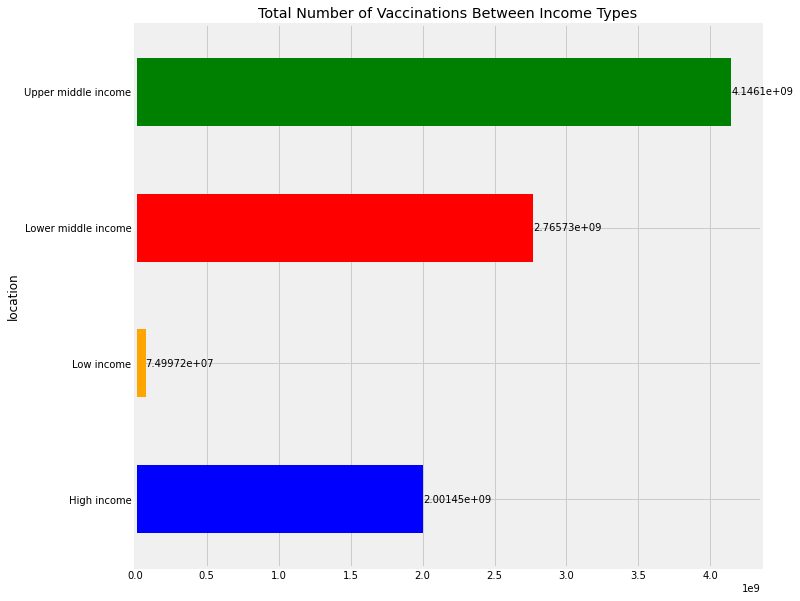

In [228]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinations Between Income Types")
plt.ylabel("Total Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Income Types

In [229]:
group = incomes_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Between Income Types
                   


location
High income            5.131931e+06
Low income             2.586110e+05
Lower middle income    8.016616e+06
Upper middle income    1.139038e+07
Name: new_vaccinations, dtype: float64

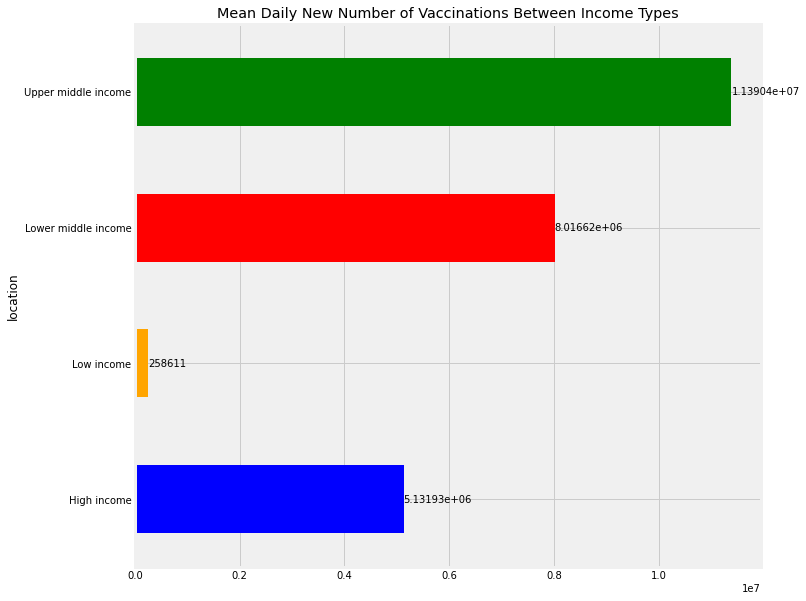

In [230]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Vaccinations Between Income Types")
plt.ylabel("Mean Daily New Number of Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types

In [231]:
group = incomes_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types
                   


location
High income            9.205320e+08
Low income             5.495848e+07
Lower middle income    1.611462e+09
Upper middle income    1.930732e+09
Name: people_vaccinated, dtype: float64

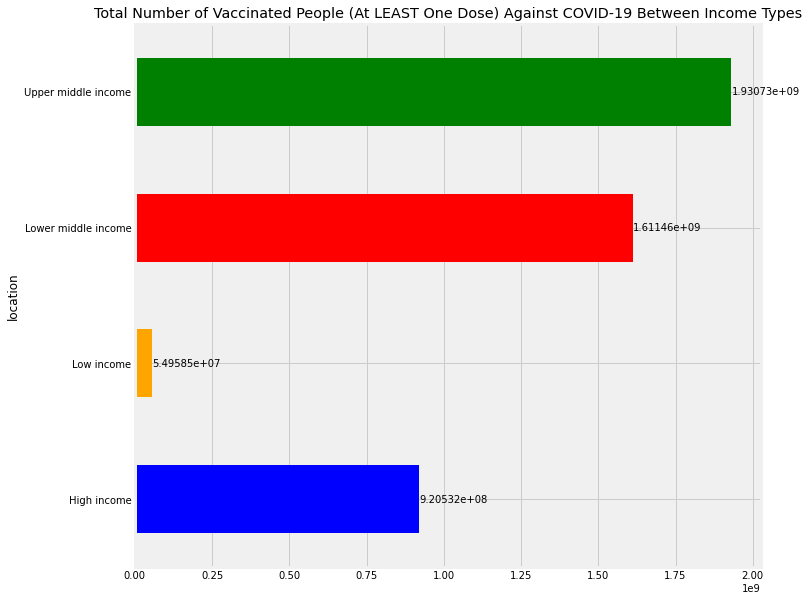

In [232]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types")
plt.ylabel("Total Number of Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Income Types

In [233]:
group = incomes_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Between Income Types")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Between Income Types
                   


location
High income            8.466864e+08
Low income             2.648495e+07
Lower middle income    1.134552e+09
Upper middle income    1.801462e+09
Name: people_fully_vaccinated, dtype: float64

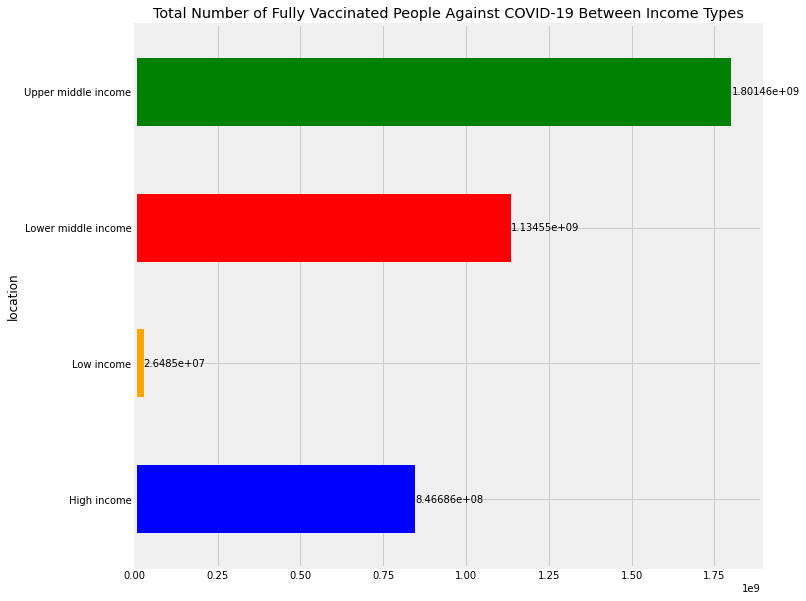

In [234]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Fully Vaccinated People Against COVID-19 Between Income Types")
plt.ylabel("Total Number of Fully Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')